<a href="https://colab.research.google.com/github/d4vidi4n/EL4106/blob/main/ANN_Proy_IC_JE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Preámbulo

In [1]:
import pandas as pd
import torch
import torch.nn as nn
import numpy as np
import time
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

!pip install pytorch-ignite
!pip install early-stopping-pytorch
from ignite.engine import Engine, Events
from ignite.handlers import EarlyStopping
from ignite.metrics import Loss
from early_stopping_pytorch import EarlyStopping
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from statsmodels.tsa.ar_model import AutoReg
import scipy.stats as sp
import gc
import torch.nn.functional as F
from sklearn import svm
from sklearn.feature_selection import SelectFromModel, SelectKBest, f_classif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.2/343.2 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 754.1 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

# Lectura de datos

In [2]:
from google.colab import files
uploaded = files.upload()  # sensorless_tarea3_train.txt
!ls

Saving df_test_no_labels.csv to df_test_no_labels.csv
Saving df_trainval.csv to df_trainval.csv
df_test_no_labels.csv  df_trainval.csv	sample_data


In [3]:
df_trainval = pd.read_csv('df_trainval.csv')
df_test_no_labels = pd.read_csv('df_test_no_labels.csv')
df_trainval
# df_test_no_labels

,R1_0,R1_1,R1_2,R1_3,R1_4,R1_5,R1_6,R1_7,R1_8,R1_9,...,Humidity_119,Humidity_120,Humidity_121,Humidity_122,Humidity_123,Humidity_124,Humidity_125,Humidity_126,Humidity_127,class
0,12.73430,12.73430,12.73420,12.73420,12.73550,12.73560,12.73700,12.73740,12.73710,12.73700,...,60.0959,60.1002,60.1041,60.1076,60.1108,60.1137,60.1163,60.1187,60.1208,1
1,11.51190,11.52490,11.53670,11.54820,11.55860,11.56800,11.57650,11.58420,11.59120,11.59770,...,64.9539,64.9585,64.9626,64.9663,64.9684,64.9687,64.9689,64.9691,64.9693,1
2,10.85570,10.85860,10.86130,10.86350,10.86440,10.86490,10.86450,10.86390,10.86280,10.86110,...,56.4906,56.4957,56.5004,56.5045,56.5083,56.5118,56.5149,56.5151,56.5149,1
3,12.55170,12.55180,12.55190,12.55190,12.55200,12.55200,12.55210,12.55210,12.55220,12.55220,...,64.5927,64.5912,64.5898,64.5886,64.5875,64.5865,64.5855,64.5847,64.5839,1
4,8.78442,8.77909,8.77488,8.77016,8.76573,8.76157,8.75735,8.75307,8.74919,8.74538,...,58.2097,58.2229,58.2348,58.2456,58.2553,58.2642,58.2722,58.2794,58.2948,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8791,12.39290,12.39290,12.39260,12.39240,12.39260,12.39240,12.39240,12.39290,12.39280,12.39260,...,49.8931,49.8782,49.8613,49.8459,49.8321,49.8195,49.8082,49.7979,49.7878,3
8792,12.83420,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,12.83410,...,53.2695,53.2648,53.2605,53.2592,53.2585,53.2578,53.2572,53.2567,53.2562,3
8793,11.99420,11.99420,11.99400,11.99400,11.99380,11.99390,11.99390,11.99350,11.99360,11.99370,...,67.2733,67.2698,67.2665,67.2636,67.3011,67.3350,67.3656,67.3934,67.4185,3
8794,12.94500,12.94540,12.94560,12.94460,12.94370,12.94260,12.94080,12.94000,12.93950,12.93910,...,52.3949,52.3953,52.3956,52.3960,52.3963,52.3965,52.3968,52.3970,52.3989,3


# Definición de las características

Vector de cálculo de características (Media, Varianza, etc) ()

In [4]:
from statsmodels.tsa.ar_model import AutoReg

def get_single_ar_coeff(signal, order=3, method='mean'):
    try:
        model = AutoReg(signal, lags=order, old_names=False)
        result = model.fit()
        coeffs = result.params[1:]  # Ignorar el intercepto
        if method == 'mean':
            return np.mean(coeffs)
        elif method == 'norm':
            return np.linalg.norm(coeffs)
        elif method == 'first':
            return coeffs[0]
        elif method == 'max_abs':
            return coeffs[np.argmax(np.abs(coeffs))]
        else:
            return np.nan
    except:
        return np.nan

In [5]:
def extract_features(signal):
  STD_THRESHOLD = 1e-12

  is_constant = np.std(signal) < STD_THRESHOLD
  # is_constant = np.std(signal) == 0
  is_too_short = len(signal) < 2

  return {
      'mean': np.mean(signal),
      'var': np.var(signal),
      'mad': np.median(np.abs(signal - np.median(signal))),
      'max': np.max(signal),
      'min': np.min(signal),
      'ran': np.max(signal) - np.min(signal),
      'sma': np.sum(np.abs(signal)),
      'enrgy': np.sum(signal**2) / len(signal),
      'iqr': sp.iqr(signal),
      'entpy': sp.entropy(signal),
      'arCoeff': get_single_ar_coeff(signal),  # Placeholder; lo puedes reemplazar cuando tengas la función
      'corr': 0.0 if is_constant or is_too_short else np.corrcoef(signal[:-1], signal[1:])[0, 1]
  }

def calculation_feature_vector(df_data):
    sensors = [f'R{j}' for j in range(1, 9)] + ['Humidity']
    feature_list = []

    # for idx, row in df_data[8215:8220].iterrows():
    # for idx, row in df_data[8216:8217].iterrows(): #Dato problemático -> df_data.iloc[8216]
    for idx, row in df_data.iterrows():
        features = {}
        for sensor in sensors:
            start_col = f'{sensor}_0'
            end_col = f'{sensor}_127'
            signal = row[start_col:end_col].to_numpy()
            feats = extract_features(signal)
            # Prefix feature names with sensor ID
            feats_prefixed = {f'{key}_{sensor}': value for key, value in feats.items()}
            features.update(feats_prefixed)
        if 'class' in df_data.columns:
            features['class'] = row['class']
        feature_list.append(features)

    df_features = pd.DataFrame(feature_list)
    return df_features

In [6]:
train_val_data = calculation_feature_vector(df_trainval)
df_test_data = calculation_feature_vector(df_test_no_labels)

In [7]:
df_train, df_val = train_test_split(train_val_data, test_size=0.3, random_state=10, stratify=train_val_data['class'])

df_train_GS, df_val_GS = train_test_split(df_val, test_size=0.3, random_state=10, stratify=df_val['class'])

df_test = df_test_data.copy()

In [8]:
# df_test = calculation_feature_vector(df_test_no_labels)
scaler = StandardScaler().fit(df_train.iloc[:,0:-1])

df_train.iloc[:,0:-1] = scaler.transform(df_train.iloc[:,0:-1])
df_val.iloc[:,0:-1] = scaler.transform(df_val.iloc[:,0:-1])
df_test.iloc[:,:] = scaler.transform(df_test_data.iloc[:,0:])

df_train_GS.iloc[:,0:-1] = scaler.transform(df_train_GS.iloc[:,0:-1])
df_val_GS.iloc[:,0:-1] = scaler.transform(df_val_GS.iloc[:,0:-1])

df_train_w_class = df_train.copy()
df_val_w_class = df_val.copy()

df_train_GS_w_class = df_train_GS.copy()
df_val_GS_w_class = df_val_GS.copy()

y_train = df_train.pop('class')# - 1
y_val = df_val.pop('class')# - 1

y_train_GS = df_train_GS.pop('class')# - 1
y_val_GS = df_val_GS.pop('class')# - 1

In [9]:
df_val_w_class

,mean_R1,var_R1,mad_R1,max_R1,min_R1,ran_R1,sma_R1,enrgy_R1,iqr_R1,entpy_R1,...,max_Humidity,min_Humidity,ran_Humidity,sma_Humidity,enrgy_Humidity,iqr_Humidity,entpy_Humidity,arCoeff_Humidity,corr_Humidity,class
239,1.096543,-0.158607,-0.304521,1.117704,1.066853,-0.364152,1.096543,1.194178,-0.319017,0.136616,...,-0.173576,-0.095768,-0.712138,-0.133996,-0.171332,-0.553655,0.238132,0.062845,0.346398,1.0
5350,0.514111,-0.156605,-0.192896,0.500405,0.520910,-0.294782,0.514111,0.528180,-0.226845,0.135501,...,-1.280577,-1.353502,0.493322,-1.277434,-1.220930,-0.200599,0.038187,0.312768,-0.353743,1.0
7493,-2.436857,-0.158313,-0.267081,-2.696413,-2.173449,-0.340265,-2.436857,-2.452145,-0.299145,0.136288,...,-0.864471,-0.855229,-0.186394,-0.857180,-0.847699,-0.045940,0.172149,0.173199,0.018813,2.0
6571,0.818759,-0.158171,-0.240735,0.818439,0.808927,-0.351063,0.818759,0.873338,-0.278287,0.136381,...,-0.175231,-0.107613,-0.621816,-0.140114,-0.177233,-0.530681,0.235845,0.753173,0.627022,2.0
6549,0.634276,-0.158563,-0.326707,0.621760,0.644714,-0.358589,0.634276,0.663481,-0.325923,0.136586,...,0.660413,0.690633,-0.188785,0.672947,0.634271,-0.106809,0.183043,0.178517,0.475780,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5597,-5.223277,4.343969,1.097718,-4.741692,-5.646002,4.955066,-5.223277,-4.644852,6.441921,-6.597329,...,-0.555134,-0.899213,2.989597,-0.664565,-0.670685,4.095286,-3.242779,0.834277,0.699856,1.0
3566,0.445346,-0.157118,-0.269161,0.419248,0.452345,-0.295437,0.445346,0.451239,-0.266871,0.135775,...,-0.643925,-0.663743,0.098369,-0.651800,-0.659964,0.259590,0.095930,-0.378238,-0.287835,3.0
2263,-1.541668,-0.109294,0.395039,-1.625143,-1.442766,0.199310,-1.541668,-1.617419,0.290112,0.099791,...,-0.273971,-0.209786,-0.603237,-0.244440,-0.277415,-0.483233,0.234489,0.325770,-0.261220,2.0
2105,0.005850,-0.083495,0.563515,0.068372,-0.062325,0.366189,0.005850,-0.031779,0.365795,0.092024,...,-0.570028,-0.779728,1.794070,-0.739110,-0.740035,0.156405,-0.395514,-0.191735,0.477835,2.0


## Crear datasets y dataloaders para pytorch (train)

In [10]:
# Crear datasets
feats_train = df_train.to_numpy()[:,0:108].astype(np.float32)
labels_train = df_train_w_class.to_numpy()[:,108].astype(int) - 1
dataset_train = [ {"features":feats_train[i,:], "labels":labels_train[i]} for i in range(feats_train.shape[0]) ]

feats_val = df_val.to_numpy()[:,0:108].astype(np.float32)
labels_val = df_val_w_class.to_numpy()[:,108].astype(int) - 1
dataset_val = [ {"features":feats_val[i,:], "labels":labels_val[i]} for i in range(feats_val.shape[0]) ]

feats_test = df_test.to_numpy()[:,:].astype(np.float32)
dataset_test = [ {"features":feats_test[i,:]} for i in range(feats_test.shape[0]) ]

Subconjutos del conjunto de validación para Grid Search


In [11]:
feats_train_GS = df_train_GS.to_numpy()[:,0:108].astype(np.float32)
labels_train_GS = df_train_GS_w_class.to_numpy()[:,108].astype(int) - 1
dataset_train_GS = [ {"features":feats_train_GS[i,:], "labels":labels_train_GS[i]} for i in range(feats_train_GS.shape[0]) ]

feats_val_GS = df_val_GS.to_numpy()[:,0:108].astype(np.float32)
labels_val_GS = df_val_GS_w_class.to_numpy()[:,108].astype(int) - 1
dataset_val_GS = [ {"features":feats_val_GS[i,:], "labels":labels_val_GS[i]} for i in range(feats_val_GS.shape[0]) ]

In [12]:
# Crear dataloaders
dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=128, shuffle=True, num_workers=0)
dataloader_val = torch.utils.data.DataLoader(dataset_val, batch_size=128, shuffle=True, num_workers=0)
dataloader_test = torch.utils.data.DataLoader(dataset_test, batch_size=128, shuffle=True, num_workers=0)

dataloader_train_GS = torch.utils.data.DataLoader(dataset_train_GS, batch_size=128, shuffle=True, num_workers=0)
dataloader_val_GS = torch.utils.data.DataLoader(dataset_val_GS, batch_size=128, shuffle=True, num_workers=0)

In [13]:
torch.cuda.empty_cache()

## Entrenamiento y validación

Se define una modificación del código base de EarlyStopping de Pytorch con el propósito de evitar que imprima cada vez que está guardando el modelo y la cuenta de cuantas épocas han pasado desde que el loss comenzó a subir de nuevo

In [14]:
# Sustituye esto:
from early_stopping_pytorch import EarlyStopping

# Por esto (versión propia):
class EarlyStoppingCustom:
    def __init__(self, patience=15, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float("inf")

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Guarda el modelo si ha habido mejora'''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), 'best_model.pt')
        self.val_loss_min = val_loss


Esta función se utiliza para entrenar el modelo y validarlo

In [15]:
# def train_model(model, patience, n_epochs, optimizer):
def train_model_generic(model, patience, n_epochs, optimizer, dataloader_tr, dataloader_vl):

  # Listas para guardar valores de loss por cada batch y por cada época
  train_losses = []
  valid_losses = []
  # Listas para guardar los pesos de cada batch, depende del tamaño de cada batch, esto es importante porque el último batch siempre es más pequeño
  batch_weights_train = []
  batch_weights_val = []
  # Listas para guardar la pérdida promedio de cada época
  avg_train_losses = []
  avg_valid_losses = []
  #Bandera para guardar el modelo una única vez bajo el nombre best_model.pt
  model_saved = False

  # initialize the early_stopping object
  early_stopping = EarlyStoppingCustom(patience=patience, verbose=False)

  start = time.time()
  for epoch in range(1, n_epochs + 1):

    # Entrenamiento
    model.train() # prep model for training

    for batch in dataloader_train:
      inputs = batch["features"].to(device)
      targets = batch["labels"].to(device) # Correponde a las clases de los datos

      # Igualar a 0 los gradientes de todas las variables optimizadas
      optimizer.zero_grad()
      # Predicciones
      output = model(inputs)
      # Cálculo de la pérdida
      loss = criterion(output, targets)
      # backward pass
      loss.backward()
      # Actualización de parámetros de la red (mediante Adam)
      optimizer.step()
      train_losses.append(loss.item())
      batch_weights_train.append(targets.size(0))

    # Validación
    model.eval()
    with torch.no_grad():
      for batch in dataloader_val:
        inputs = batch["features"].to(device)
        targets = batch["labels"].to(device)

        # Predicciones
        output = model(inputs)
        # Cálculo de la pérdida
        loss = criterion(output, targets)
        # Loss de validación de un solo batch
        valid_losses.append(loss.item())
        batch_weights_val.append(targets.size(0))


    train_loss = np.average(np.array(train_losses), weights = np.array(batch_weights_train))
    valid_loss = np.average(np.array(valid_losses), weights = np.array(batch_weights_val))

    # Se calcula el promedio del loss de todas las épocas
    avg_train_losses.append(train_loss)
    avg_valid_losses.append(valid_loss)

    epoch_len = len(str(n_epochs))

    print_msg = (f'[{epoch:>{epoch_len}}/{n_epochs:>{epoch_len}}] ' + f'train_loss: {train_loss:.6f} ' + f'valid_loss: {valid_loss:.6f}')
    # print(print_msg)

    # Se reinician las listas para guardar los valores de loss y los pesos de cada batch de la siguiente época
    train_losses = []
    valid_losses = []
    batch_weights_train = []
    batch_weights_val = []

    early_stopping(valid_loss, model)

    if early_stopping.early_stop and not model_saved:
        best_epoch = epoch - patience
        val_loss_min = avg_valid_losses[best_epoch - 1]
        print('Early stopping at -------------------------------------------------->',best_epoch)
        torch.save(model.state_dict(), 'best_model.pt') # En la línea a continuación se guarda el último checkpoint guardado por earlystopping, despues no se vuelve a guardar bajo este mismo nombre, de manera que este es el mejor modelo basado en patience early stopping
        model_saved = True
        training_time = time.time() - start # Se calcula aqui porque el modelo puede terminar de entrenarse antes de las 1000 épocas, por lo tanto, no sería correcto calcularlo al final, ya que el loss de validación y entrenamiento que se sigue calculando es para ver que tanto diverge el de validación en comparación al de entrenamiento para la totalidad de las épocas

  # Cargar el mejor modelo guardado con el criterio de patience early stopping
  model.load_state_dict(torch.load('best_model.pt', weights_only=True))
  print(f"Mejor modelo en la época {best_epoch} con loss de validación = {val_loss_min:.6f}")

  return  model, avg_train_losses, avg_valid_losses, training_time, best_epoch, dataloader_tr, dataloader_vl

## Gráficos de resultados

In [16]:
def results_ANN(model, train_loss_values, valid_loss_values, t_time, best_ep, dataloader_tr, dataloader_vl):
    os.makedirs(ruta, exist_ok=True)

    # Obtener el nombre del modelo
    nombre_red = model.name  # Devuelve: 'MiRed'
    epochs = np.linspace(1, len(train_loss_values), len(train_loss_values))
    loss_valid_best_epoch = valid_loss_values[best_ep - 1]
    loss_train_best_epoch = train_loss_values[best_ep - 1]

    # Gráfico de loss de validación y entrenamiento
    prop = 0.95
    figsize = (prop*6.4, 0.95*4.8)
    plt.figure(figsize = figsize)
    plt.plot(epochs, train_loss_values, lw=1, color='blue', label='Train')
    plt.plot(epochs, valid_loss_values, lw=1, color='red', label='Validation')
    plt.axvline(x=best_ep, color='black', ls='--', lw=1)#, label='Best epoch')
    plt.text(x=best_ep, y=0.8, s=f'Valid Loss: {loss_valid_best_epoch:.4f}\nTrain Loss: {loss_train_best_epoch:.4f}\nBest epoch: {best_ep}', fontsize=8, fontfamily='sans-serif', verticalalignment='top', horizontalalignment='left', bbox=dict(facecolor='yellow', boxstyle='round', alpha=1))
    plt.text(x=0, y=0.02, s=f'Tiempo de entrenamiento: {t_time:.2f} [s]', fontsize=8, fontfamily='sans-serif', verticalalignment='bottom', horizontalalignment='left', bbox=dict(facecolor='yellow', boxstyle='round', alpha=1))
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.ylim(-0.05,1)
    if nombre_red[-6] != '1':
      plt.title(f'Loss de entrenamiento y validación, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}')
    else:
      plt.title(f'Loss de entrenamiento y validación, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}')
    plt.grid()
    plt.legend()
    plt.savefig(f'{ruta}loss_epoch{nombre_red[5:]}.svg')

    # Matriz de confusión normalizada - Conjunto de entrenamiento
    model.eval()
    all_preds = []
    all_labels = []
    correct_total = 0
    total = 0

    with torch.no_grad():
      for batch in dataloader_train:
          inputs = batch["features"].to(device)
          targets = batch["labels"].to(device)

          # Predicciones
          output = model(inputs)
          output = torch.softmax(output, dim=1)  # predictions.shape = [batch_size]

          # Acumula las predicciones y etiquetas
          out = torch.argmax(output, dim=1)  # Forma [batch_size]
          all_preds.append(out.cpu().numpy())
          all_labels.append(targets.cpu().numpy())

          # Contar aciertos en este batch
          predicted_classes = torch.argmax(output, dim=1)  # Forma [batch_size]
          correct = (predicted_classes == targets).sum().item()
          correct_total += correct # Contador de predicciones correctas
          total += targets.size(0) #Tamaño de cada batch

    # Concatenar todas las predicciones y etiquetas
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    # Precisión
    accuracy_tr = correct_total / total

    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(np.round(confusion_matrix(all_labels, all_preds, normalize='true'), decimals=4))#, display_labels=labels_train)
    disp.plot(cmap='RdPu')

    if nombre_red[-6] != '1':
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de entrenamiento, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    else:
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de entrenamiento, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)

    plt.title(f'Accuracy = {accuracy_tr:.4f}', fontsize = 10)
    plt.savefig(f'{ruta}conf_mat_train{nombre_red[5:]}.svg', bbox_inches='tight')


    # Matriz de confusión normalizada - Conjunto de validación
    all_preds = []
    all_labels = []
    correct_total = 0
    total = 0
    with torch.no_grad():

      for batch in dataloader_val:
          inputs = batch["features"].to(device)
          targets = batch["labels"].to(device)

          # Predicciones
          output = model(inputs)
          output = torch.softmax(output, dim=1)  # predictions.shape = [batch_size]

          # Acumula las predicciones y etiquetas
          out = torch.argmax(output, dim=1)  # Forma [batch_size]
          all_preds.append(out.cpu().numpy())
          all_labels.append(targets.cpu().numpy())

          # Contar aciertos en este batch
          predicted_classes = torch.argmax(output, dim=1)  # Forma [batch_size]
          correct = (predicted_classes == targets).sum().item()
          correct_total += correct # Contador de predicciones correctas
          total += targets.size(0) #Tamaño de cada batch

    # Concatenar todas las predicciones y etiquetas
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    # Precisión
    accuracy_vl = correct_total / total
    # print(f"Accuracy promedio conjunto de entrenamiento: {accuracy:.4f}")

    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(np.round(confusion_matrix(all_labels, all_preds, normalize='true'), decimals=4))#, display_labels=labels_train)
    disp.plot(cmap='RdPu')
    if nombre_red[-6] != '1':
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de validación, ANN de\n{nombre_red[-6]} capas ocultas de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    else:
      plt.suptitle(f'Matriz de confusión normalizada del conjunto de validación, ANN de\ncapa oculta de {nombre_red[6:-8]} neuronas y función de activación {nombre_red[-4:]}', x=0.5, y=1.01, fontsize=11)
    plt.title(f'Accuracy = {accuracy_vl:.4f}', fontsize = 10)
    plt.savefig(f'{ruta}conf_mat_val{nombre_red[5:]}.svg', bbox_inches='tight')

    plt.show()

    return accuracy_vl

## Función para crear dataloaders de conjunto completos

In [17]:
def dataloader_creator(X_train, y_train, X_val, y_val, X_test, batch_size=128):

    # Convertir todo a numpy y tipos correctos
    X_train = np.array(X_train)
    y_train = np.array(y_train).astype(int)

    X_val = np.array(X_val)
    y_val = np.array(y_val).astype(int)

    X_test = np.array(X_test)

    # Dataset de entrenamiento y validación
    dataset_train = [{"features": X_train[i], "labels": y_train[i]} for i in range(len(y_train))]
    dataset_val   = [{"features": X_val[i],   "labels": y_val[i]}   for i in range(len(y_val))]

    # Dataset de test (sin etiquetas)
    dataset_test  = [{"features": X_test[i]} for i in range(len(X_test))]

    # DataLoaders
    dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
    dataloader_val   = torch.utils.data.DataLoader(dataset_val, batch_size=batch_size, shuffle=False)
    dataloader_test  = torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

    return dataloader_train, dataloader_val, dataloader_test

## Función para crear el dataloader de los conjuntos reducidos de características

In [18]:
def dataloader_creator_GS(df_features, labels, batch_size=128, test_size=0.3, random_state=10):

    labels = np.array(labels).astype(int)

    # Separar datos
    X_train, X_val, y_train, y_val = train_test_split(
        df_features.to_numpy().astype(np.float32),
        labels,
        test_size=test_size,
        random_state=random_state,
        stratify=labels
    )

    # Crear datasets como listas de diccionarios
    dataset_train = [{"features": X_train[i], "labels": y_train[i]} for i in range(len(y_train))]
    dataset_val   = [{"features": X_val[i],   "labels": y_val[i]}   for i in range(len(y_val))]

    # Crear DataLoaders
    dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
    dataloader_val   = torch.utils.data.DataLoader(dataset_val,   batch_size=batch_size, shuffle=False)

    return dataloader_train, dataloader_val


## Dispositivo y función de Loss

In [19]:
device = torch.device('cuda')
criterion = nn.CrossEntropyLoss()

# Grid Search para encontrar los mejores hiperparámetros de la ANN


Se define un subconjunto de entrenamiento y validación a partir del conjunto de validación, esto se hace para encontrar los mejores hiperparámetros de la red, tales como la función de activación, el número de capas ocultas y el número de perceptrones en las capas ocultas

In [20]:
def GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dl_train, dl_val):
  res = []

  for h in hidden_sizes:
      for act_name, act_func in activations.items():
          for layers in num_hidden_layers:
              for lr in learning_rates:
                  layers_list = [nn.Linear(108, h)]
                  for _ in range(layers - 1):
                      layers_list.append(nn.Linear(h, h))
                  layers_list.append(act_func())
                  layers_list.append(nn.Linear(h, 3))

                  model = nn.Sequential(*layers_list).to(device)
                  model.name = f'model_{h}co{layers}_{act_name}'
                  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

                  print(f'\nEntrenando: {model.name} con LR={lr}')
                  model_validated, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model, patience=patience, n_epochs=n_epochs, optimizer=optimizer, dataloader_tr=dl_train, dataloader_vl=dl_val)
                  # model_validated, train_loss, valid_loss, t_time, best_ep = validate_model(model, patience=15, n_epochs=400, optimizer=optimizer)
                  acc_val_GS = results_ANN(model_validated, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

                  # Guardar resultados
                  res.append({
                      "name": model.name,
                      "activation": act_func,
                      "layers": layers,
                      "hidden_size": h,
                      "lr": lr,
                      "valid_loss": valid_loss[best_ep - 1],
                      "train_loss": train_loss[best_ep - 1],
                      "best_epoch": best_ep,
                      "time": t_time,
                      "acc_val": acc_val_GS})

                  # Liberar modelo y memoria GPU
                  del model
                  del optimizer
                  torch.cuda.empty_cache()
                  gc.collect()

  res = pd.DataFrame(res).sort_values(by='acc_val', ascending=False)
  res.index = np.arange(1, len(res) + 1)  # Índice desde 1
  return res

Función para construir una ANN a partir del mejor resultado del Grid Search

In [21]:
def ANN_by_name(res):
  model_name = res.iloc[0,0]

  h = res.iloc[0,3]
  n = res.iloc[0,2]
  activ_funct = res.iloc[0,1]
  lr = res.iloc[0,4]

  layers_list = [nn.Linear(108, h)]
  for _ in range(n - 1):
      layers_list.append(nn.Linear(h, h))

  layers_list.append(activ_funct())
  layers_list.append(nn.Linear(h, 3))

  model = nn.Sequential(*layers_list).to(device)
  model.name = model_name

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  return model, optimizer

In [36]:
def ANN_by_name_v2(res):
  model_name = res.iloc[0,0]

  h = res.iloc[0,3]
  n = res.iloc[0,2]
  activ_funct = res.iloc[0,1]
  lr = res.iloc[0,4]

  layers_list = [nn.Linear(108, h)]
  for _ in range(n - 1):
      layers_list.append(nn.Linear(h, h))
      layers_list.append(activ_funct())

  # layers_list.append(activ_funct())
  layers_list.append(nn.Linear(h, 3))

  model = nn.Sequential(*layers_list).to(device)
  model.name = model_name

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  return model, optimizer

Ejecución del Grid Search utilizando el conjunto de validación


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 106
Mejor modelo en la época 106 con loss de validación = 0.431519


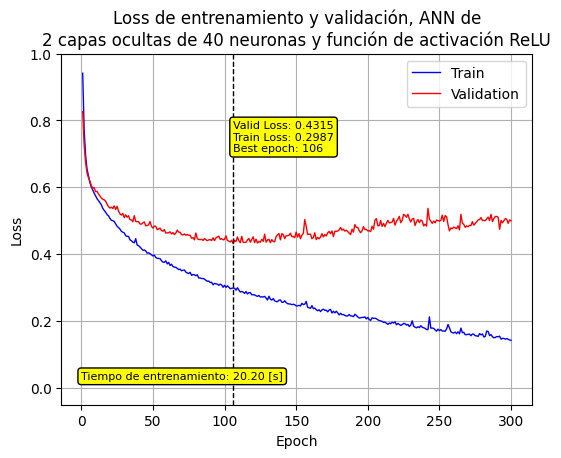

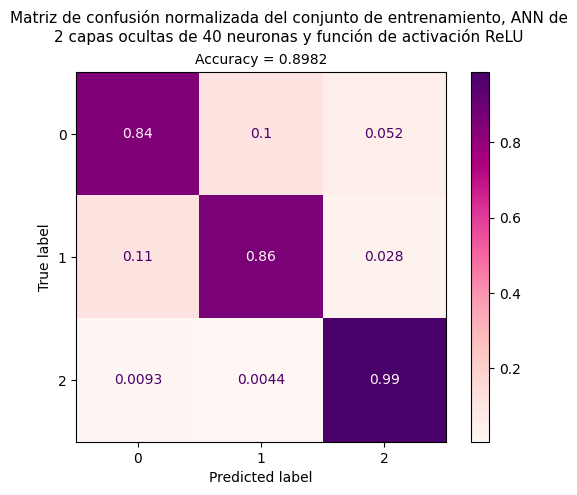

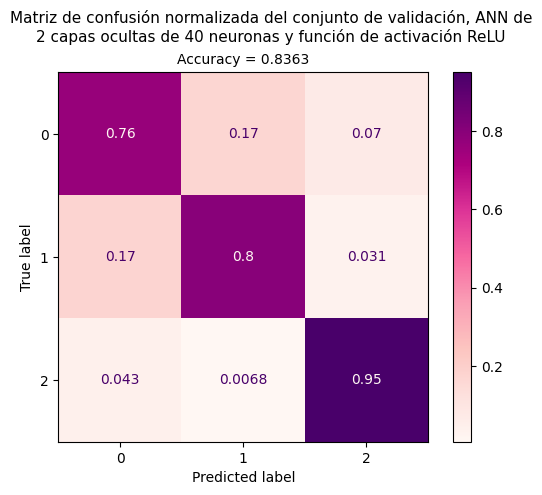


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 84
Mejor modelo en la época 84 con loss de validación = 0.455472


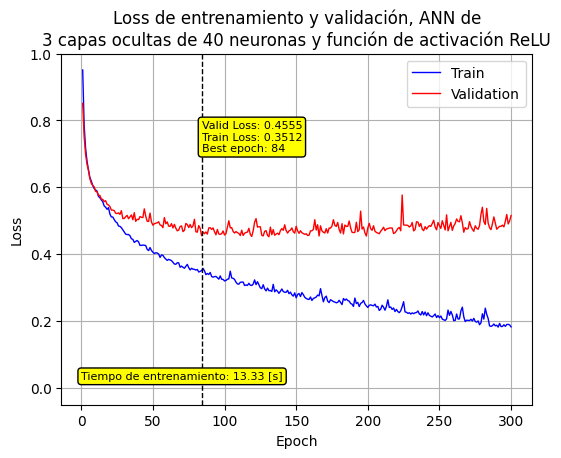

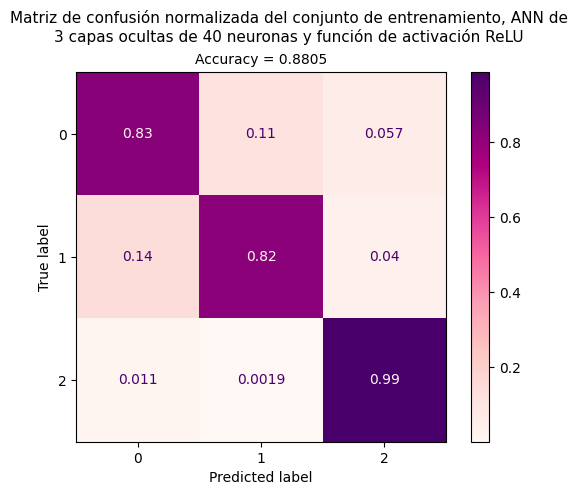

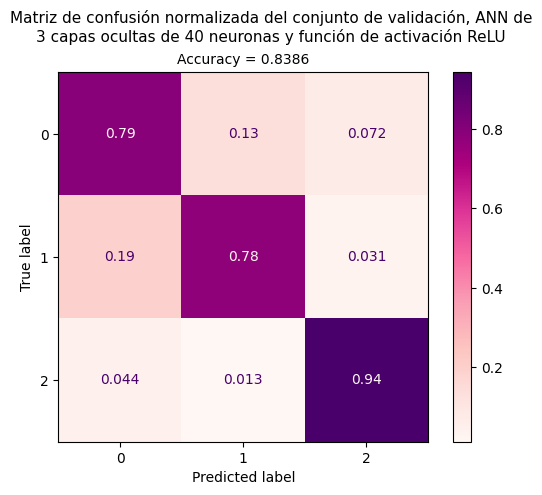


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 127
Mejor modelo en la época 127 con loss de validación = 0.381978


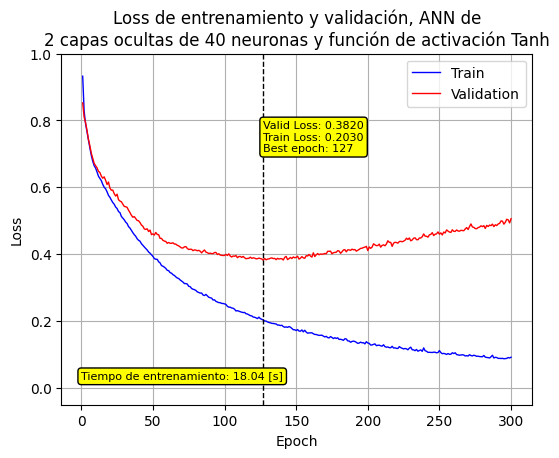

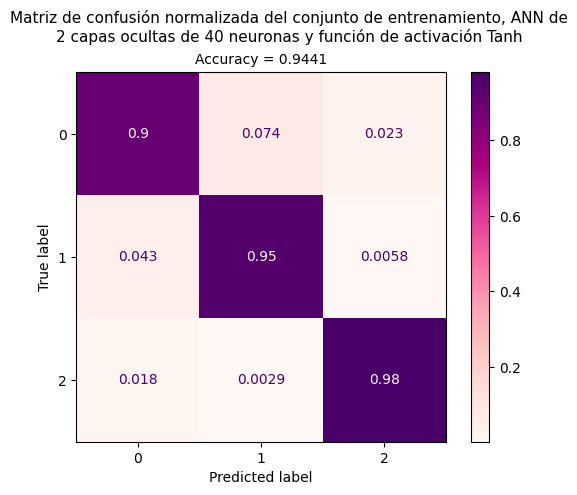

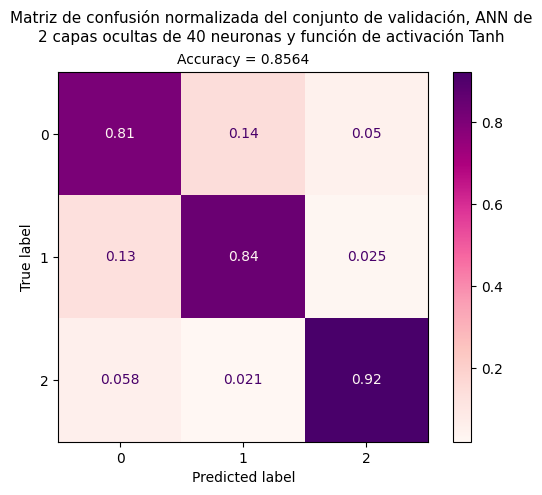


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 145
Mejor modelo en la época 145 con loss de validación = 0.416895


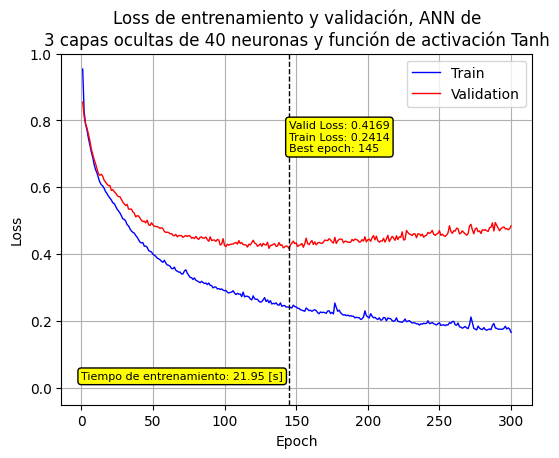

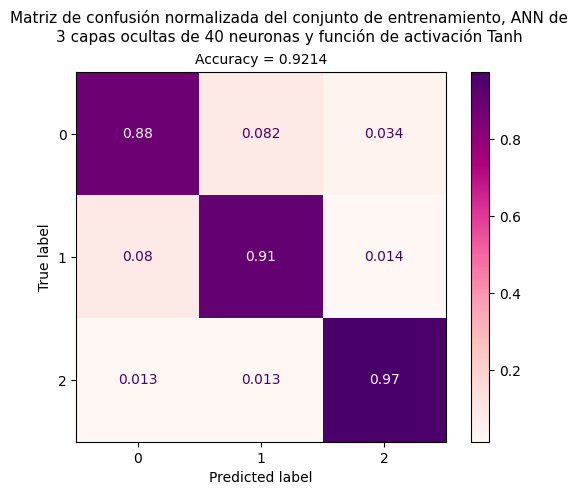

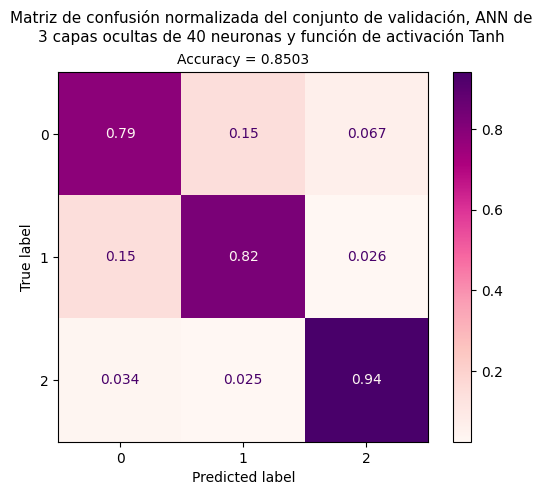


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 76
Mejor modelo en la época 76 con loss de validación = 0.365555


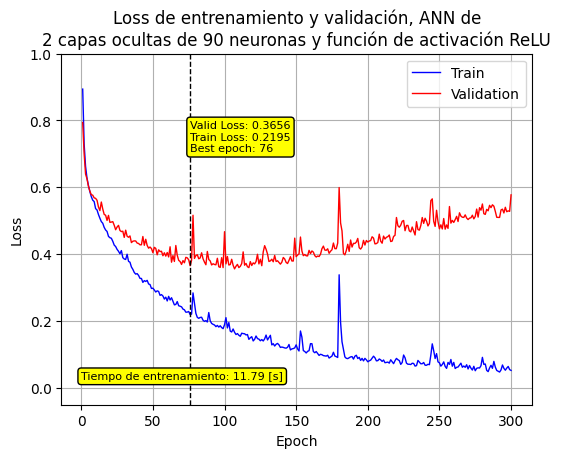

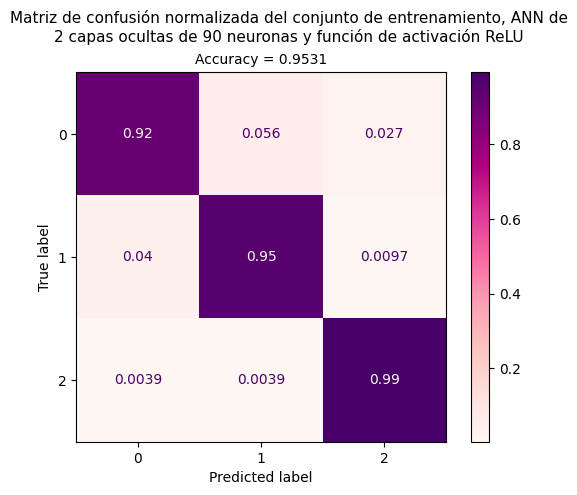

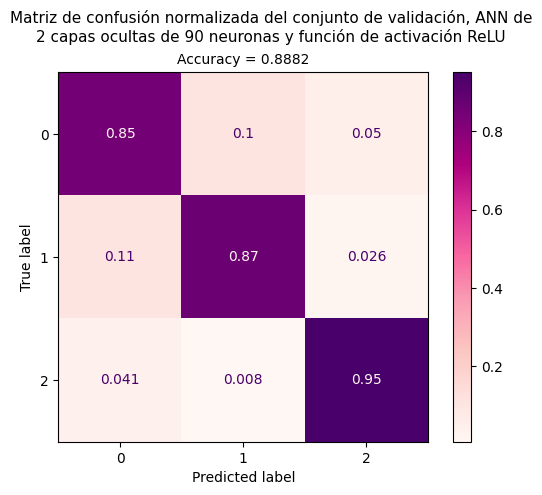


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 48
Mejor modelo en la época 48 con loss de validación = 0.386452


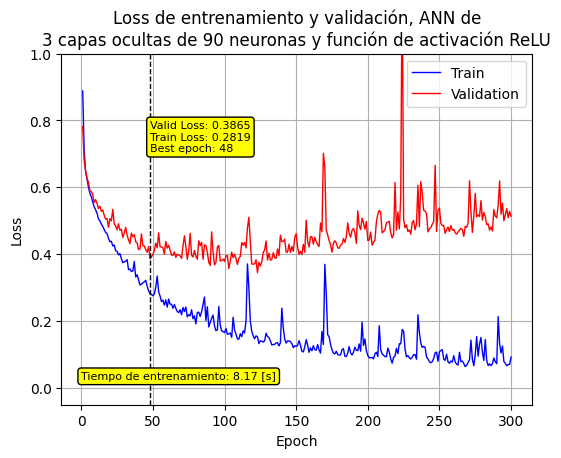

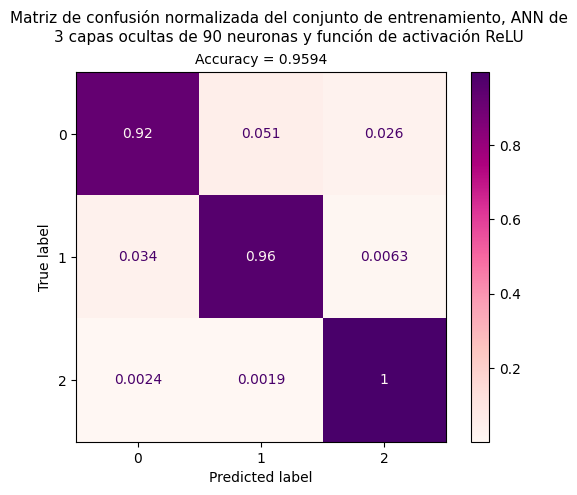

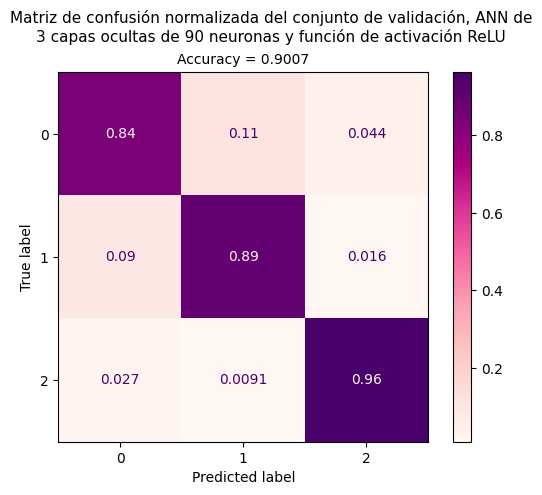


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 85
Mejor modelo en la época 85 con loss de validación = 0.313516


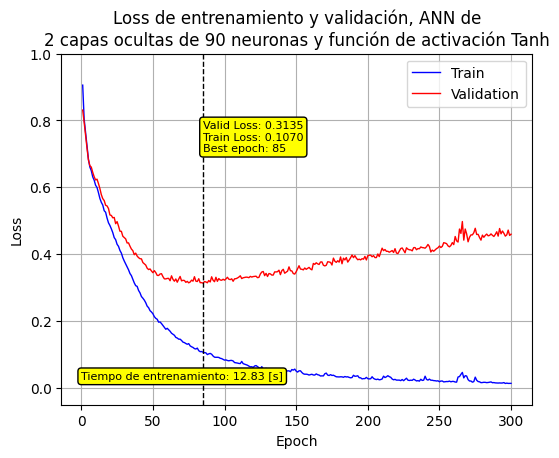

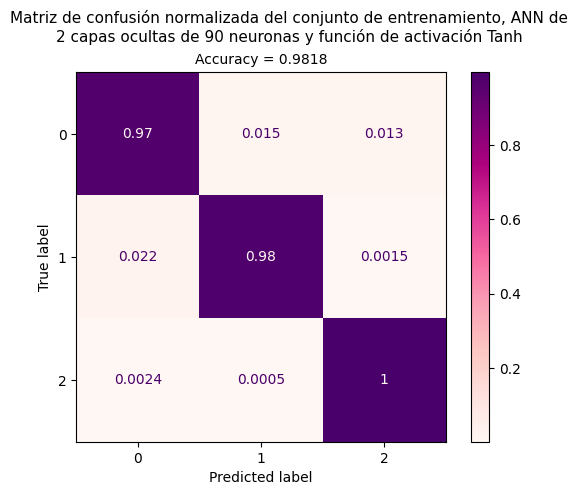

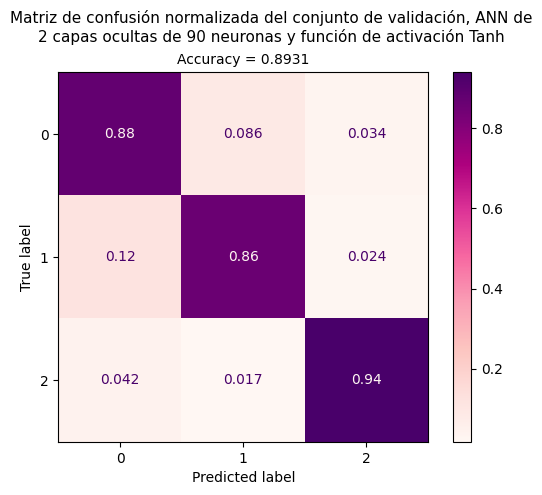


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 88
Mejor modelo en la época 88 con loss de validación = 0.324217


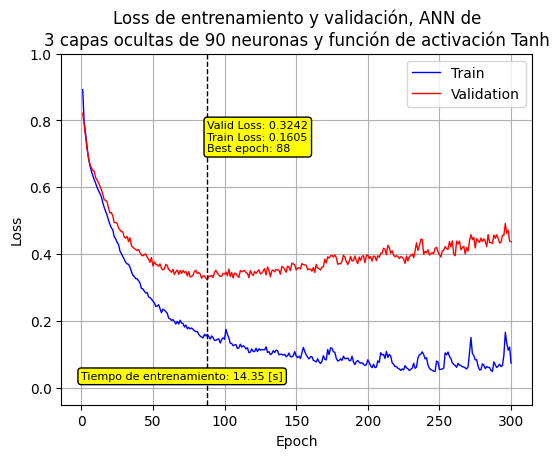

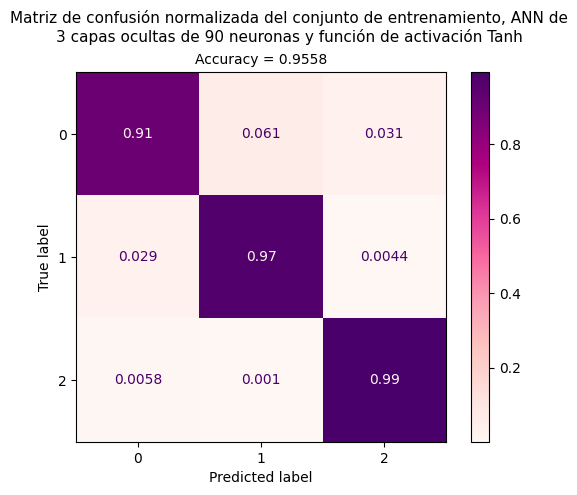

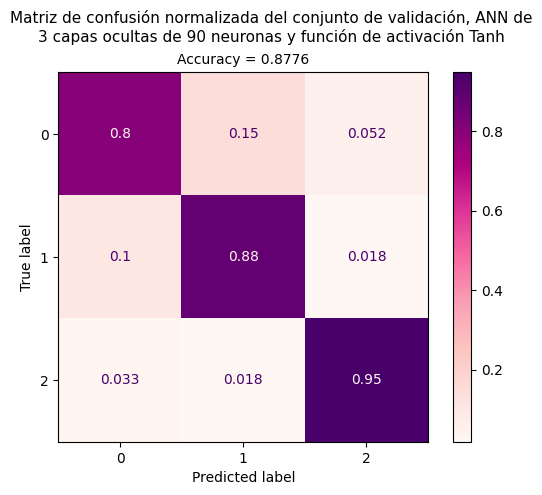


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 41
Mejor modelo en la época 41 con loss de validación = 0.368177


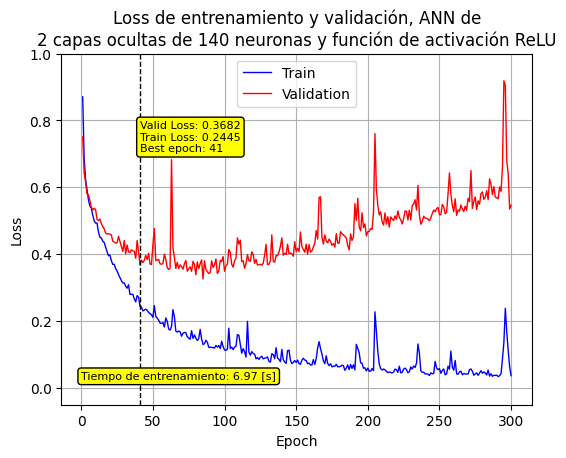

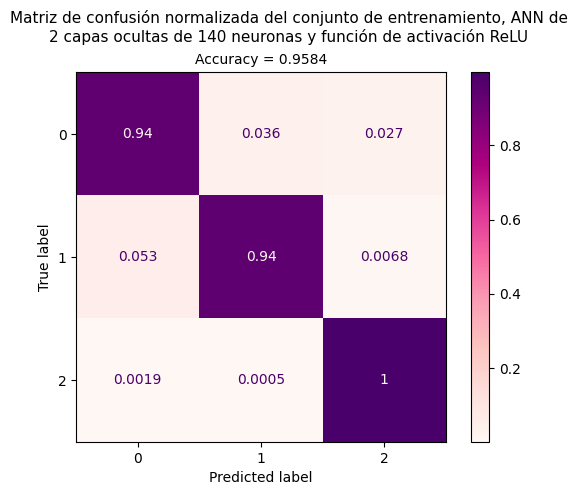

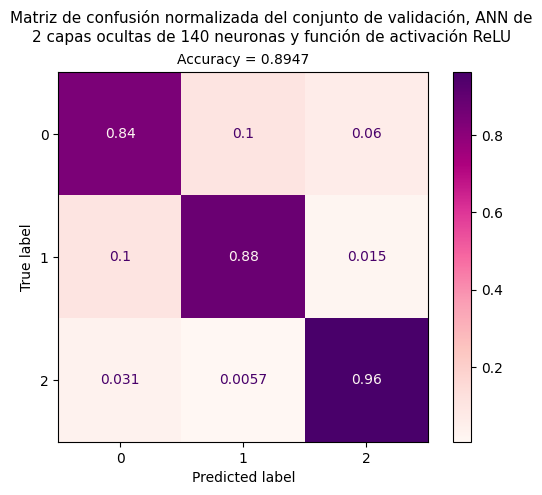


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 65
Mejor modelo en la época 65 con loss de validación = 0.325919


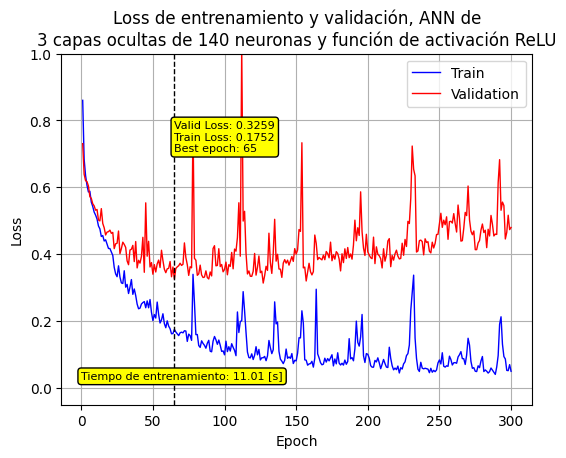

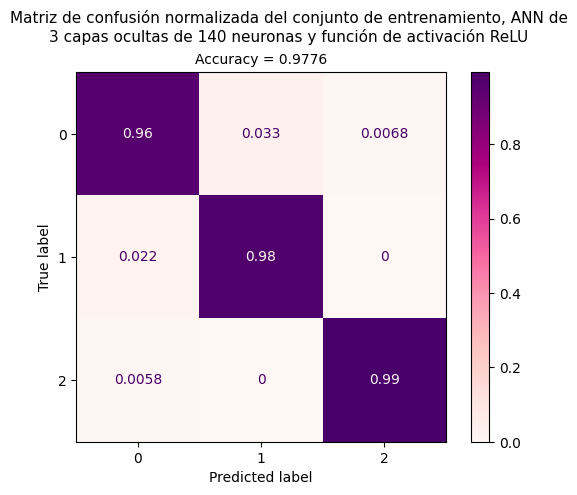

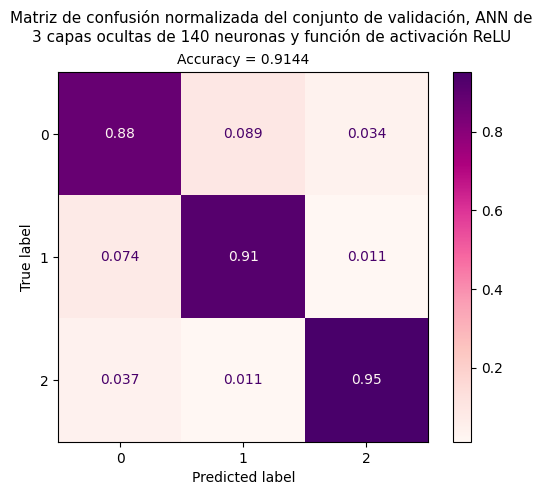


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 62
Mejor modelo en la época 62 con loss de validación = 0.271589


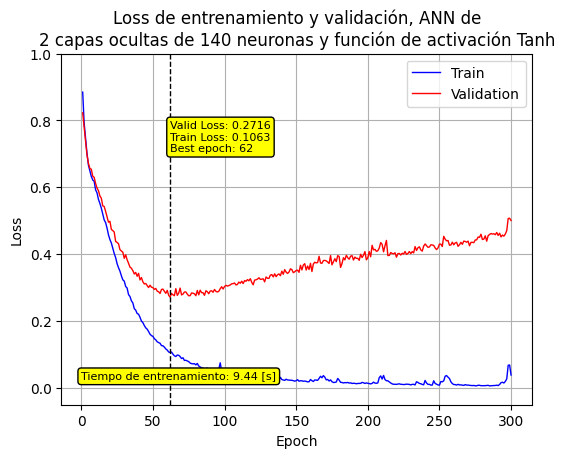

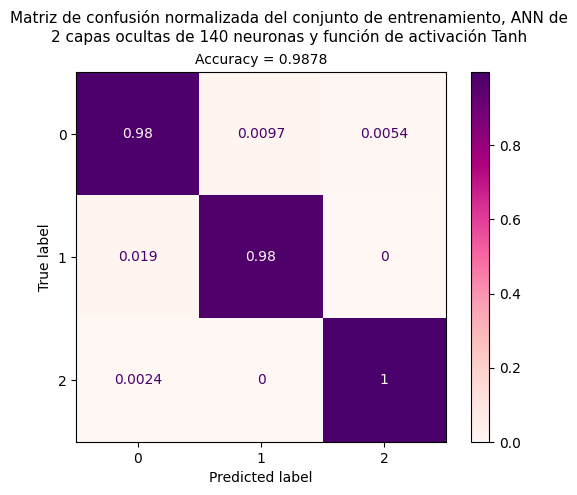

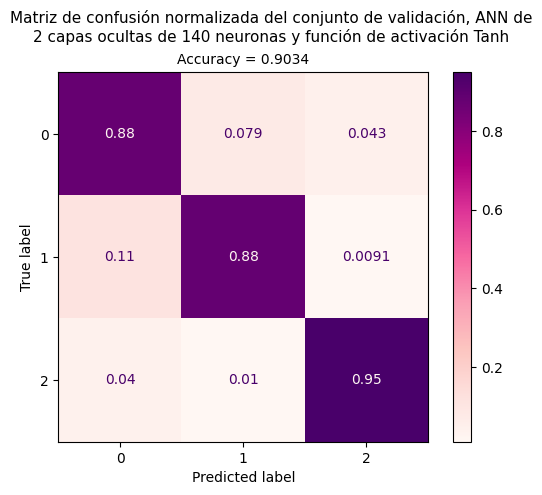


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 61
Mejor modelo en la época 61 con loss de validación = 0.277852


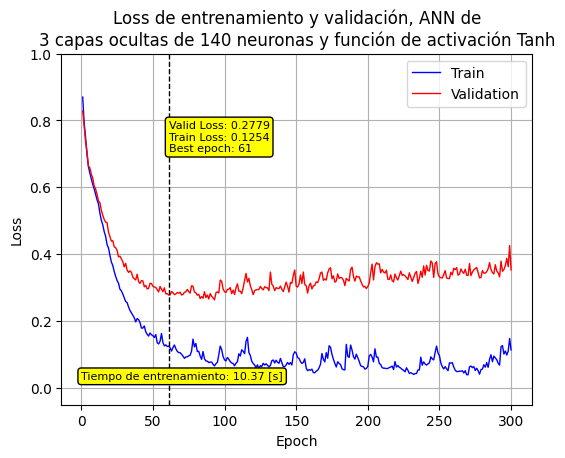

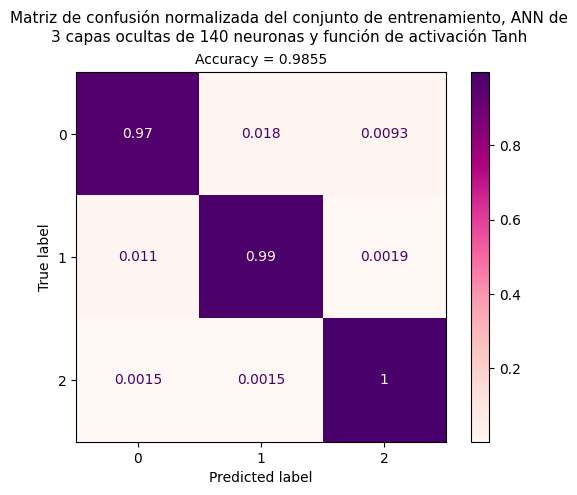

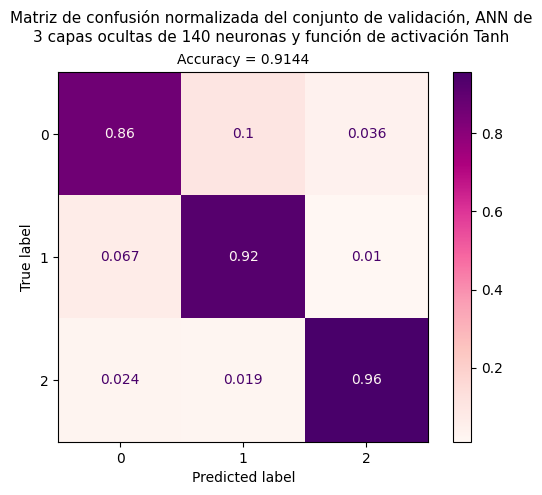


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 34
Mejor modelo en la época 34 con loss de validación = 0.377048


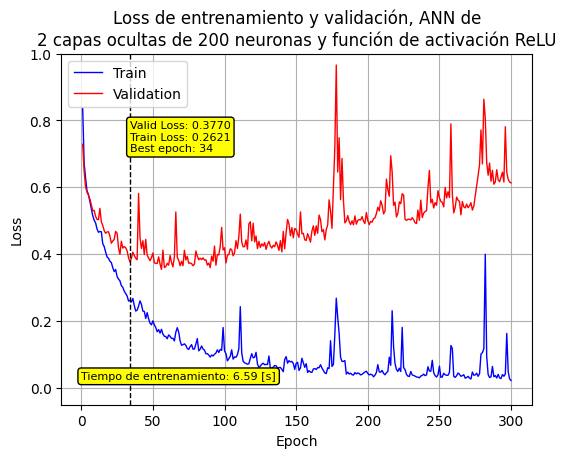

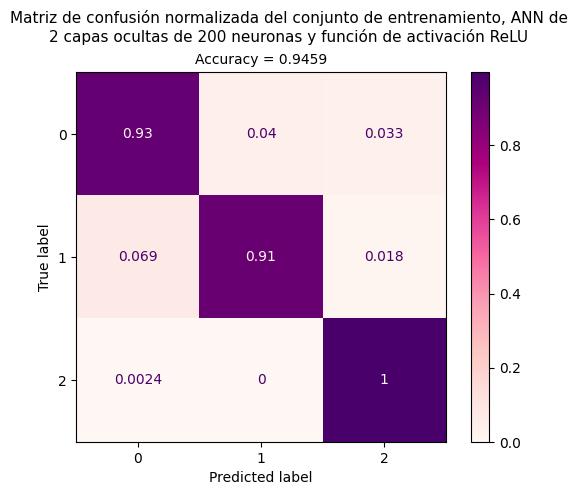

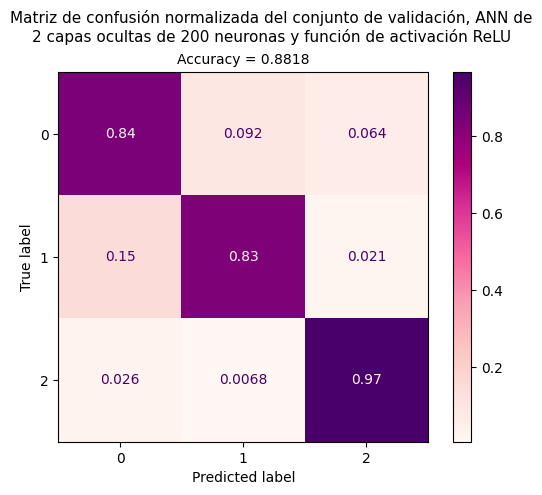


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.314652


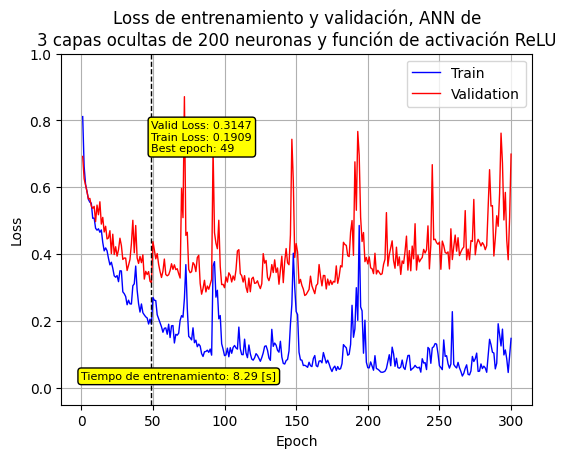

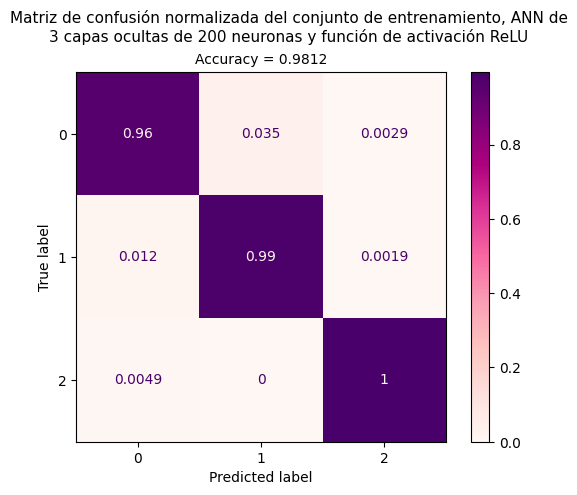

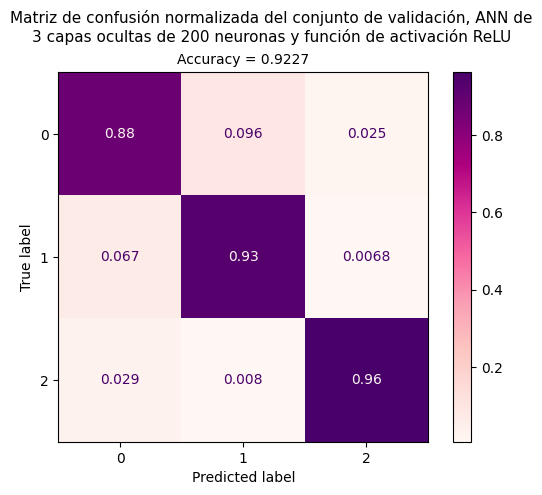


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 56
Mejor modelo en la época 56 con loss de validación = 0.272352


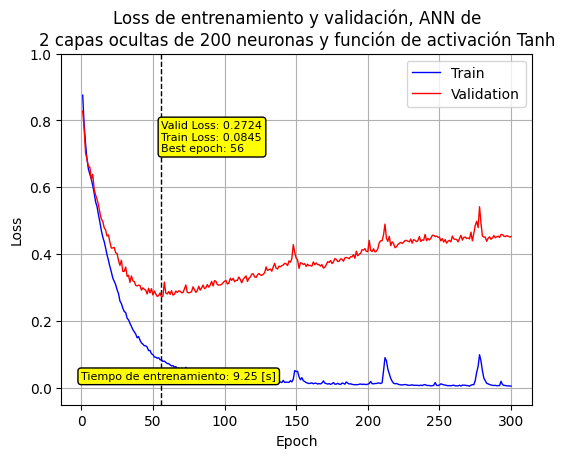

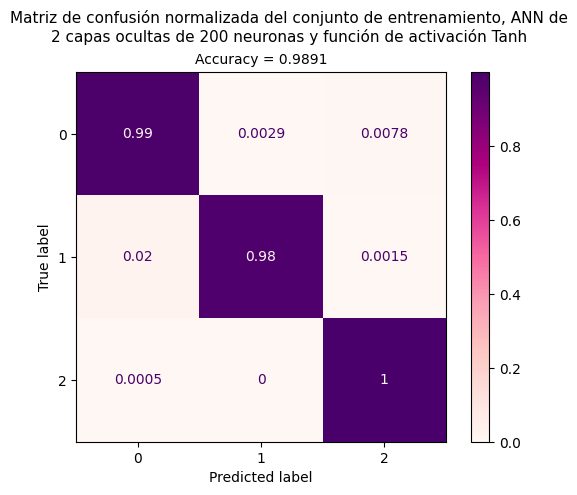

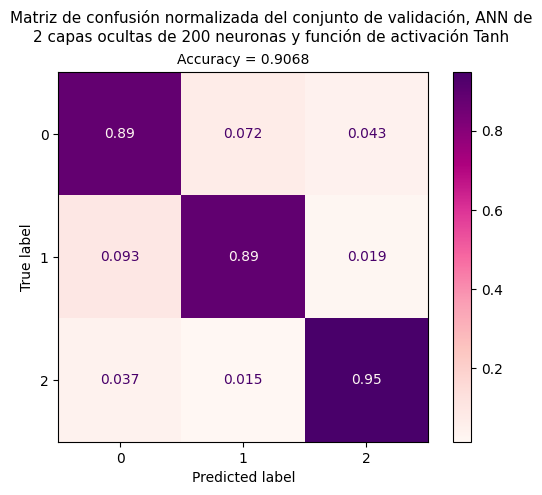


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 55
Mejor modelo en la época 55 con loss de validación = 0.248375


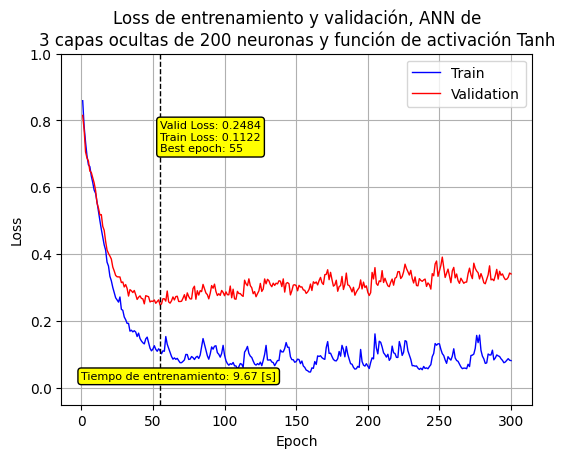

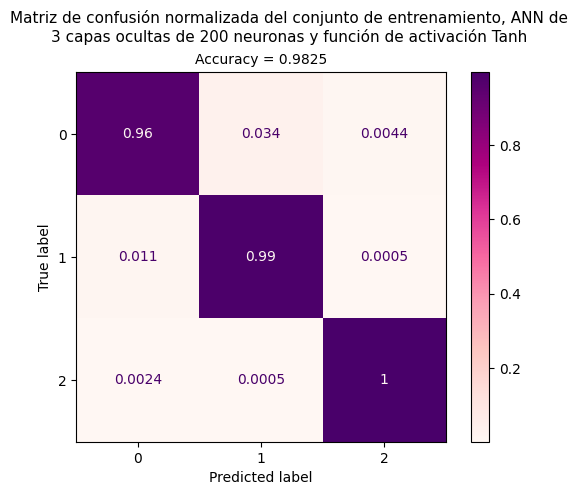

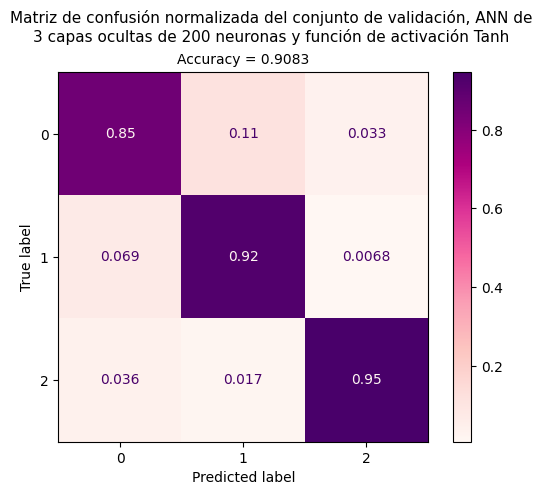


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 73
Mejor modelo en la época 73 con loss de validación = 0.329349


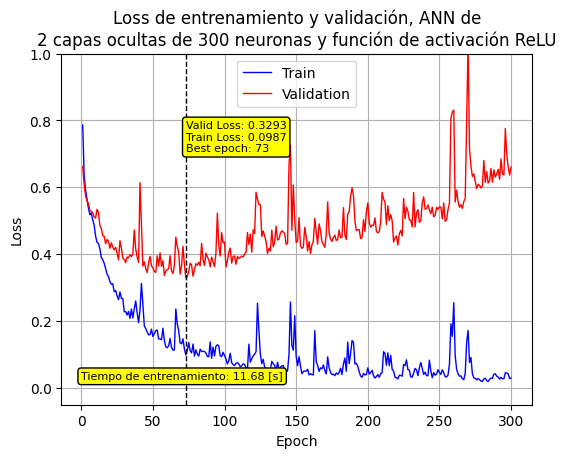

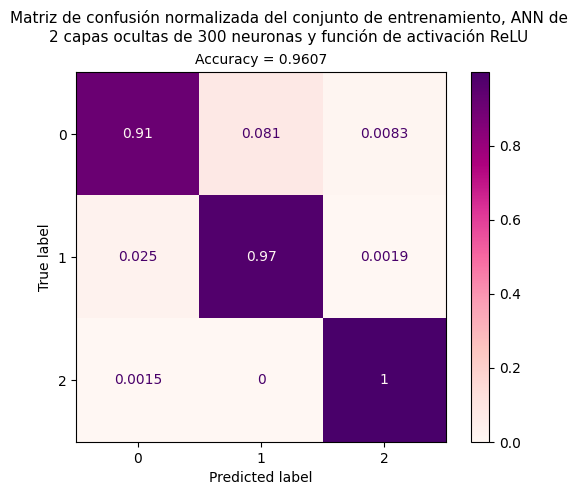

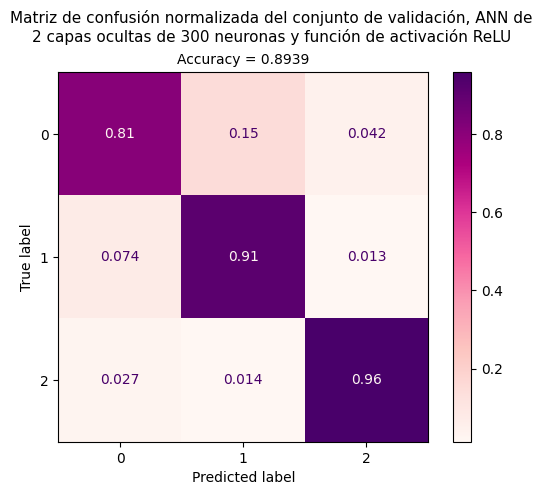


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 64
Mejor modelo en la época 64 con loss de validación = 0.280764


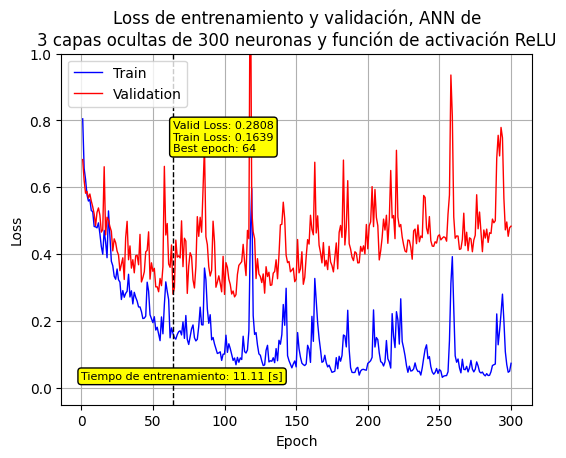

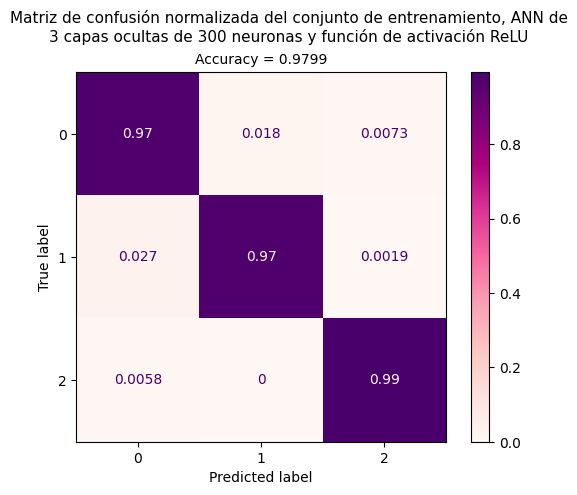

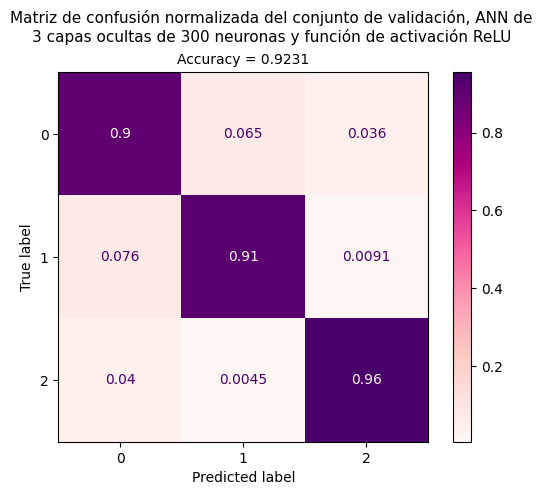


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 56
Mejor modelo en la época 56 con loss de validación = 0.257607


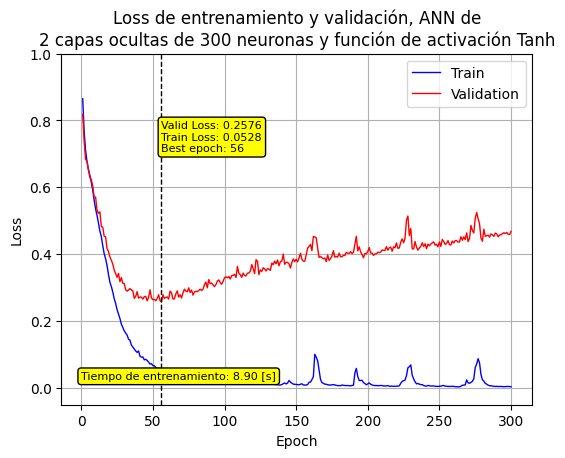

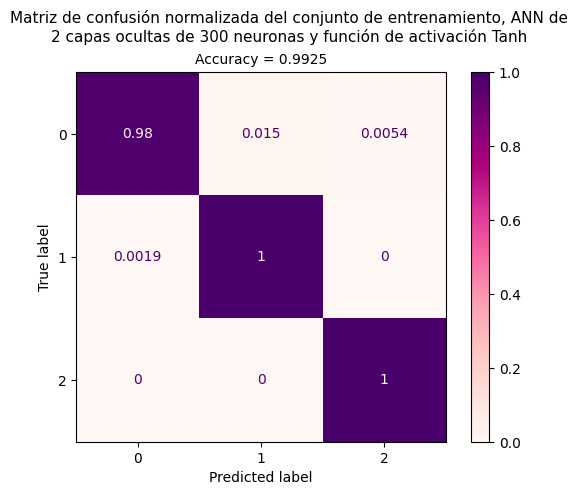

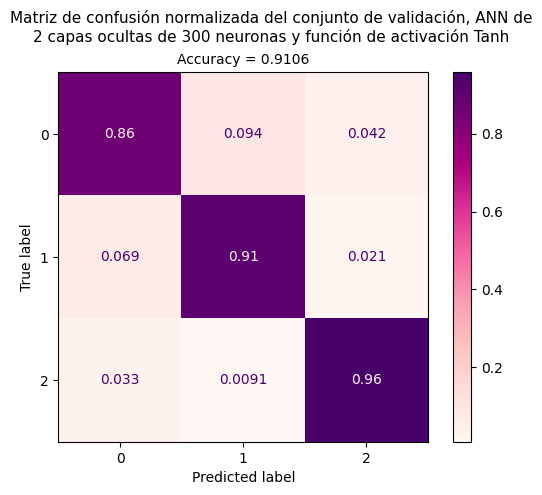


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 59
Mejor modelo en la época 59 con loss de validación = 0.202723


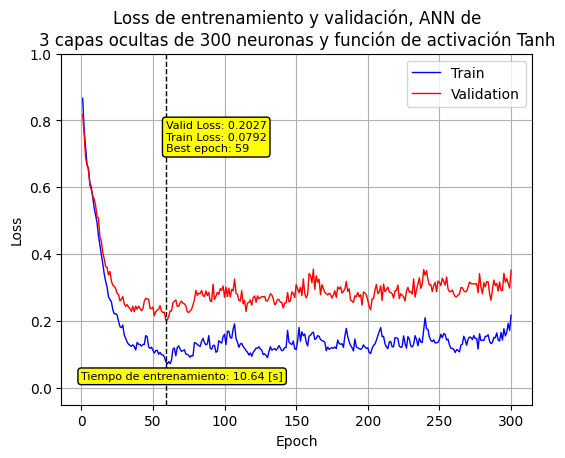

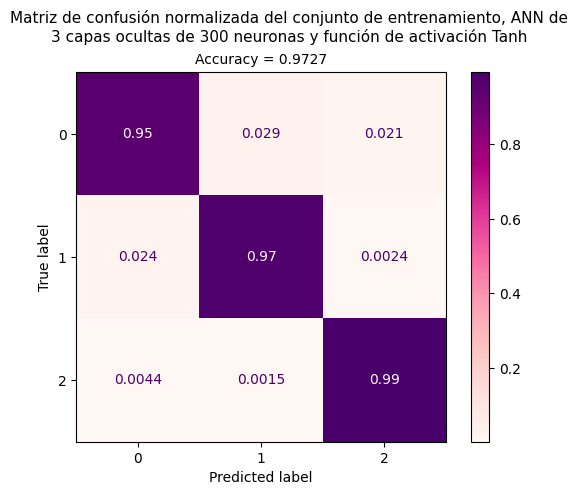

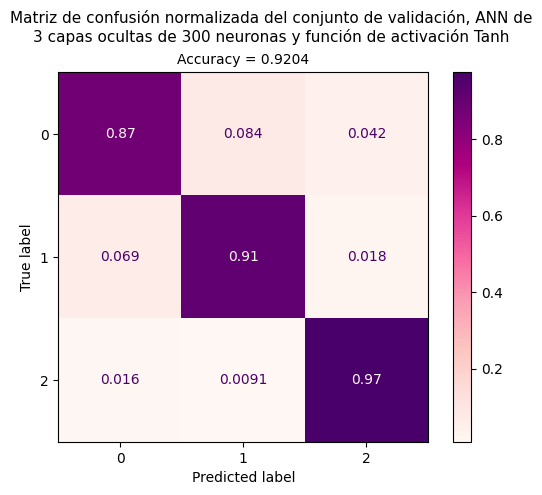


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 44
Mejor modelo en la época 44 con loss de validación = 0.324212


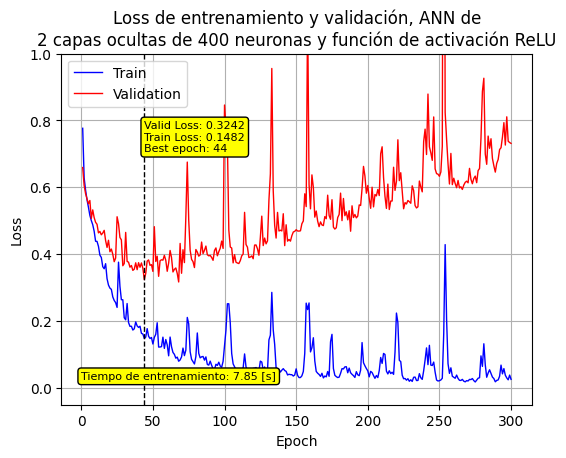

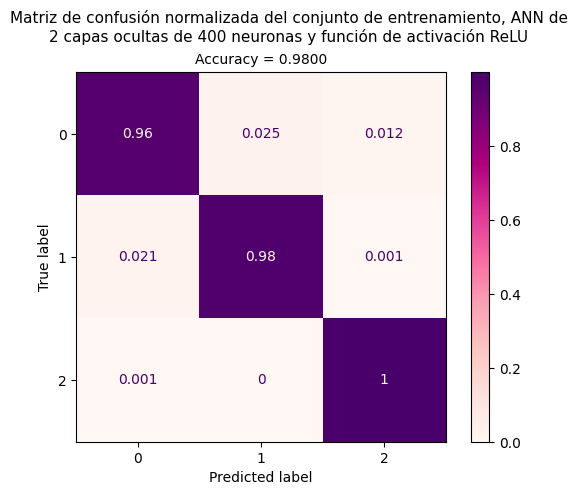

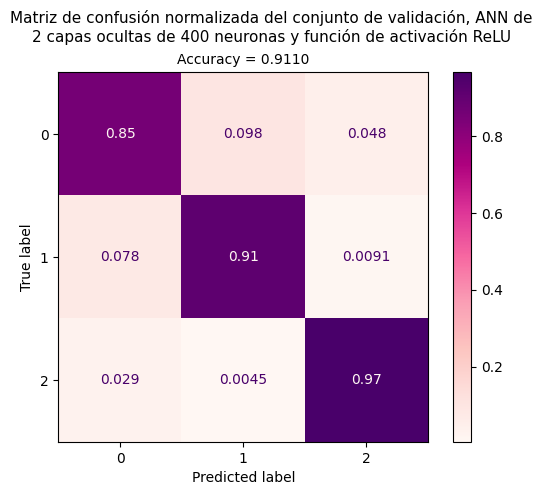


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 39
Mejor modelo en la época 39 con loss de validación = 0.312368


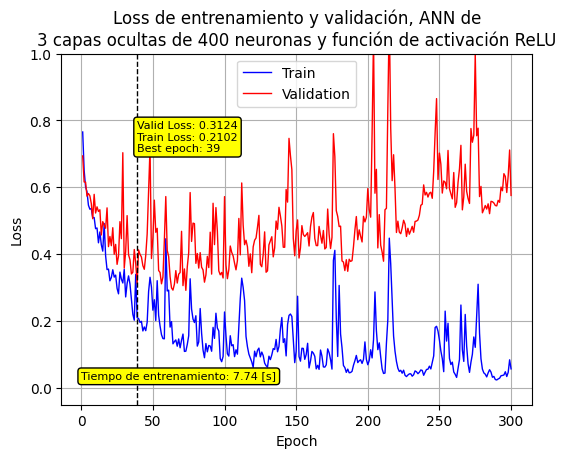

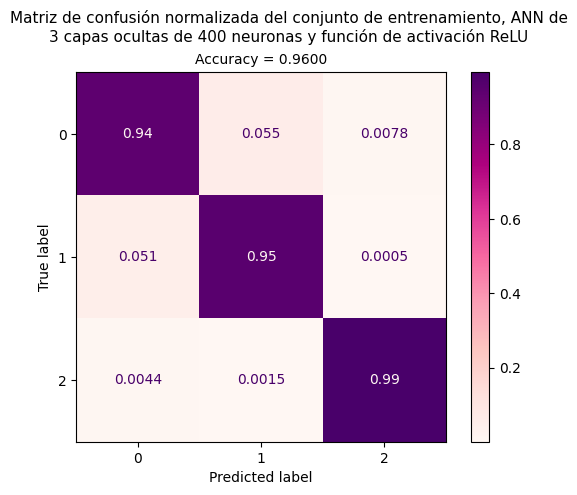

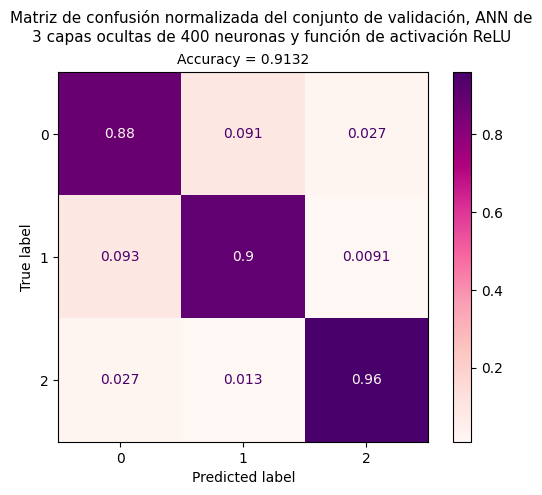


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 38
Mejor modelo en la época 38 con loss de validación = 0.238131


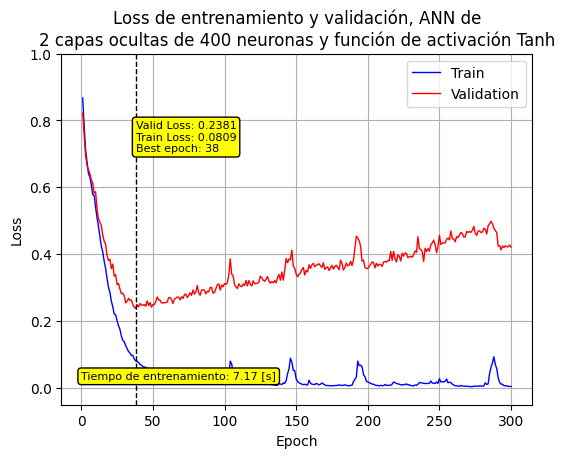

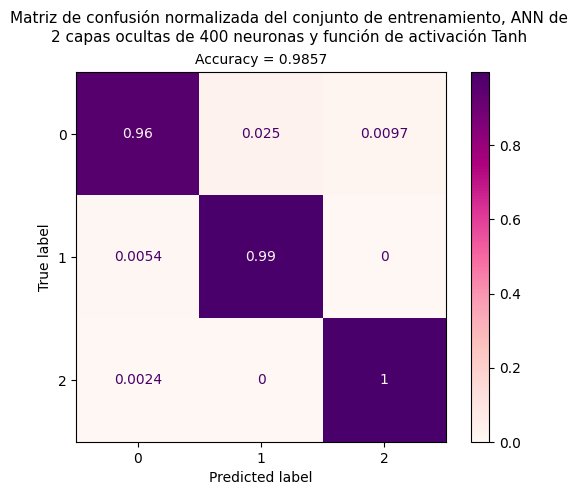

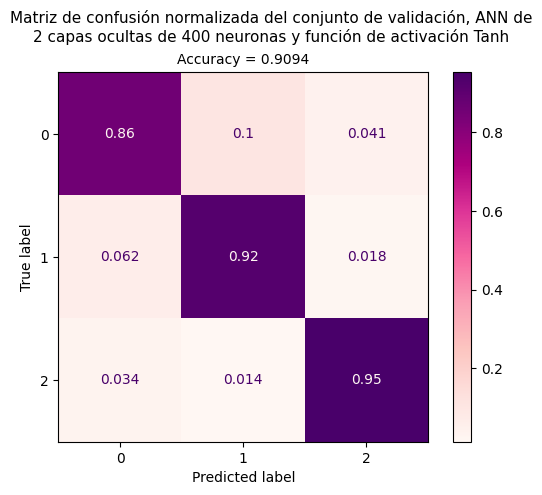


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 29
Mejor modelo en la época 29 con loss de validación = 0.198998


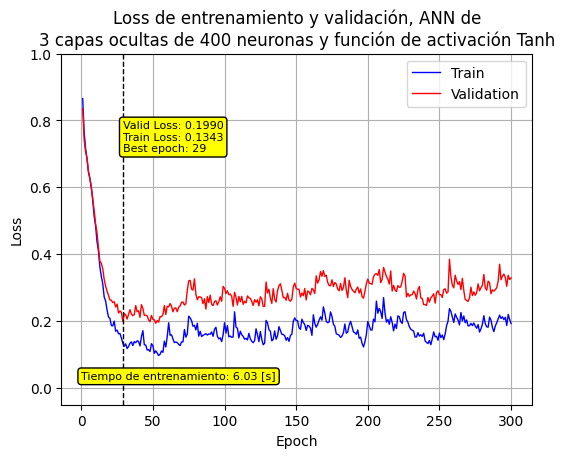

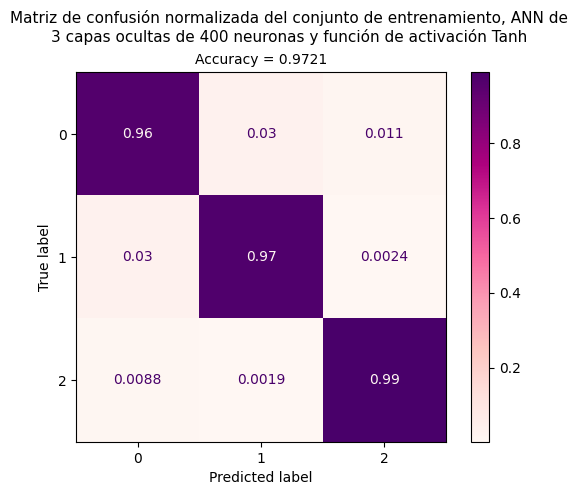

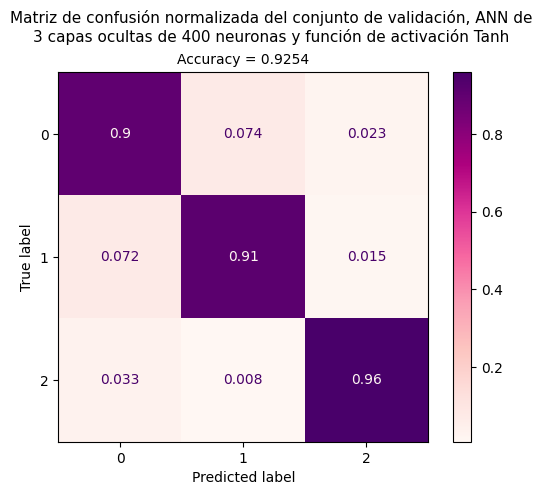

Tiempo de ejecución: 16.61 [min]


,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.198998,0.134330,29,6.029726,0.925351
2,model_300co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,300,0.001,0.280764,0.163866,64,11.113501,0.923077
3,model_200co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,200,0.001,0.314652,0.190945,49,8.291472,0.922698
4,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.202723,0.079151,59,10.638208,0.920424
5,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.325919,0.175226,65,11.011836,0.914362
6,model_140co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,140,0.001,0.277852,0.125406,61,10.374378,0.914362
7,model_400co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,400,0.001,0.312368,0.210191,39,7.742497,0.913225
8,model_400co2_ReLU,<class 'torch.nn.modules.activation.ReLU'>,2,400,0.001,0.324212,0.148187,44,7.848010,0.910951
9,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.257607,0.052772,56,8.901250,0.910572
10,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.238131,0.080932,38,7.174218,0.909435


In [39]:
# Hiperparámetros
hidden_sizes = [40, 90, 140, 200, 300, 400]
# hidden_sizes = [200, 300, 400]
# hidden_sizes = [300]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 300

patience = 15

ruta = '/content/ANN/graficos/GS/' # Ruta para guardar los gráficos, variable global en este punto
os.makedirs(ruta, exist_ok=True)

t0 = time.time()/60
search_results = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_GS, dataloader_val_GS)
tf = time.time()/60
print(f'Tiempo de ejecución: {tf - t0:.2f} [min]')

display(search_results)

# Entrenamiento de la mejor red con el conjunto completo de características

Early stopping at --------------------------------------------------> 43
Mejor modelo en la época 43 con loss de validación = 0.314773


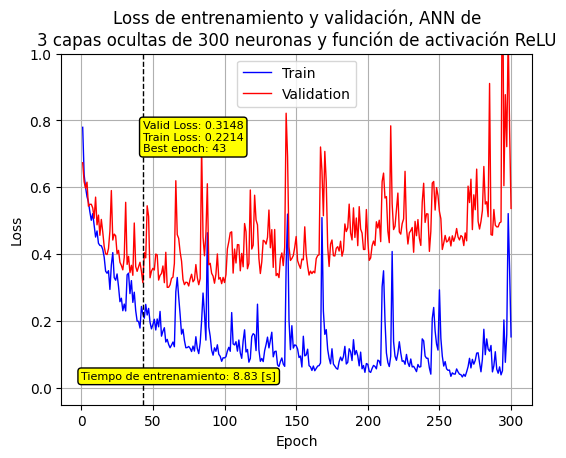

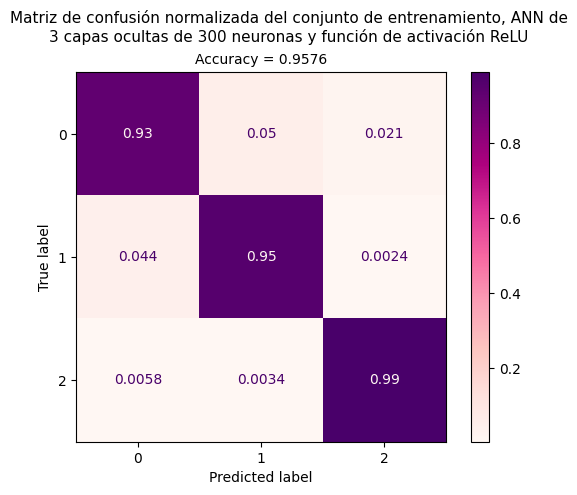

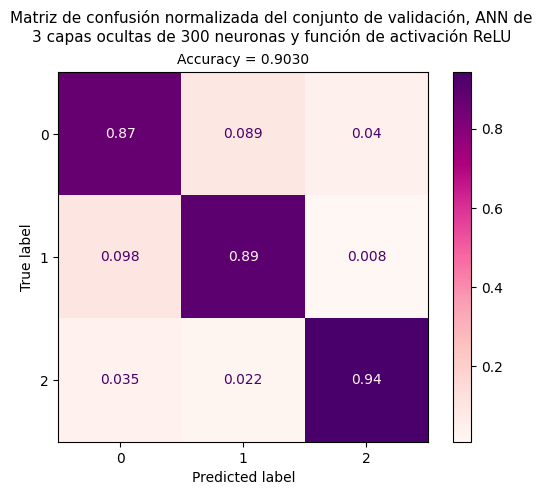

In [28]:
ruta = '/content/ANN/graficos/train/' # Ruta para guardar los gráficos, variable global en este punto

# La mejor red encontrad mediante el Grid Search
model_validated, optimizer = ANN_by_name(search_results)

model_validated = model_validated.to(device)

patience=15; n_epochs=300

# model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated, patience=patience, n_epochs=n_epochs, optimizer=optimizer, dataloader_tr=dataloader_train, dataloader_vl=dataloader_val)
model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated, patience, n_epochs, optimizer, dataloader_train, dataloader_val)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

# Clasificación con un conjunto reducido de características

## Selección mediante wrapper strategy

In [29]:
# Asegúrate de que el SVC sea lineal
svc = svm.SVC(kernel='linear', C=10)
svc.fit(df_train, y_train)

# selector = SelectFromModel(estimator=svc, prefit=True, max_features=54, importance_getter='coef_') #Investigar que es prefit
selector = SelectFromModel(estimator=svc, max_features=54, threshold=-np.inf)

best_indx_wrapper = np.where(selector.get_support())[0]
best_feat_wrapper = [df_train.keys()[i] for i in np.where(selector.get_support())[0]] #Toma los indices de aquellas características que fueron seleccionadas como importantes con el método y luego busca el nombre de la característica correspodiente en la lista original de nombres definida al inicio del código

print('Mejores características:',best_feat_wrapper)
# Se define el nuevo conjunto de entrenamiento y validación tomando las características más importantes encontradas con este método
df_train_wrapper = df_train[best_feat_wrapper]
df_val_wrapper = df_val[best_feat_wrapper]
df_test_wrapper = df_test[best_feat_wrapper]

dataloader_train_wrapper, dataloader_val_wrapper, dataloader_test_wrapper = dataloader_creator(df_train_wrapper, y_train, df_val_wrapper, y_val, df_test_wrapper)


Mejores características: ['mean_R1', 'var_R1', 'max_R1', 'sma_R1', 'enrgy_R1', 'iqr_R1', 'entpy_R1', 'mean_R2', 'var_R2', 'mad_R2', 'ran_R2', 'sma_R2', 'enrgy_R2', 'iqr_R2', 'entpy_R2', 'mean_R3', 'var_R3', 'max_R3', 'min_R3', 'sma_R3', 'enrgy_R3', 'entpy_R3', 'mean_R4', 'var_R4', 'max_R4', 'min_R4', 'ran_R4', 'sma_R4', 'enrgy_R4', 'iqr_R4', 'enrgy_R5', 'mean_R6', 'var_R6', 'mad_R6', 'max_R6', 'min_R6', 'ran_R6', 'sma_R6', 'enrgy_R6', 'entpy_R6', 'mean_R7', 'var_R7', 'mad_R7', 'max_R7', 'min_R7', 'ran_R7', 'sma_R7', 'enrgy_R7', 'iqr_R7', 'var_R8', 'enrgy_R8', 'max_Humidity', 'min_Humidity', 'enrgy_Humidity']


In [30]:
dataloader_train_wrapper, dataloader_val_wrapper, dataloader_test_wrapper = dataloader_creator(df_train_wrapper, y_train, df_val_wrapper, y_val, df_test_wrapper)
dataloader_train_wrapper_GS, dataloader_val_wrapper_GS = dataloader_creator_GS(df_val_wrapper, y_val)


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 102
Mejor modelo en la época 102 con loss de validación = 0.453152


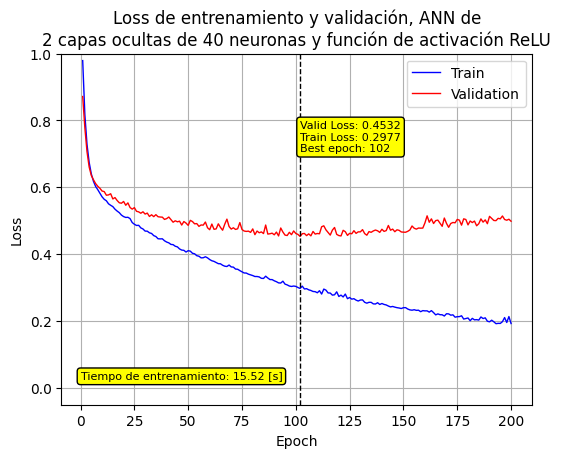

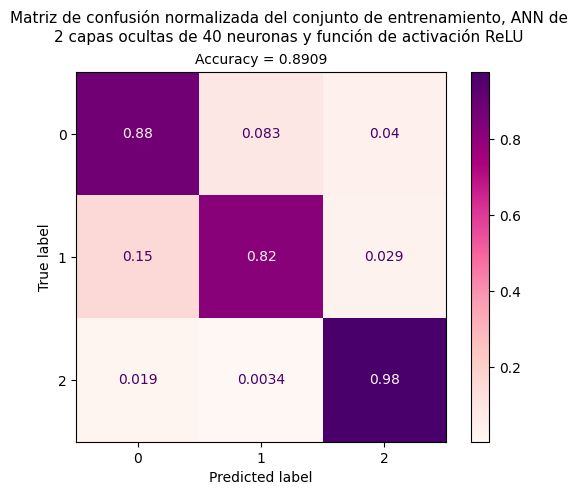

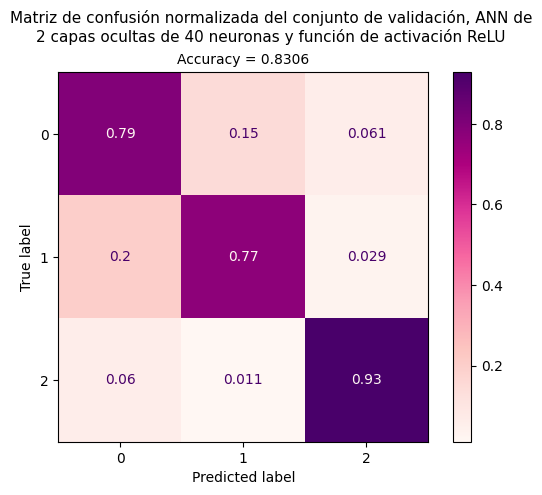


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 104
Mejor modelo en la época 104 con loss de validación = 0.417684


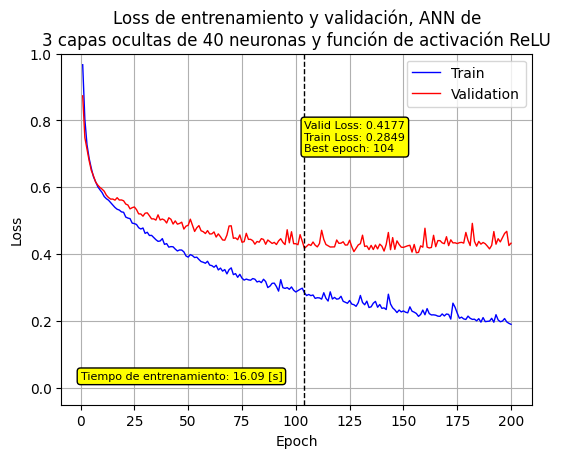

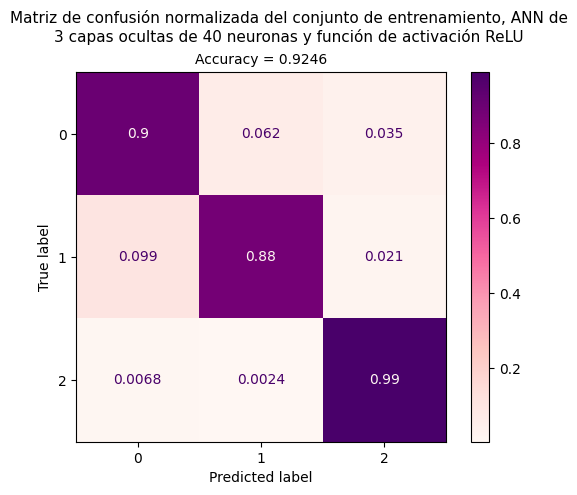

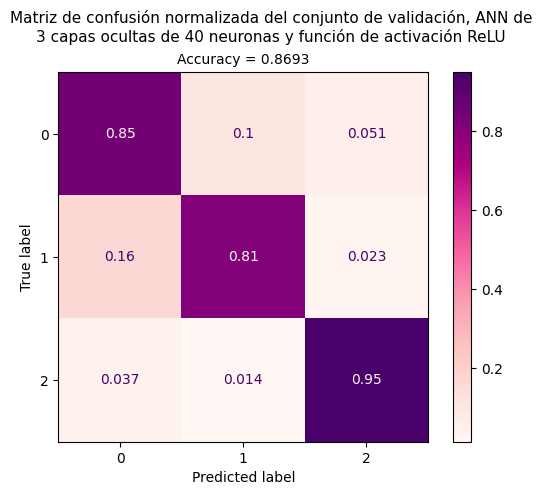


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 116
Mejor modelo en la época 116 con loss de validación = 0.403945


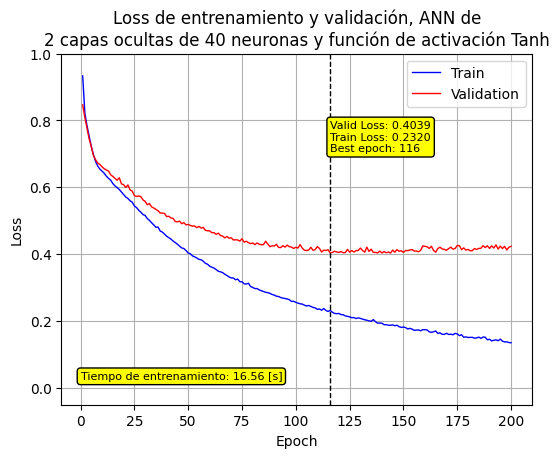

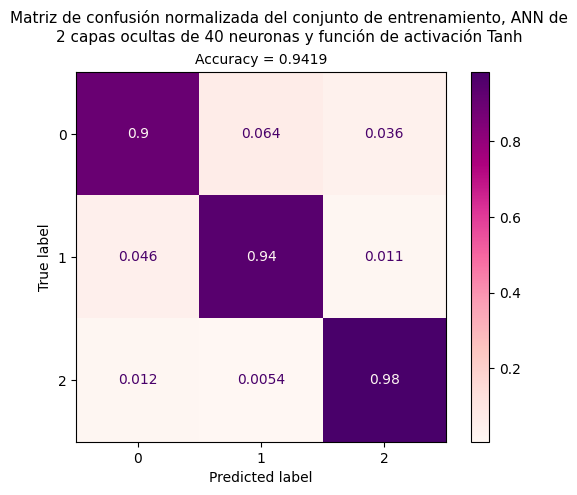

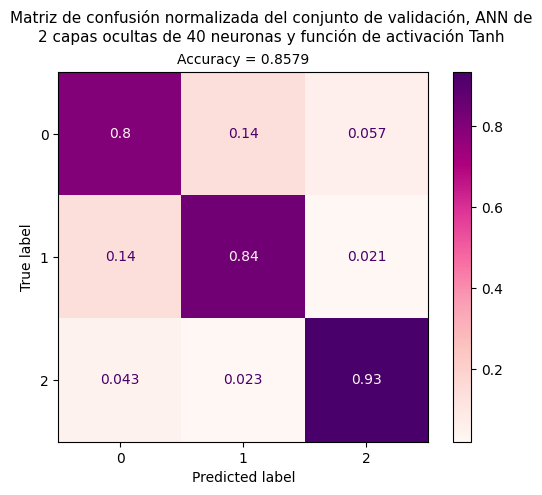


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 106
Mejor modelo en la época 106 con loss de validación = 0.417815


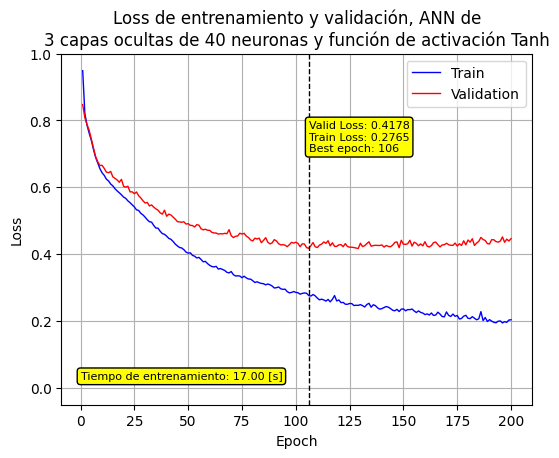

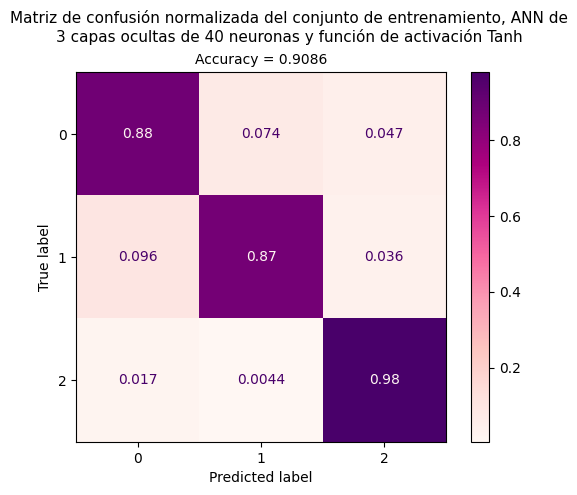

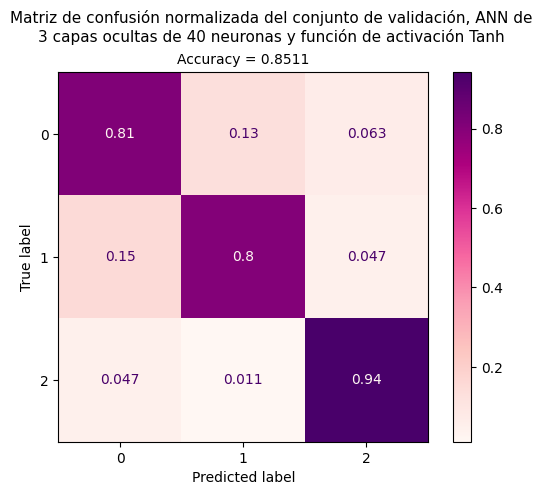


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 74
Mejor modelo en la época 74 con loss de validación = 0.375385


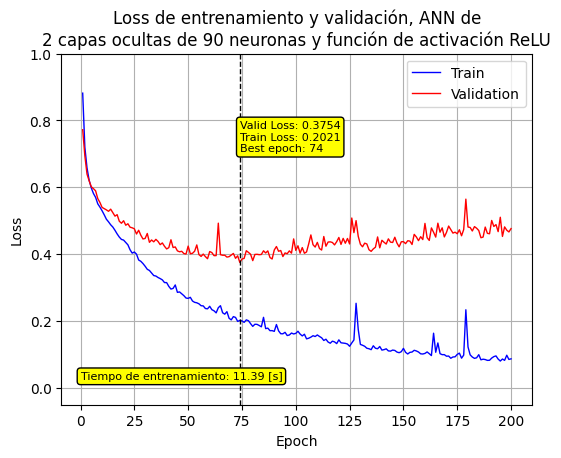

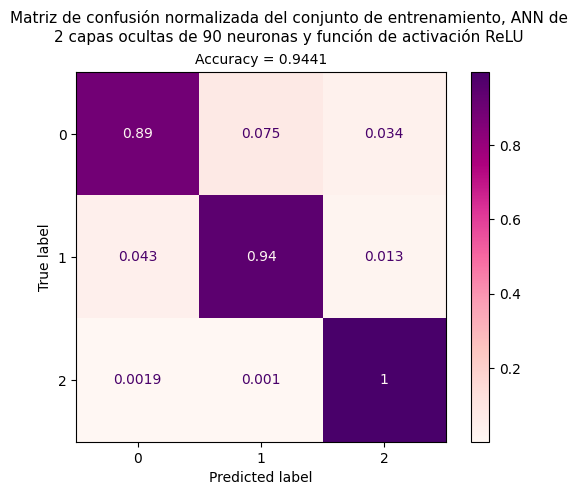

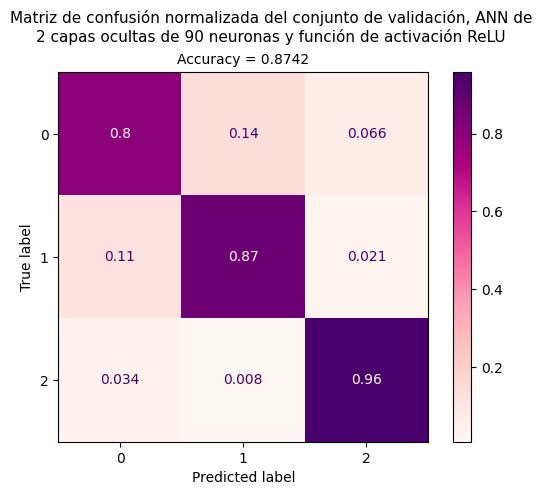


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 56
Mejor modelo en la época 56 con loss de validación = 0.385811


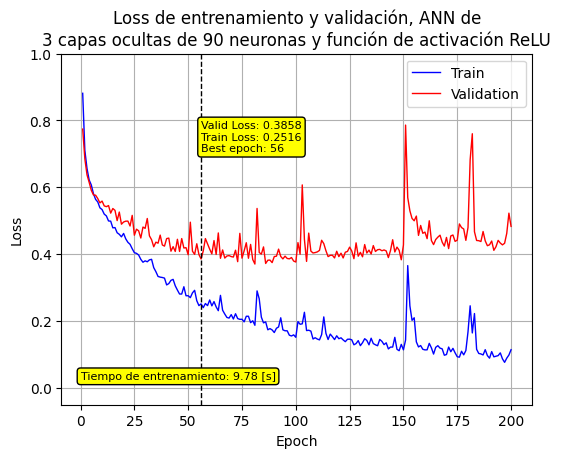

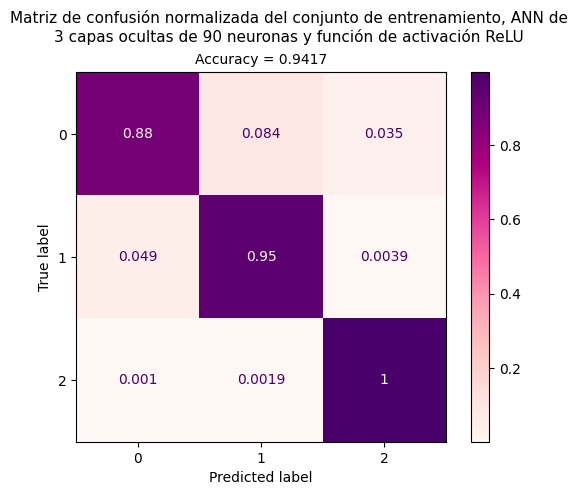

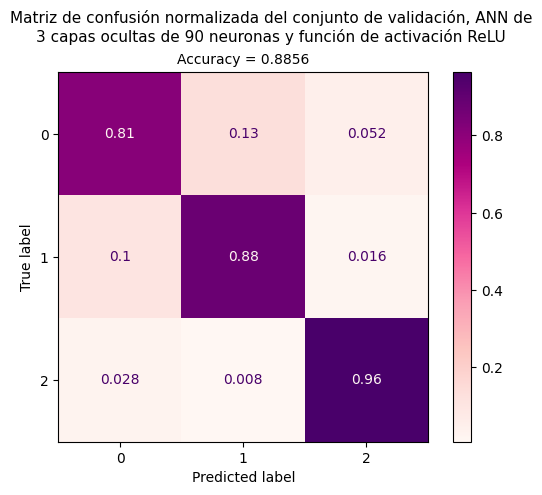


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 100
Mejor modelo en la época 100 con loss de validación = 0.262043


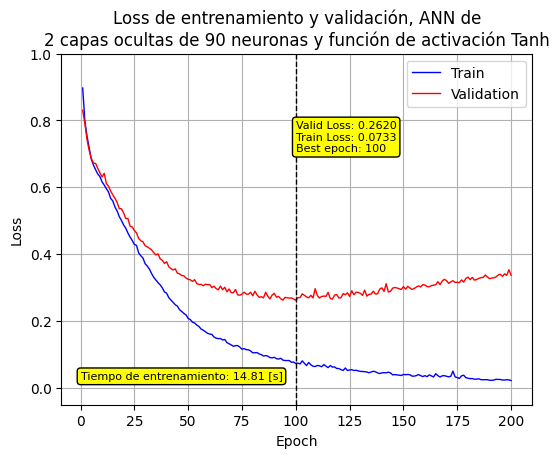

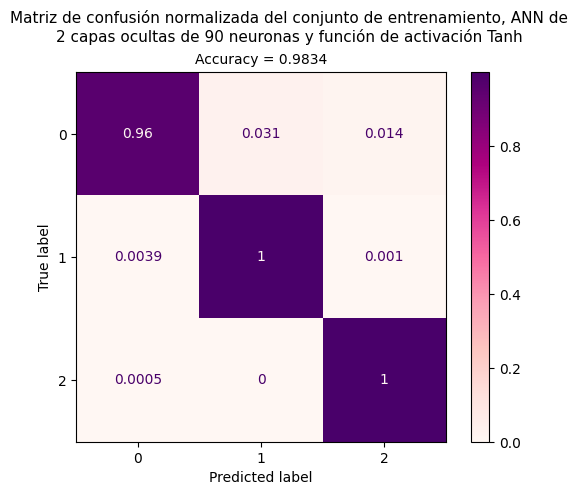

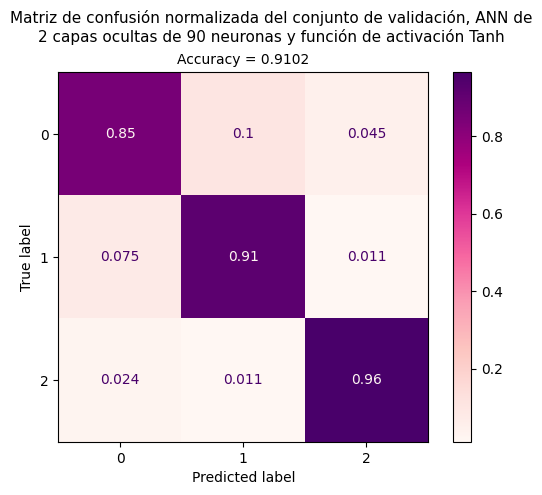


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 100
Mejor modelo en la época 100 con loss de validación = 0.288926


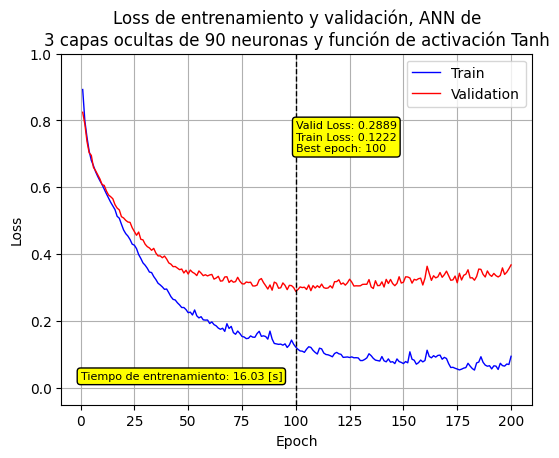

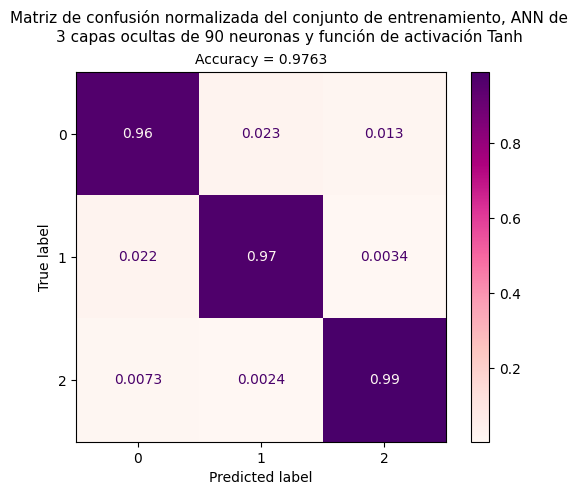

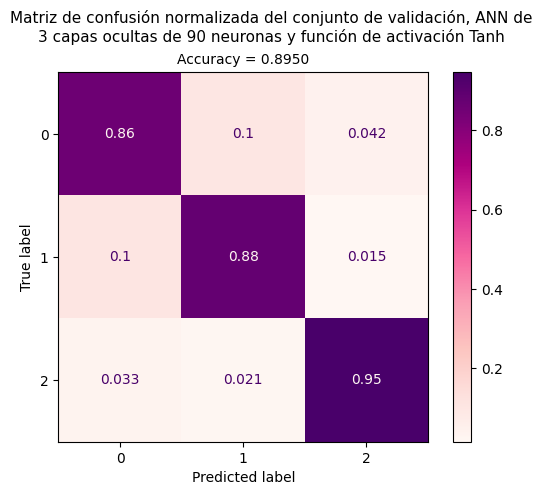


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 67
Mejor modelo en la época 67 con loss de validación = 0.356751


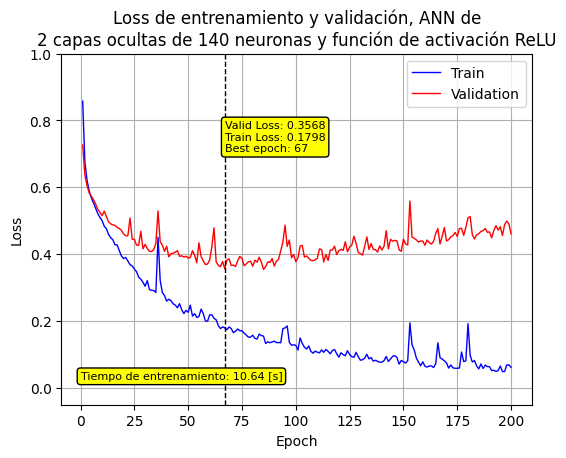

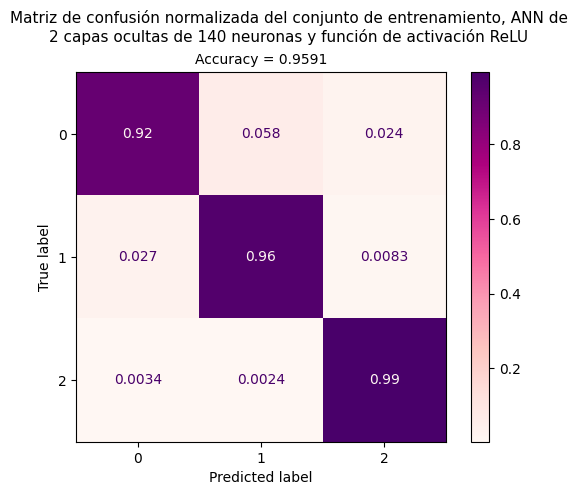

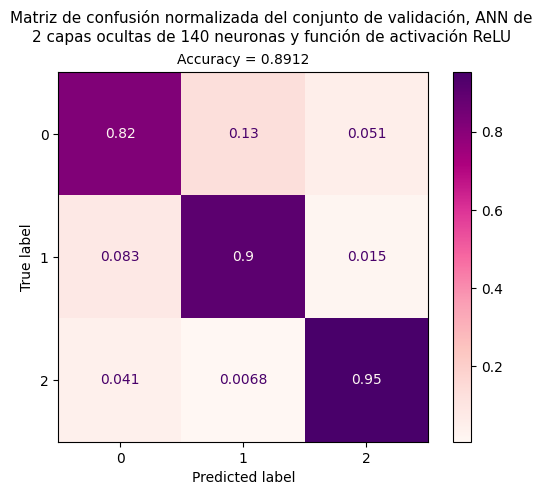


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 71
Mejor modelo en la época 71 con loss de validación = 0.297516


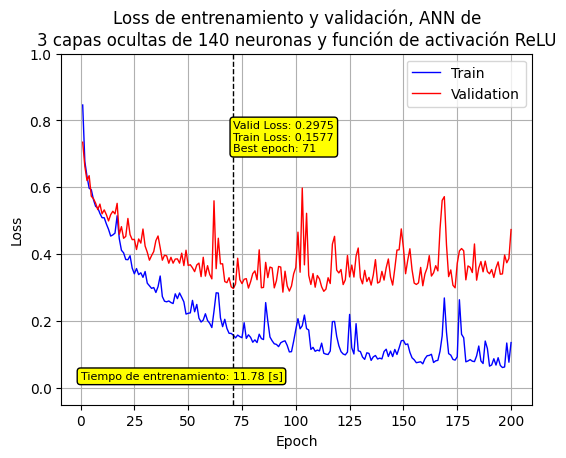

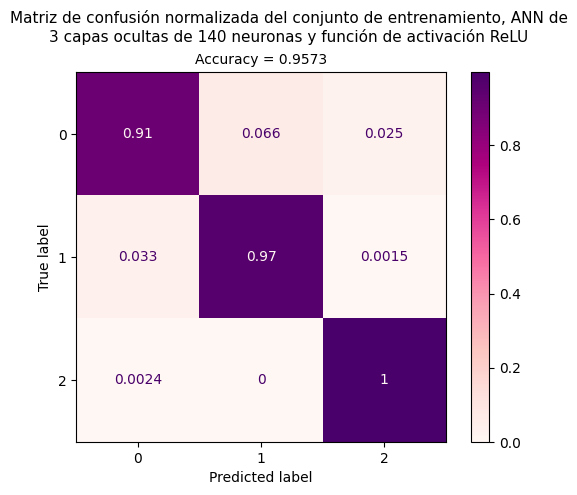

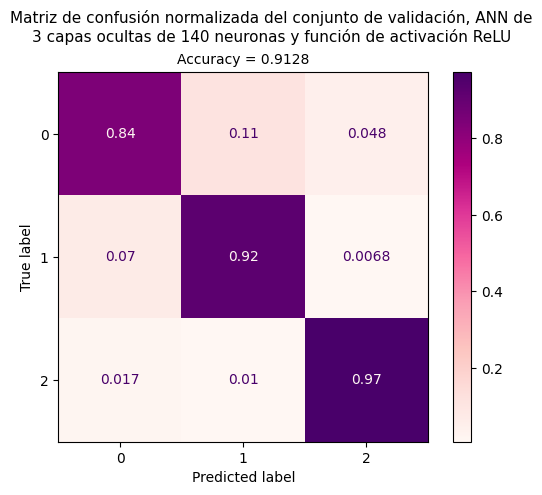


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 65
Mejor modelo en la época 65 con loss de validación = 0.278241


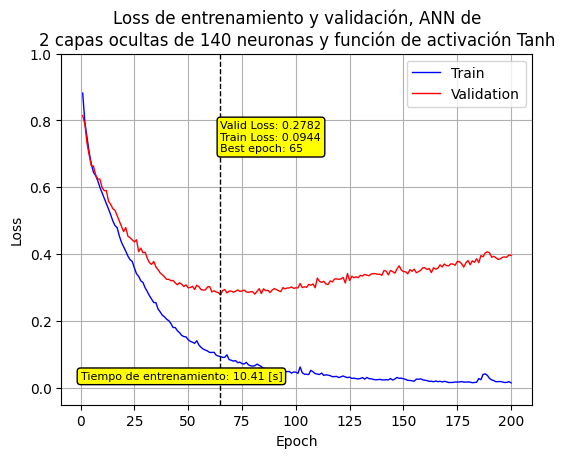

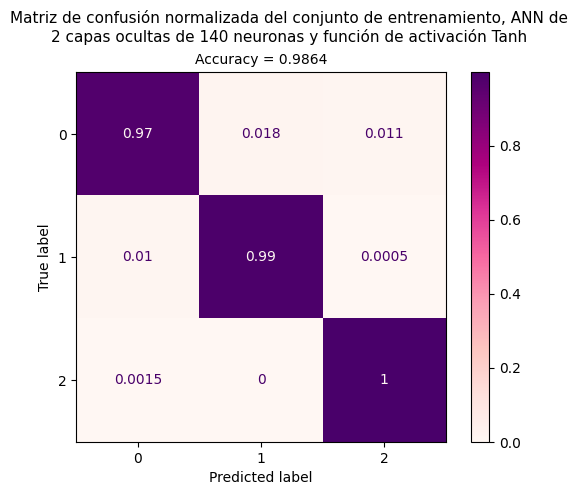

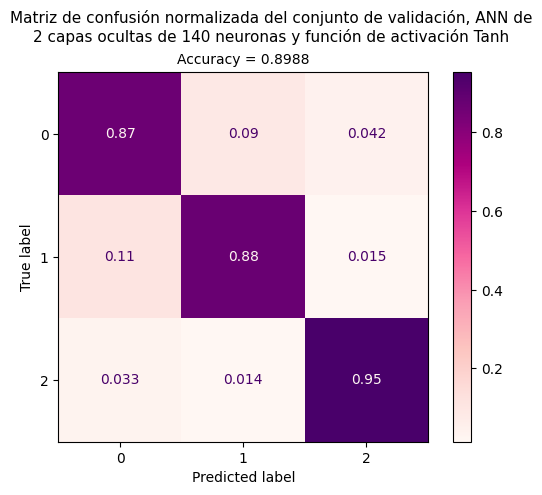


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 95
Mejor modelo en la época 95 con loss de validación = 0.275243


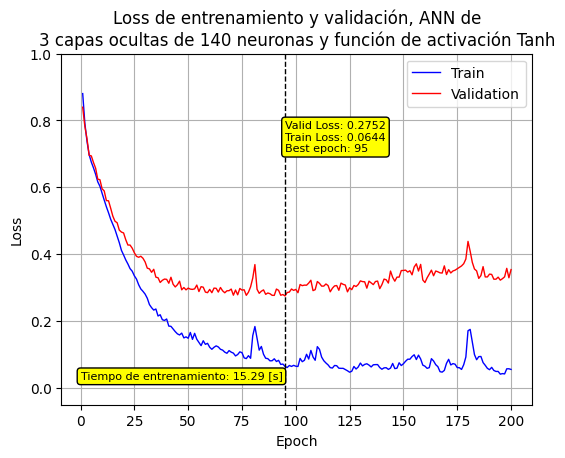

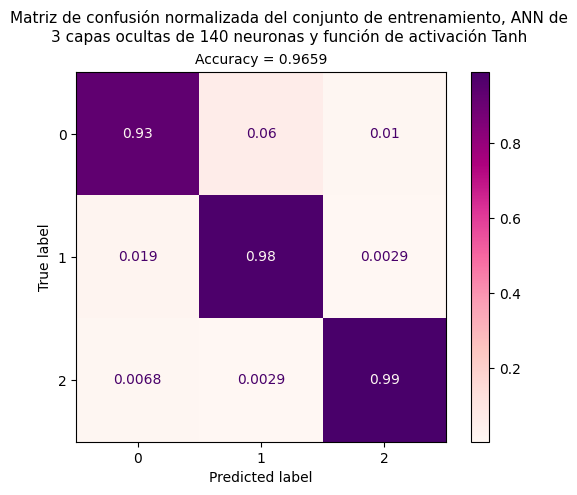

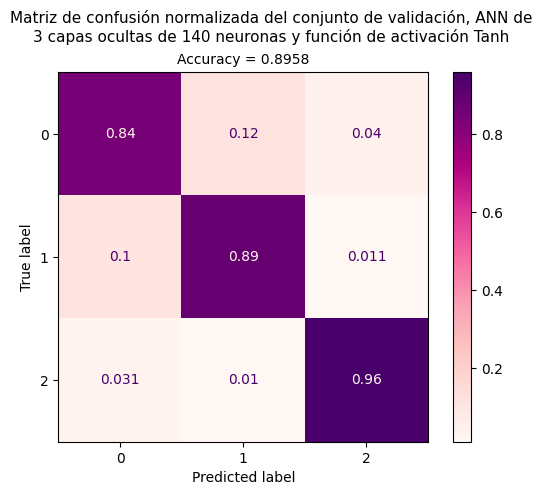


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 66
Mejor modelo en la época 66 con loss de validación = 0.345853


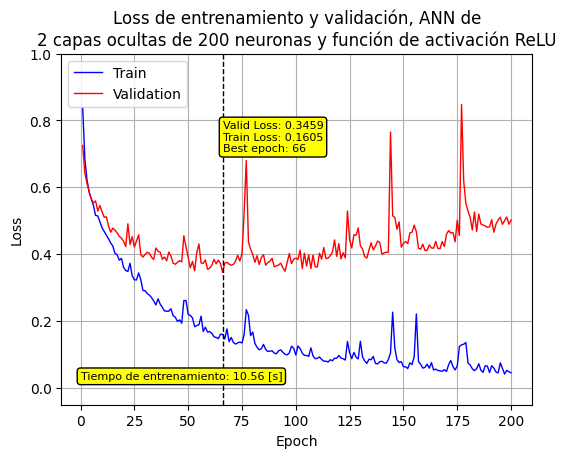

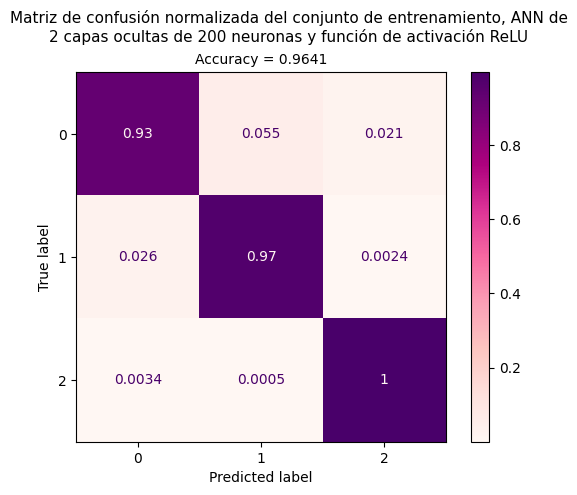

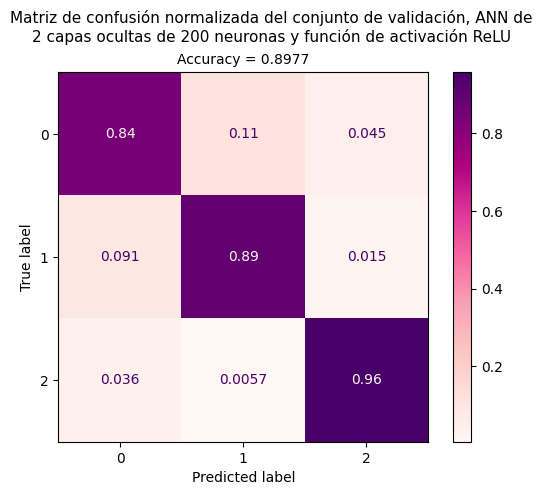


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 50
Mejor modelo en la época 50 con loss de validación = 0.300505


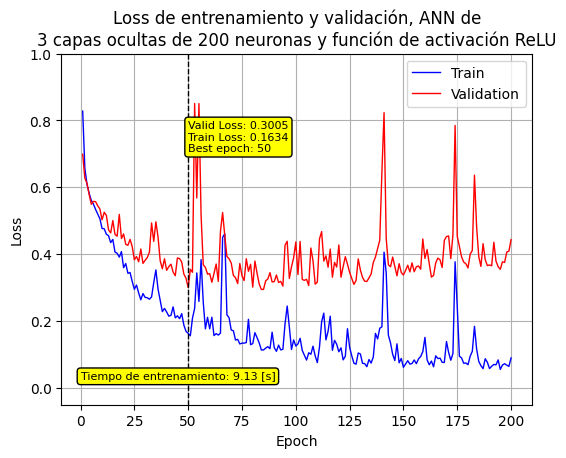

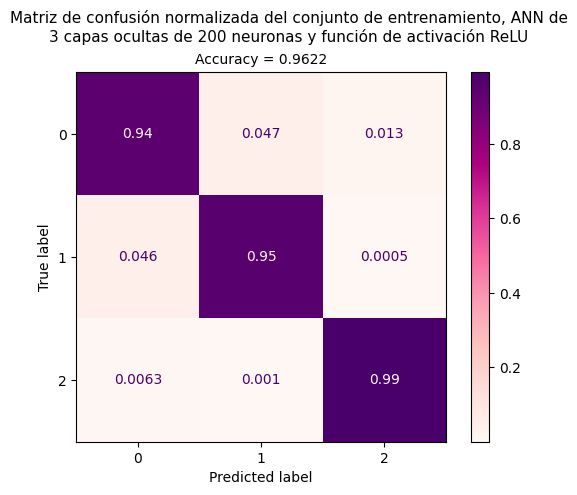

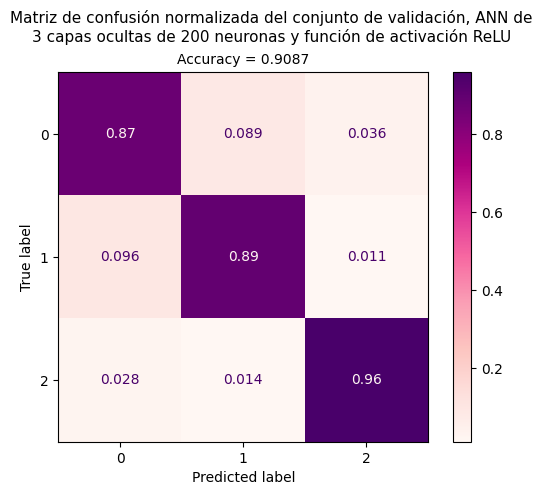


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 58
Mejor modelo en la época 58 con loss de validación = 0.250077


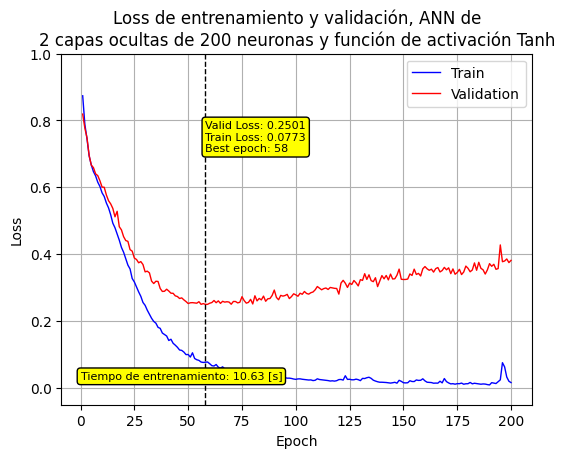

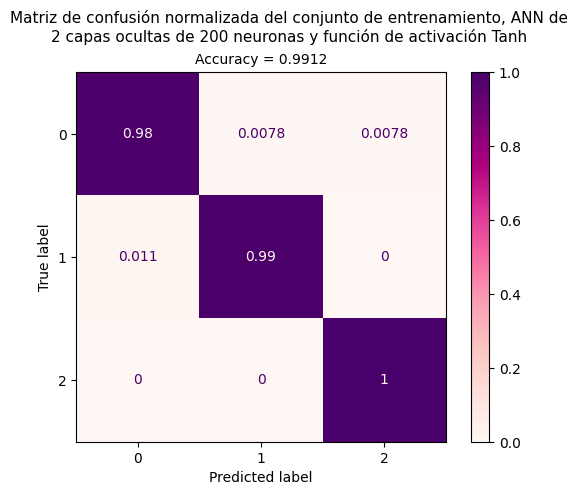

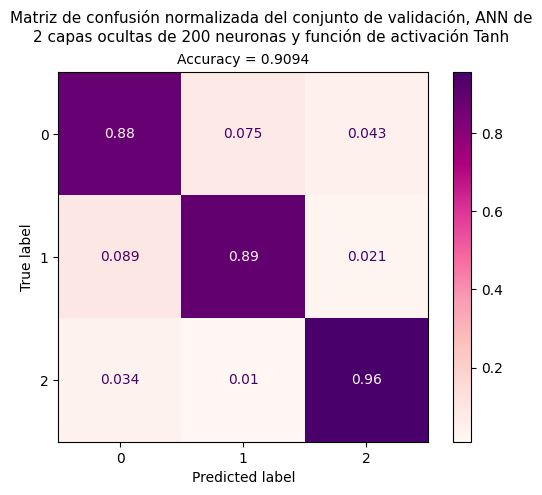


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 67
Mejor modelo en la época 67 con loss de validación = 0.238575


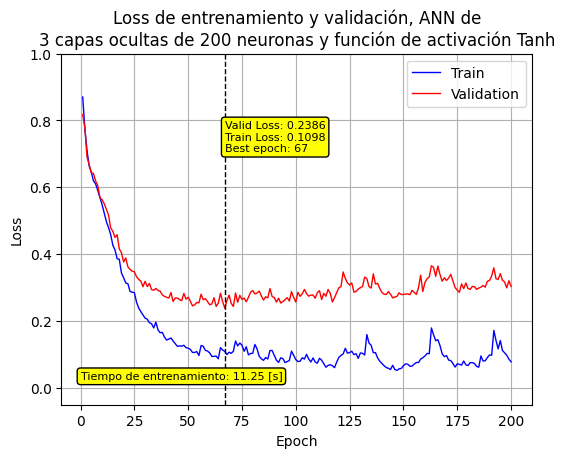

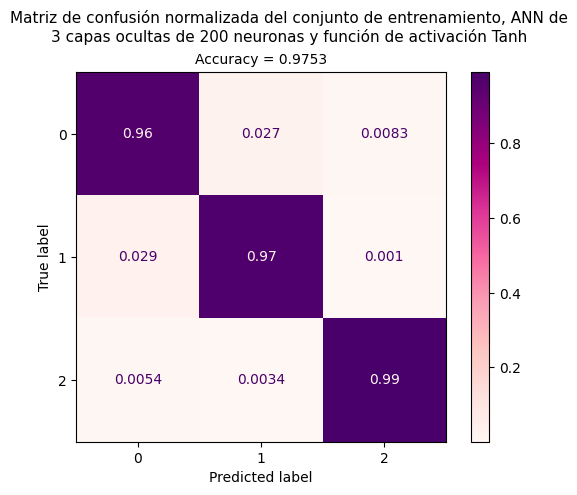

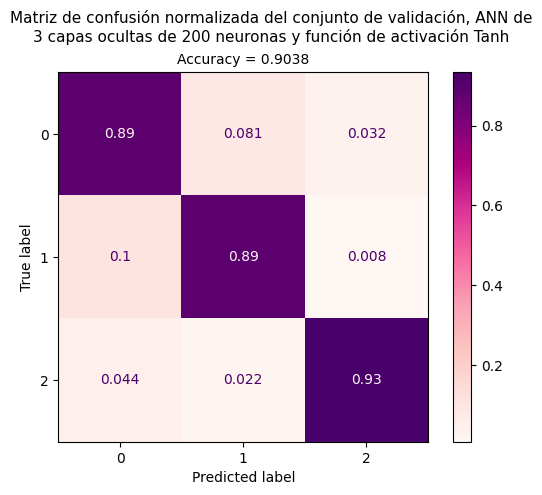


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 64
Mejor modelo en la época 64 con loss de validación = 0.320254


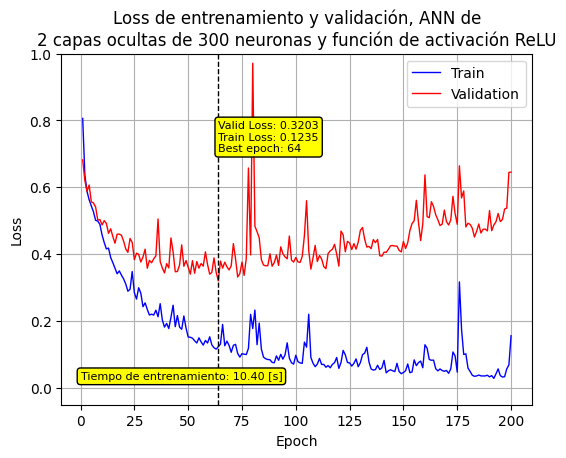

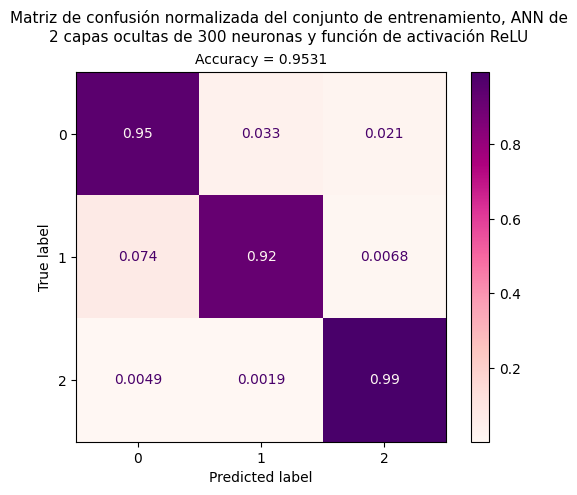

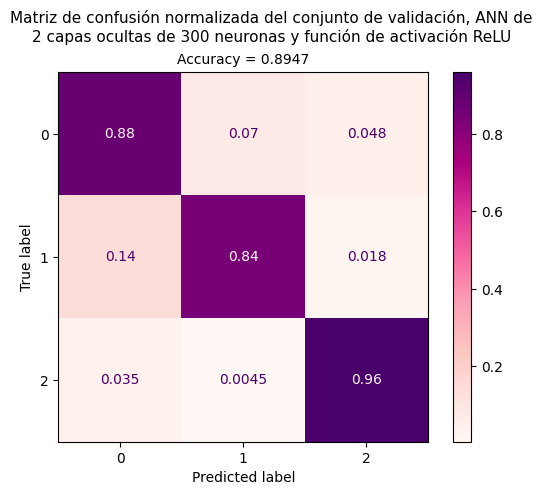


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 84
Mejor modelo en la época 84 con loss de validación = 0.284101


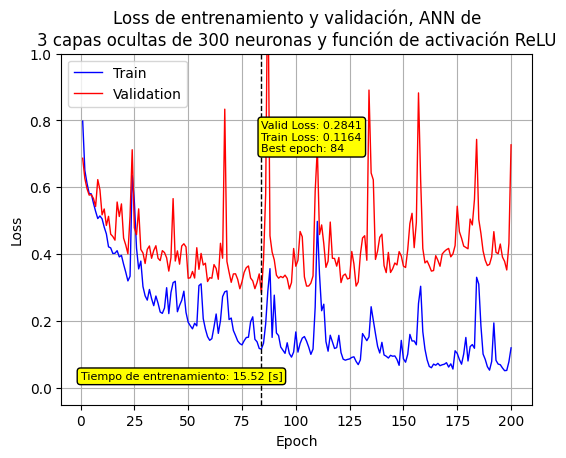

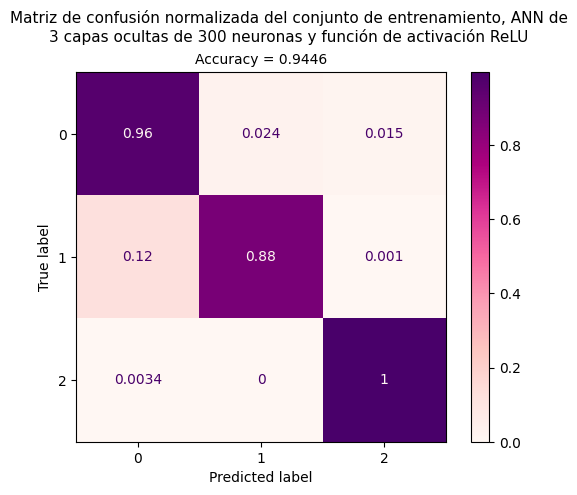

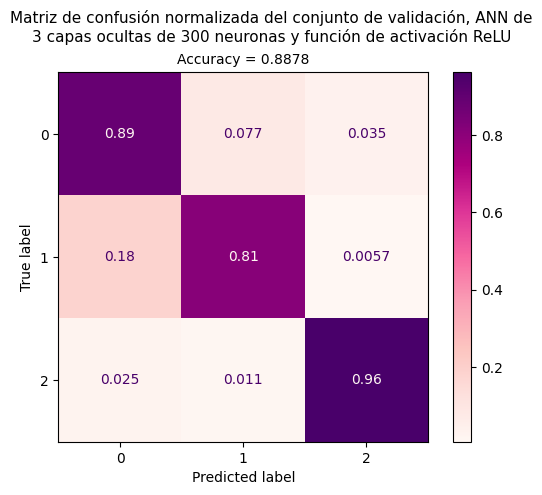


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 52
Mejor modelo en la época 52 con loss de validación = 0.233278


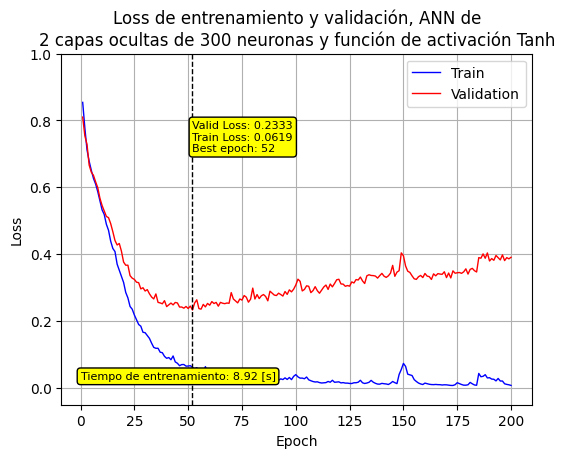

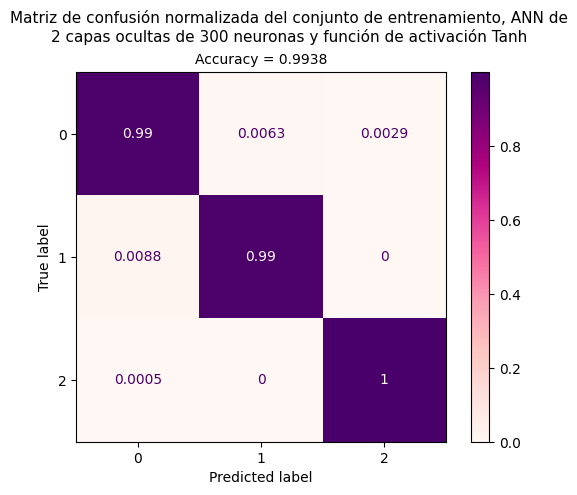

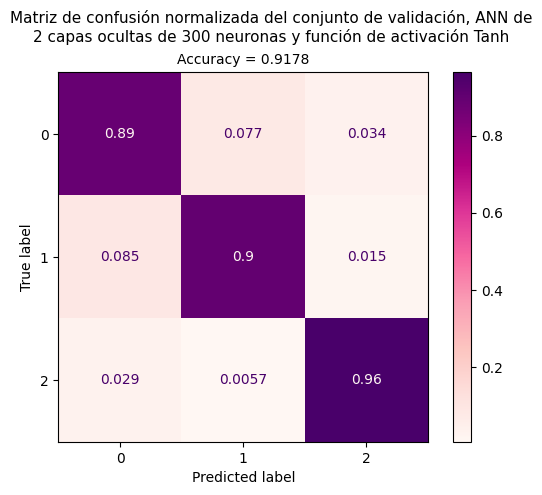


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 42
Mejor modelo en la época 42 con loss de validación = 0.231009


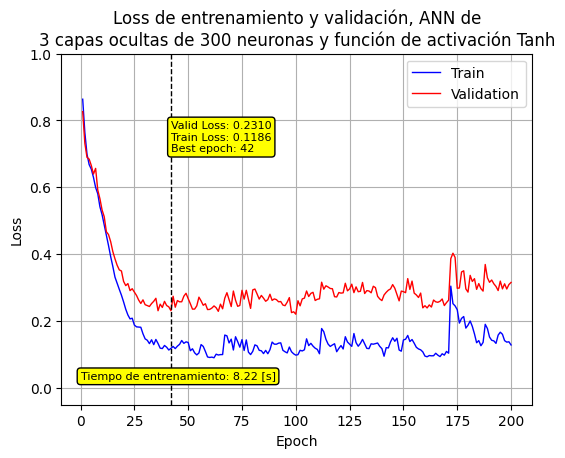

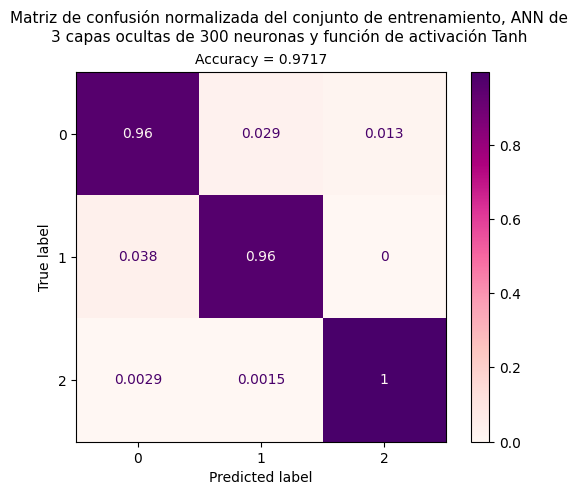

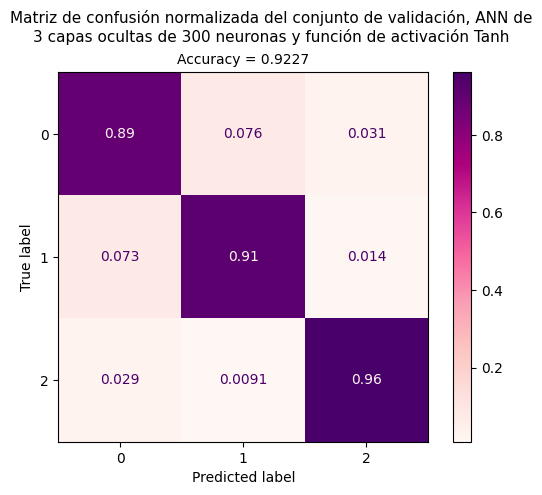


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 39
Mejor modelo en la época 39 con loss de validación = 0.342607


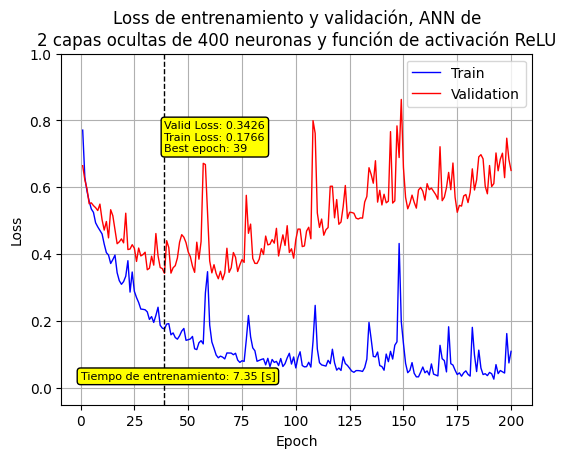

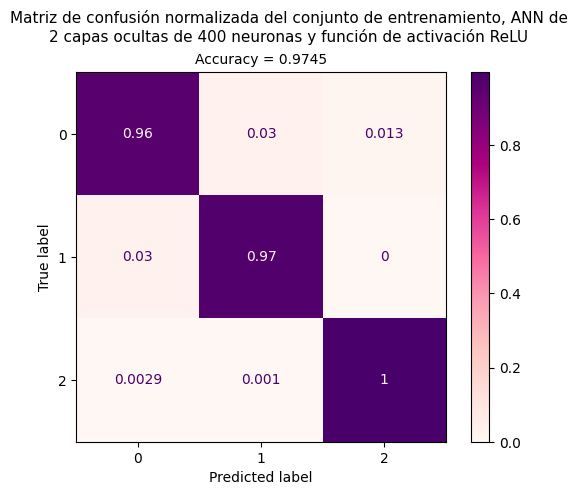

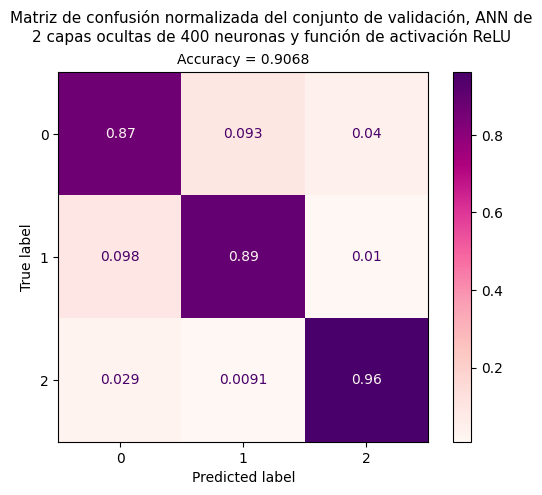


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.300067


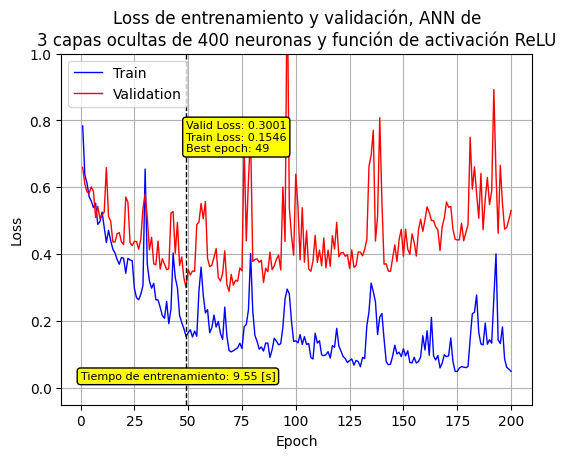

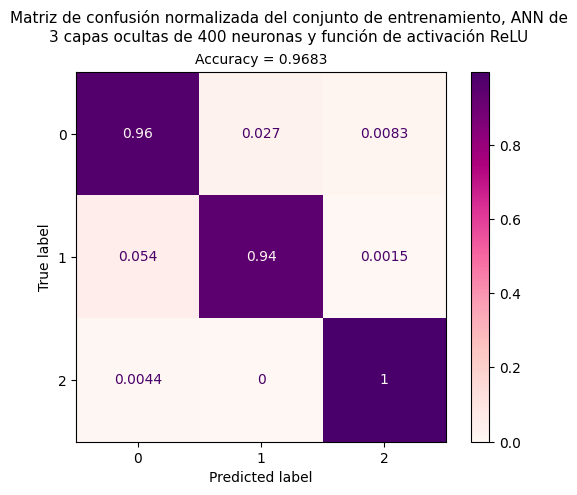

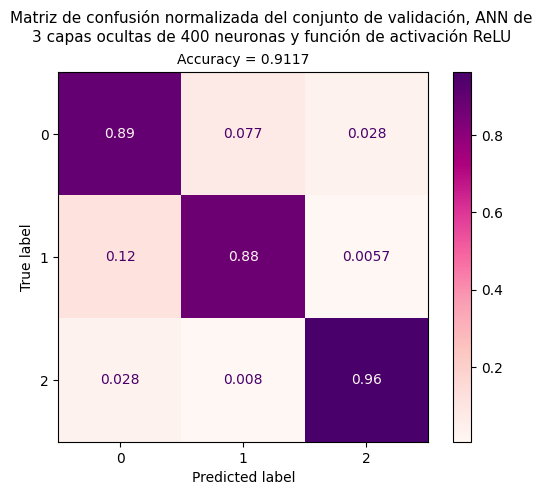


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 42
Mejor modelo en la época 42 con loss de validación = 0.252531


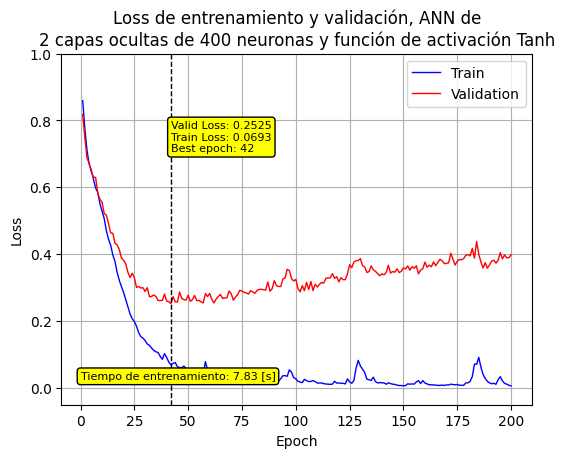

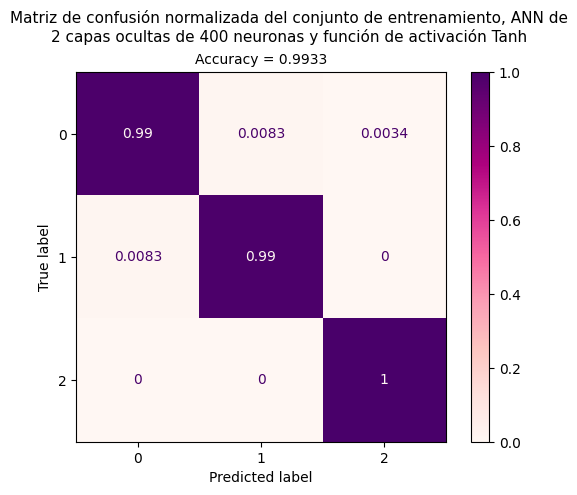

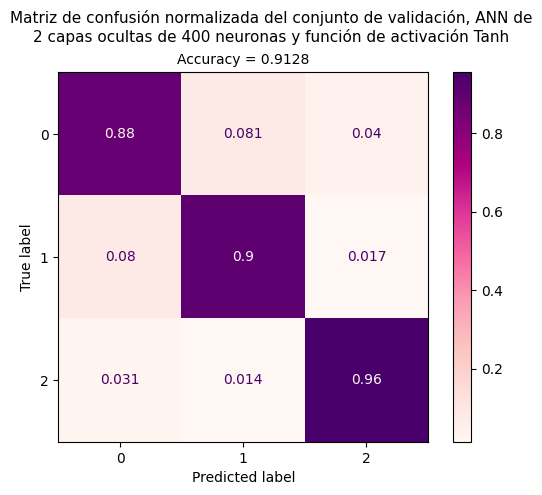


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 45
Mejor modelo en la época 45 con loss de validación = 0.225406


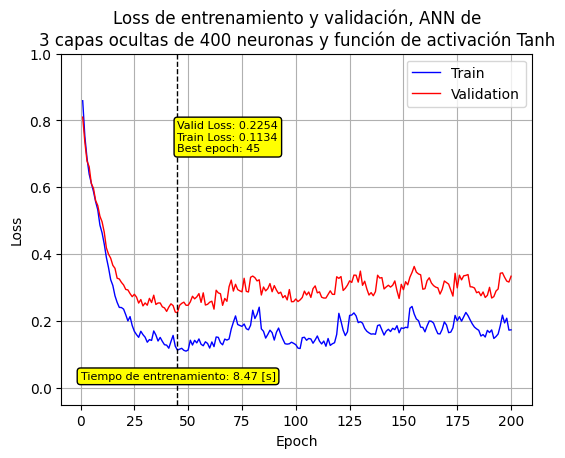

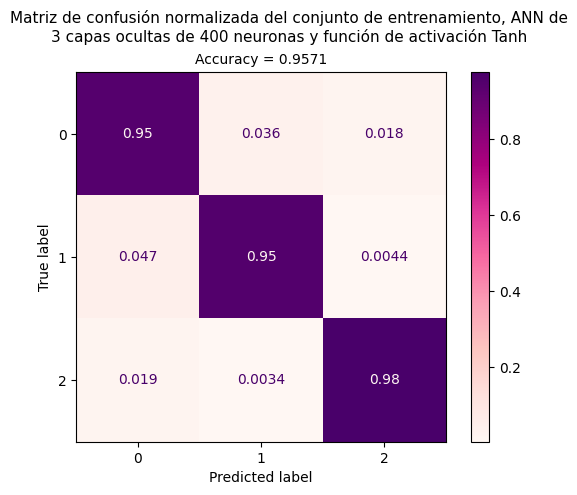

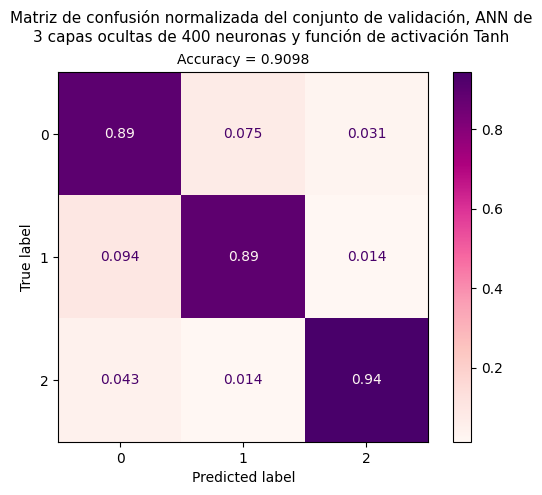

Early stopping at --------------------------------------------------> 46
Mejor modelo en la época 46 con loss de validación = 0.229757


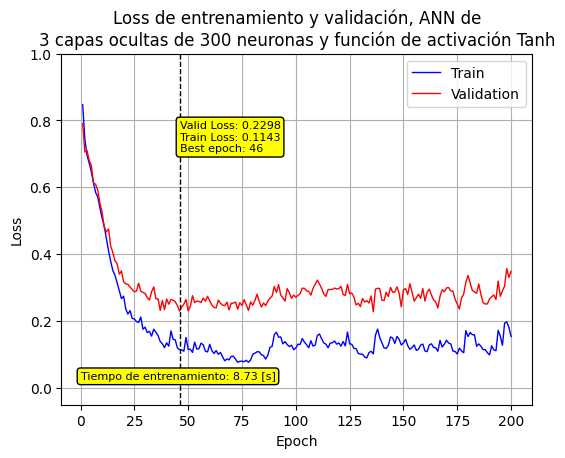

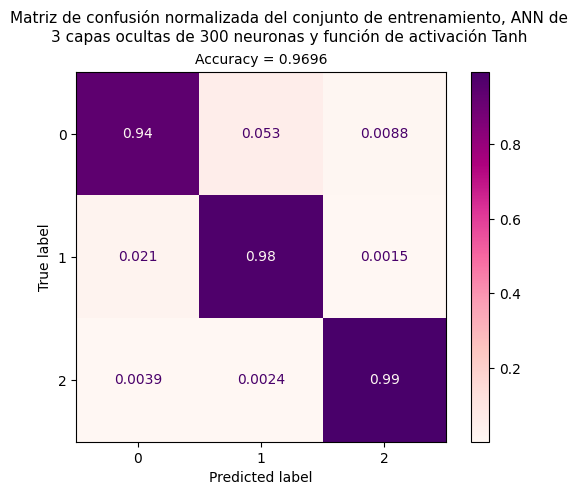

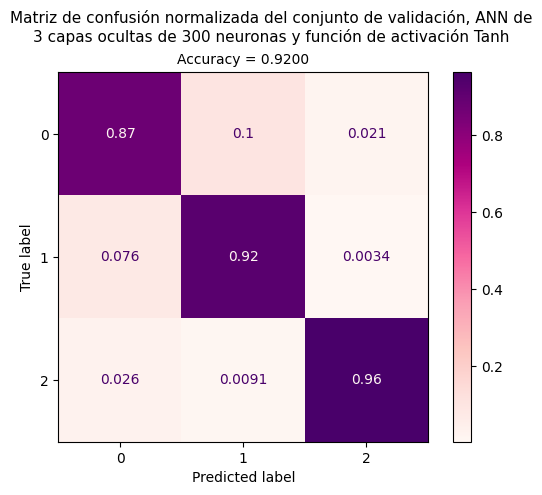

In [40]:
ruta = '/content/ANN/graficos/train/feature_selec/wrapper/' # Ruta para guardar los gráficos, variable global en este punto

hidden_sizes = [40, 90, 140, 200, 300, 400]
# hidden_sizes = [200, 300, 400]
# hidden_sizes = [300]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 200

patience = 15

gs_ann_wrapper = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_wrapper_GS, dataloader_val_wrapper_GS)
model_validated_wrapper, optimizer_wrapper = ANN_by_name(gs_ann_wrapper)

model_validated_wrapper = model_validated_wrapper.to(device)

model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated_wrapper, patience, n_epochs, optimizer_wrapper, dataloader_train_wrapper, dataloader_val_wrapper)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

In [41]:
gs_ann_wrapper

,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.231009,0.118565,42,8.218790,0.922698
2,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.233278,0.061912,52,8.923207,0.917772
3,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.252531,0.069311,42,7.826850,0.912846
4,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.297516,0.157701,71,11.782151,0.912846
5,model_400co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,400,0.001,0.300067,0.154610,49,9.552743,0.911709
6,model_90co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,90,0.001,0.262043,0.073345,100,14.805906,0.910193
7,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.225406,0.113365,45,8.467662,0.909814
8,model_200co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,200,0.001,0.250077,0.077255,58,10.629529,0.909435
9,model_200co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,200,0.001,0.300505,0.163447,50,9.127872,0.908678
10,model_400co2_ReLU,<class 'torch.nn.modules.activation.ReLU'>,2,400,0.001,0.342607,0.176619,39,7.348426,0.906783


## Selección empírica de características

In [33]:
dataloader_train_w_mean, dataloader_val_w_mean, dataloader_test_w_mean = dataloader_creator(df_train[[col for col in df_train.columns if col.startswith('mean_')]], y_train, df_val[[col for col in df_val.columns if col.startswith('mean_')]], y_val, df_test)
dataloader_train_w_mean_GS, dataloader_val_w_mean_GS = dataloader_creator_GS(df_val[[col for col in df_val_GS.columns if col.startswith('mean_')]], y_val)


Entrenando: model_40co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 113
Mejor modelo en la época 113 con loss de validación = 0.405351


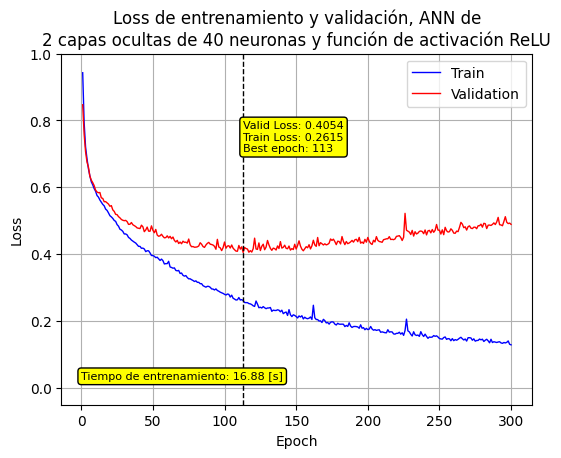

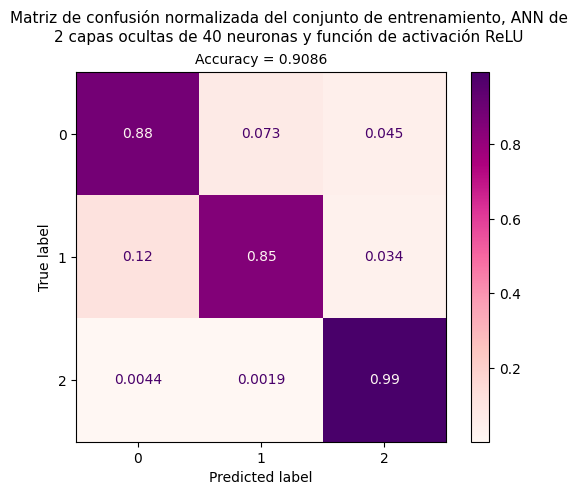

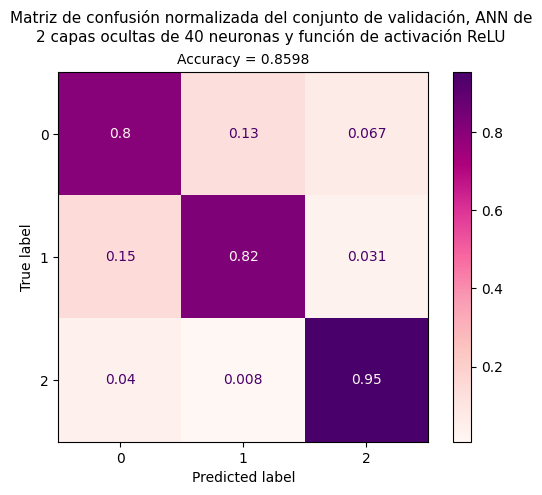


Entrenando: model_40co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 94
Mejor modelo en la época 94 con loss de validación = 0.402020


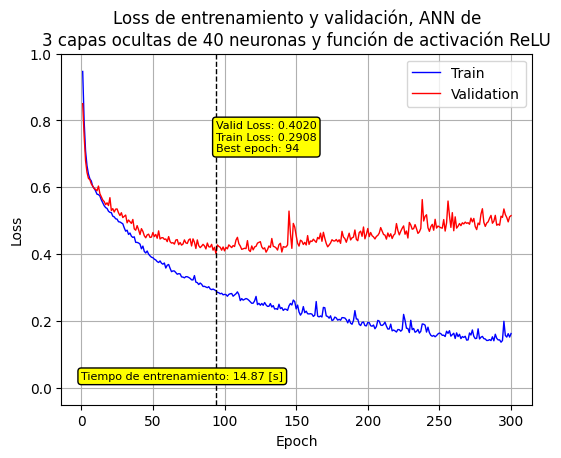

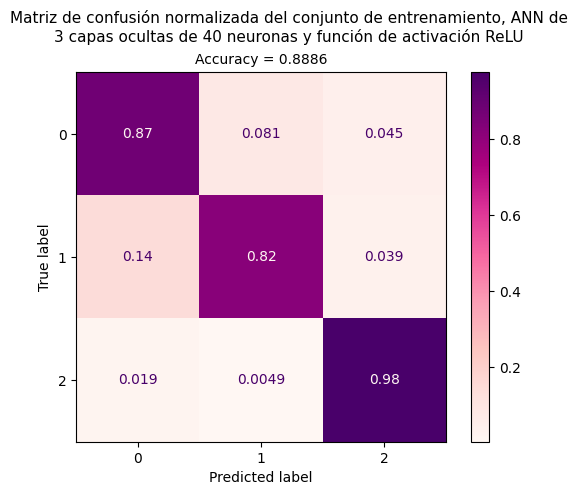

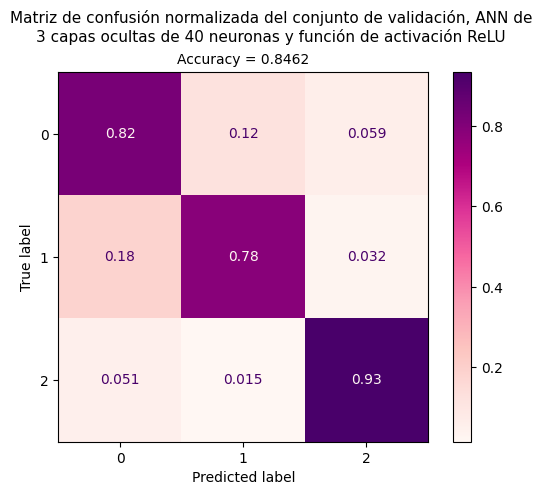


Entrenando: model_40co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 128
Mejor modelo en la época 128 con loss de validación = 0.392131


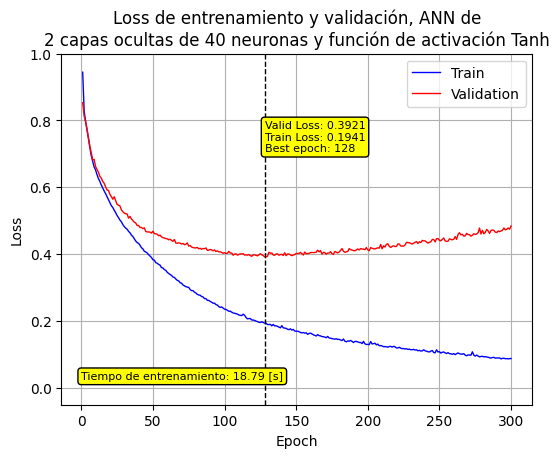

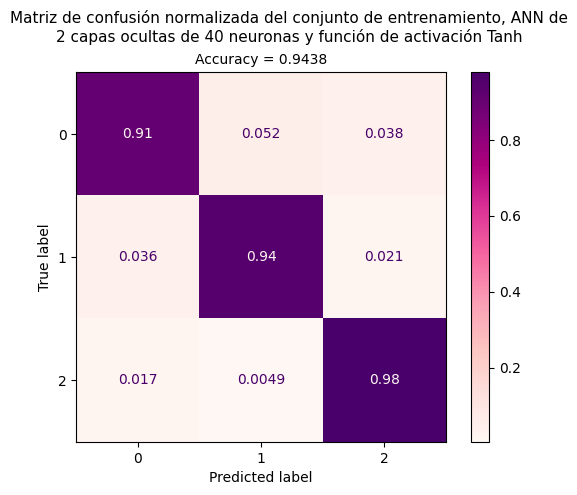

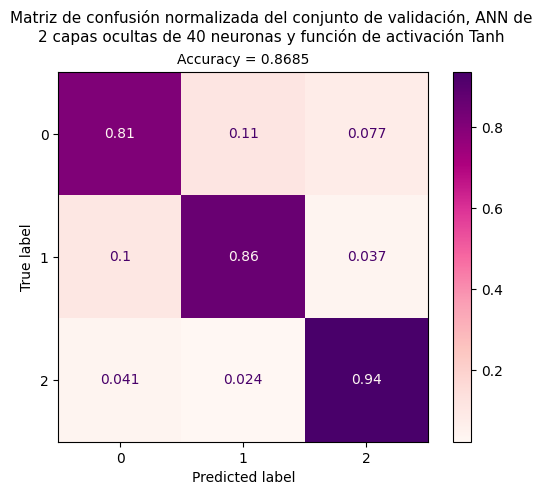


Entrenando: model_40co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 117
Mejor modelo en la época 117 con loss de validación = 0.387652


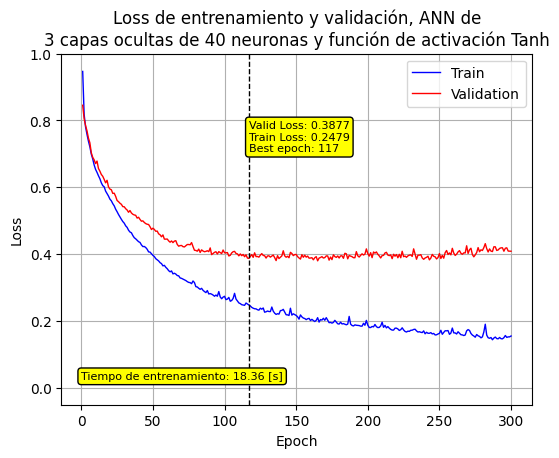

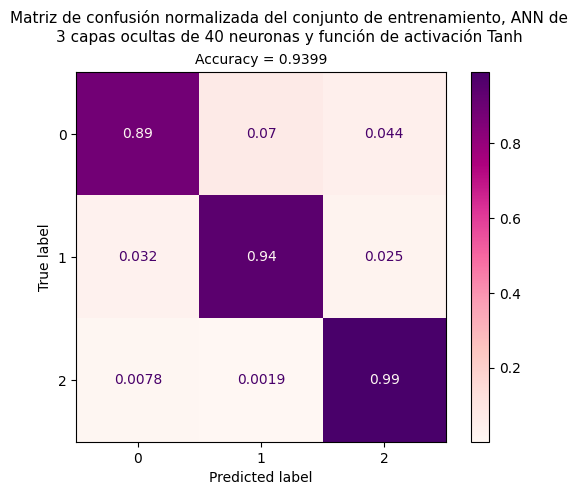

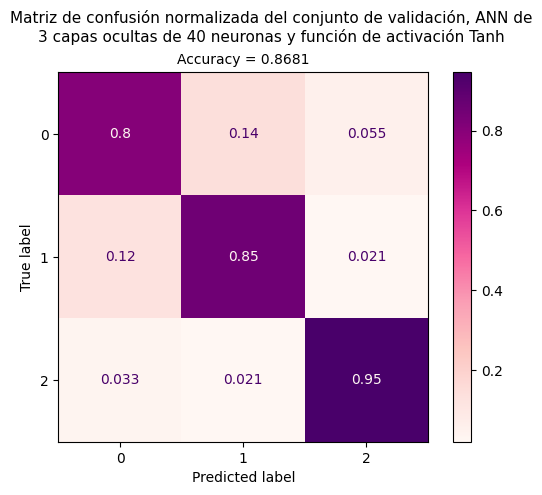


Entrenando: model_90co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 74
Mejor modelo en la época 74 con loss de validación = 0.377984


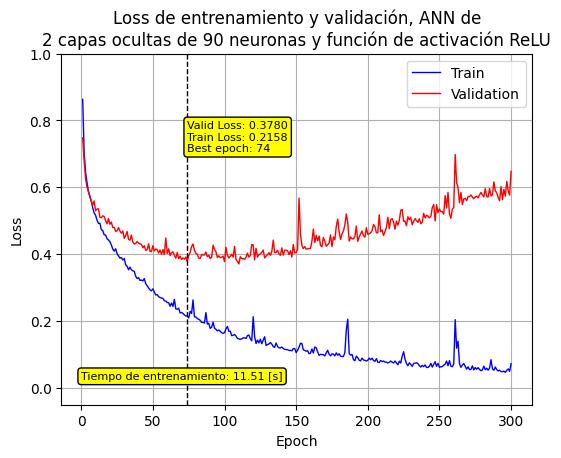

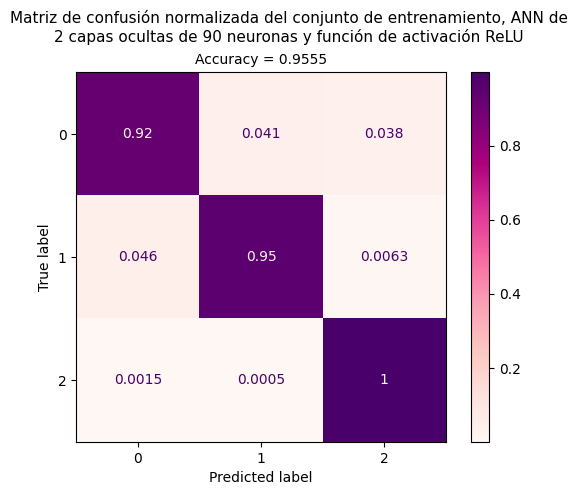

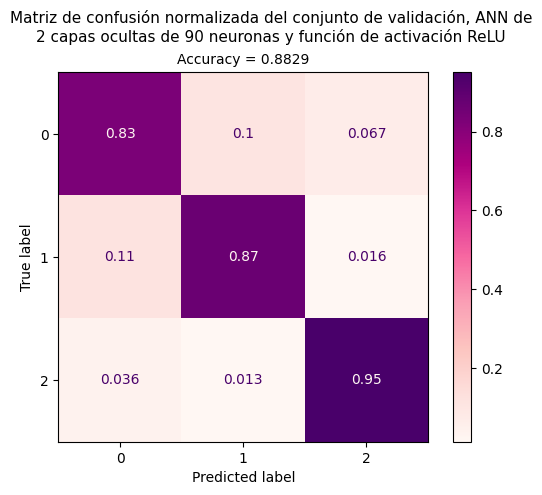


Entrenando: model_90co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 64
Mejor modelo en la época 64 con loss de validación = 0.377766


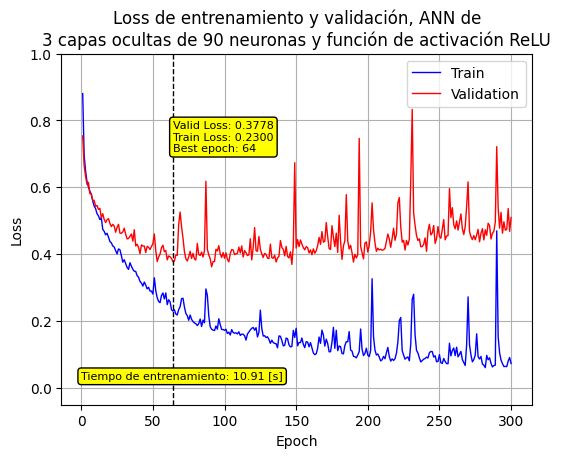

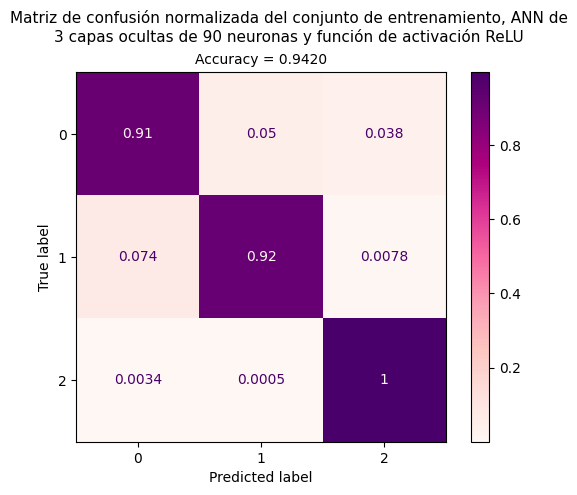

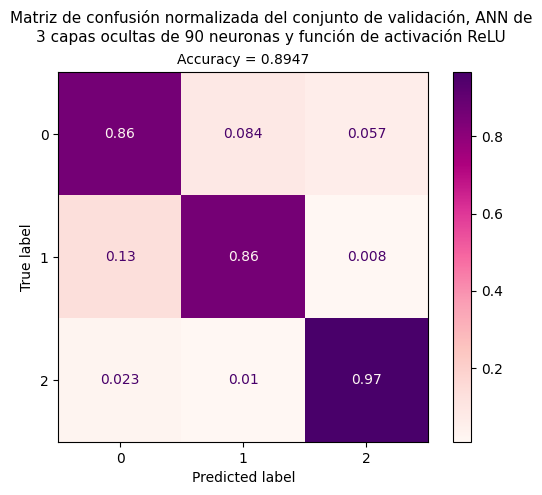


Entrenando: model_90co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 93
Mejor modelo en la época 93 con loss de validación = 0.311370


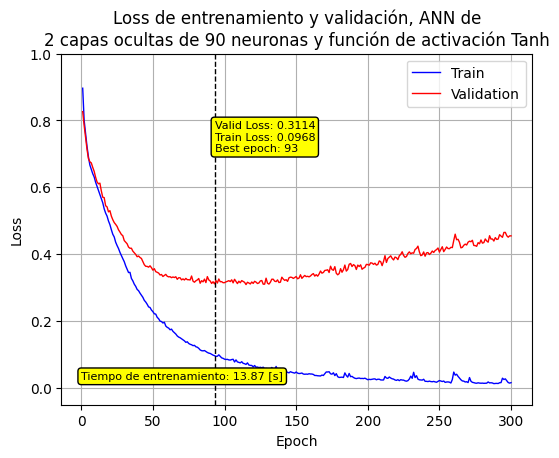

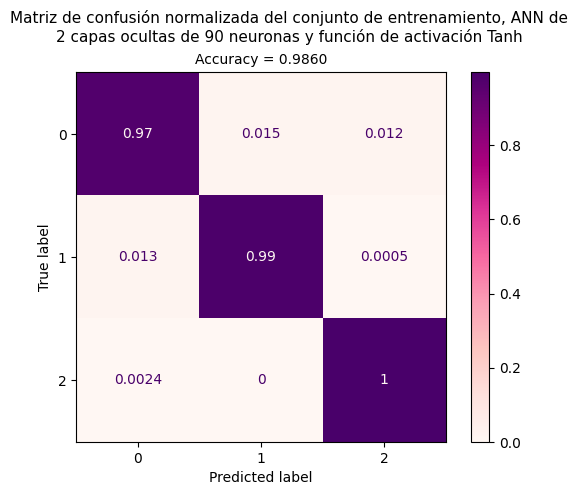

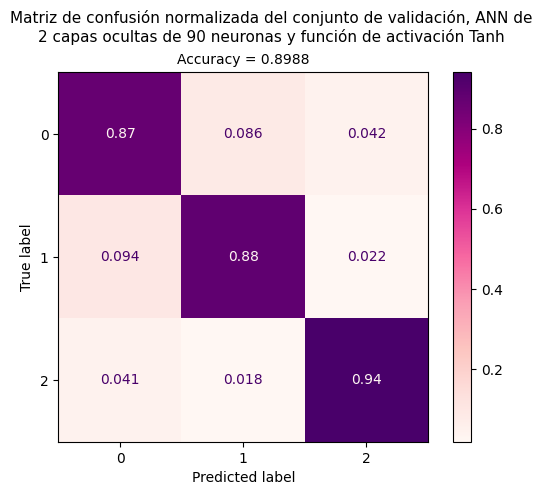


Entrenando: model_90co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 71
Mejor modelo en la época 71 con loss de validación = 0.349056


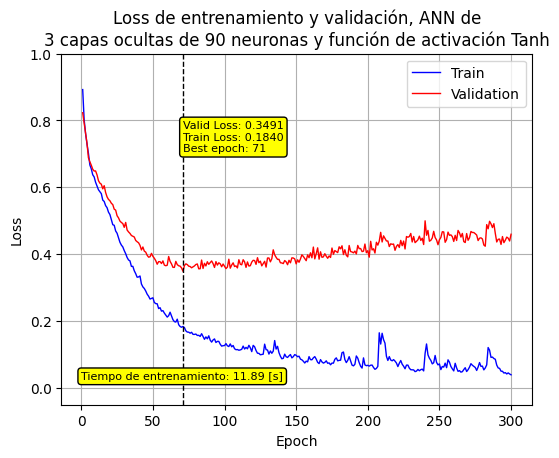

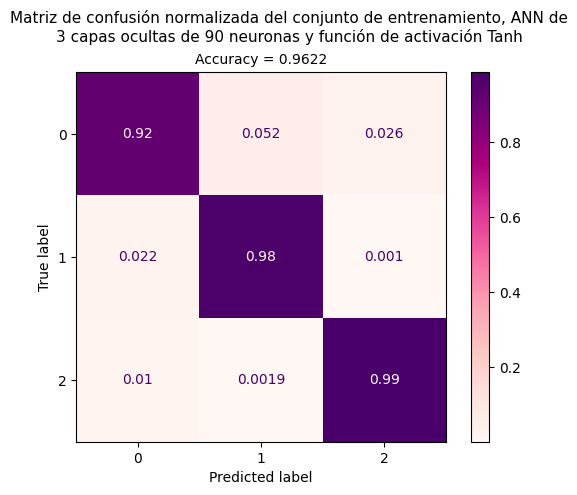

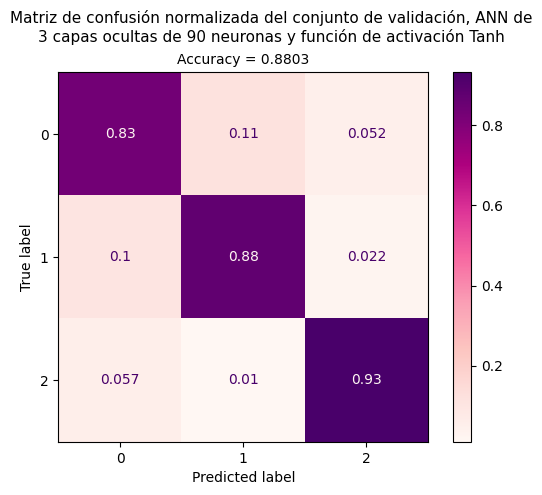


Entrenando: model_140co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 66
Mejor modelo en la época 66 con loss de validación = 0.378727


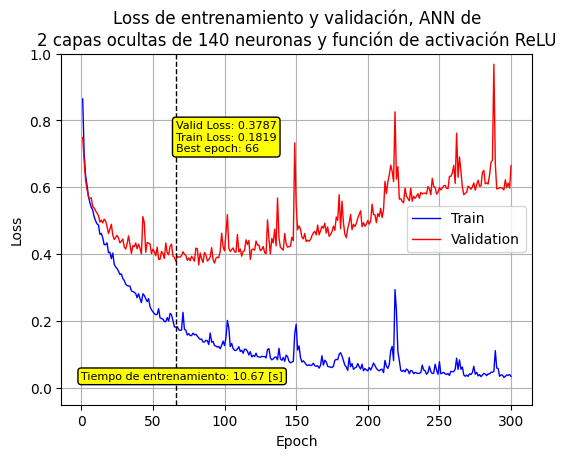

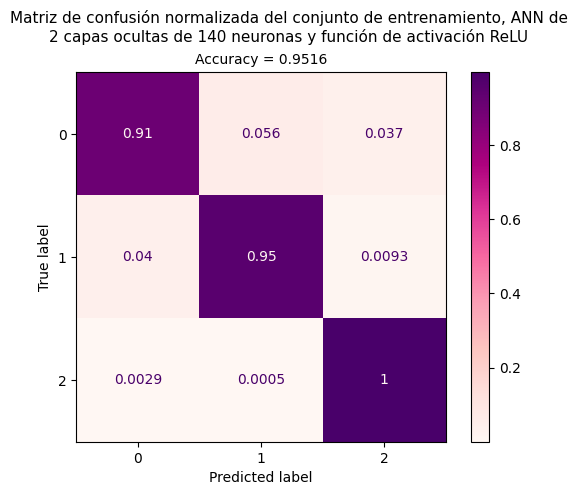

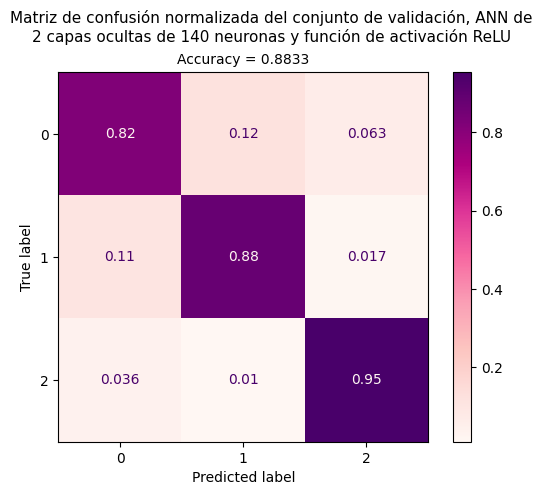


Entrenando: model_140co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 47
Mejor modelo en la época 47 con loss de validación = 0.347447


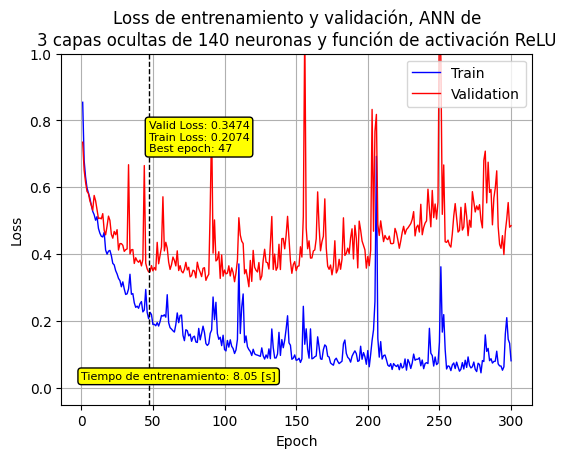

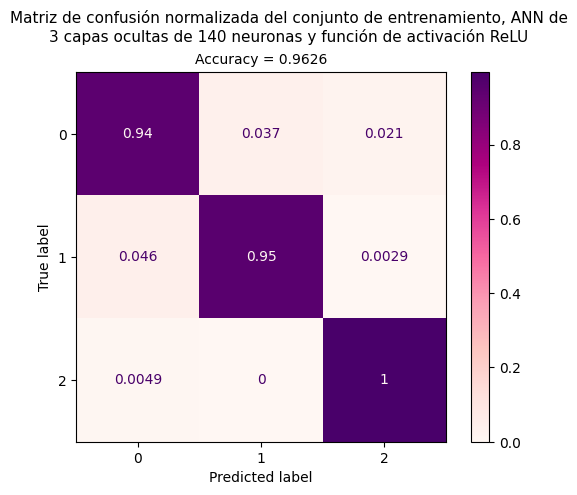

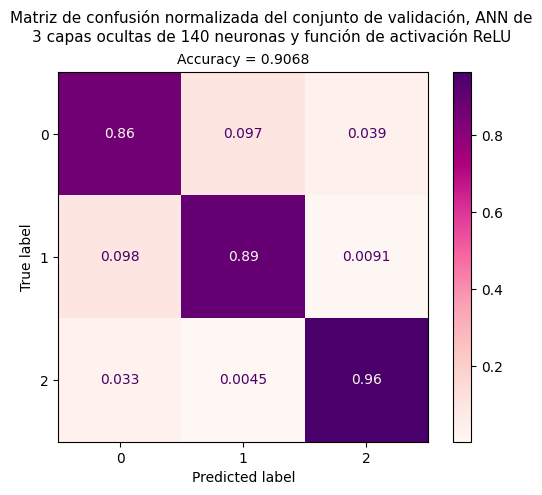


Entrenando: model_140co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 58
Mejor modelo en la época 58 con loss de validación = 0.289215


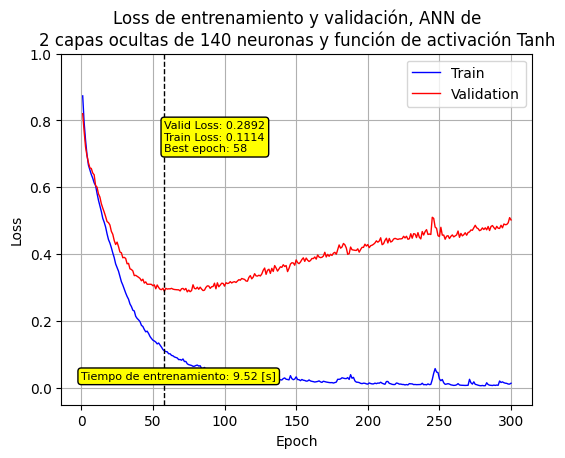

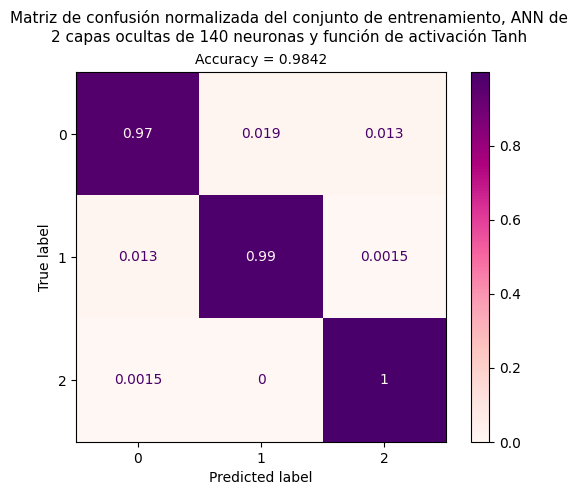

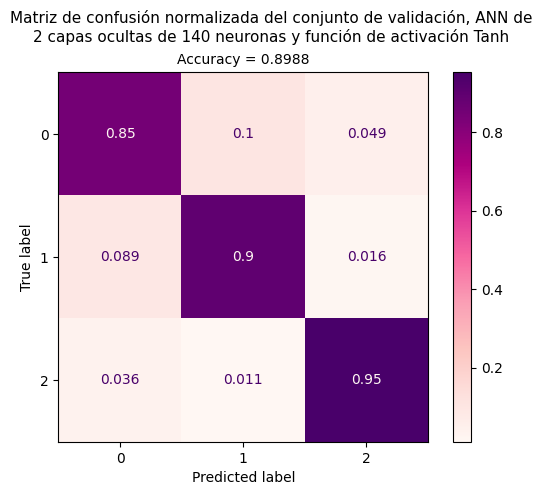


Entrenando: model_140co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 58
Mejor modelo en la época 58 con loss de validación = 0.273149


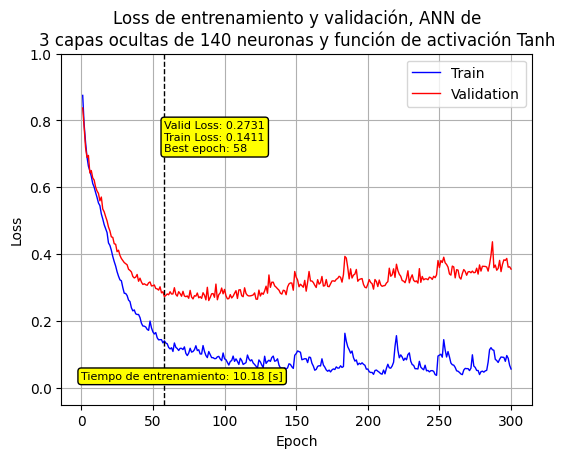

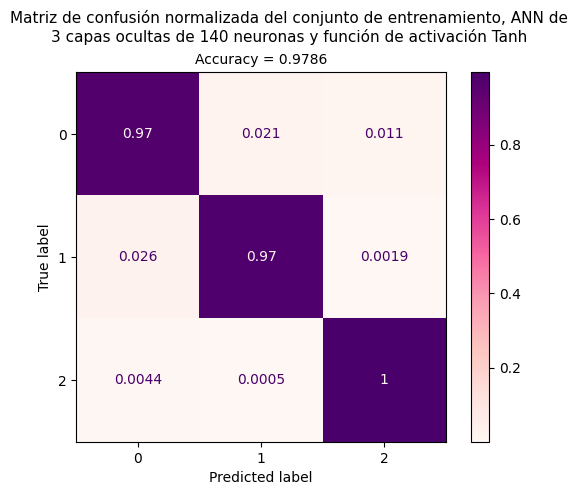

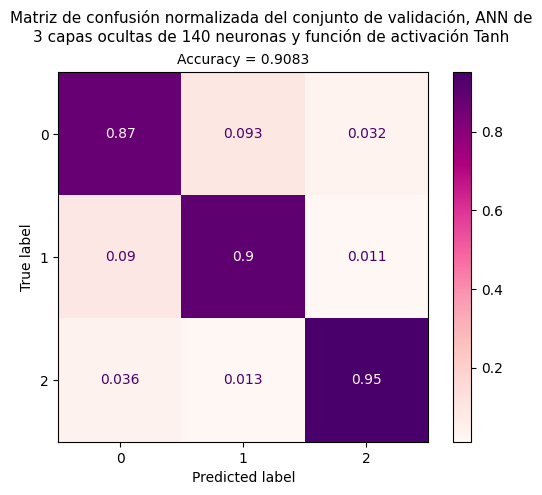


Entrenando: model_200co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 49
Mejor modelo en la época 49 con loss de validación = 0.359736


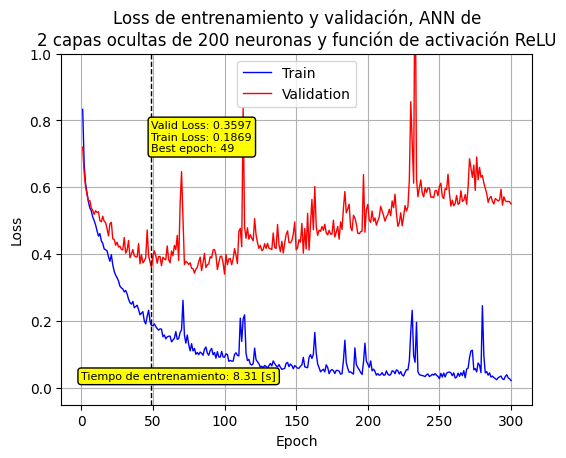

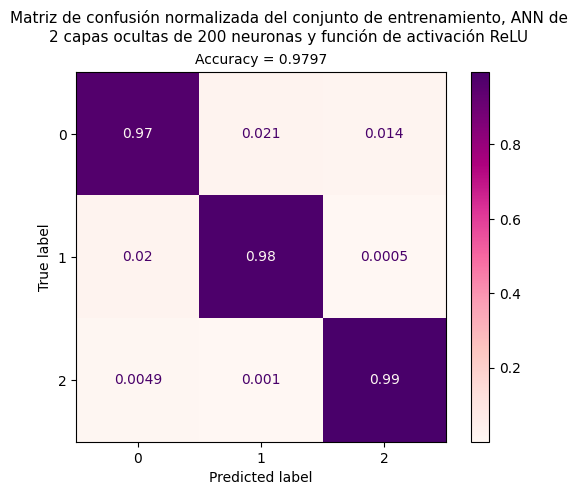

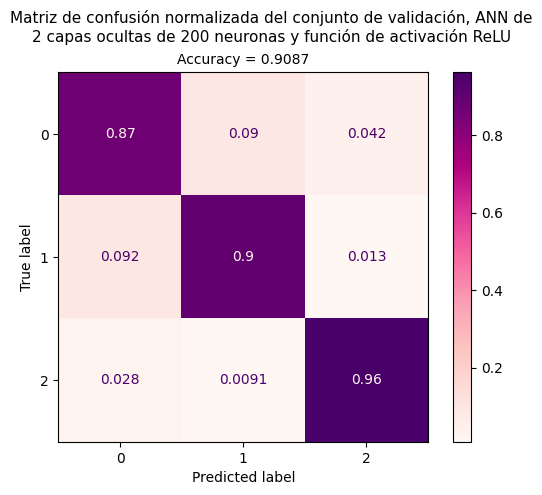


Entrenando: model_200co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 82
Mejor modelo en la época 82 con loss de validación = 0.312645


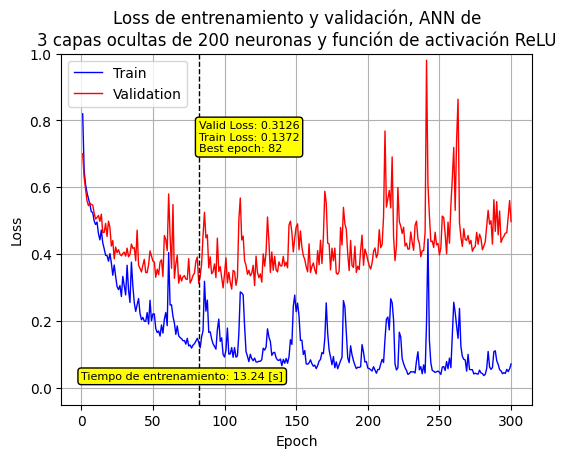

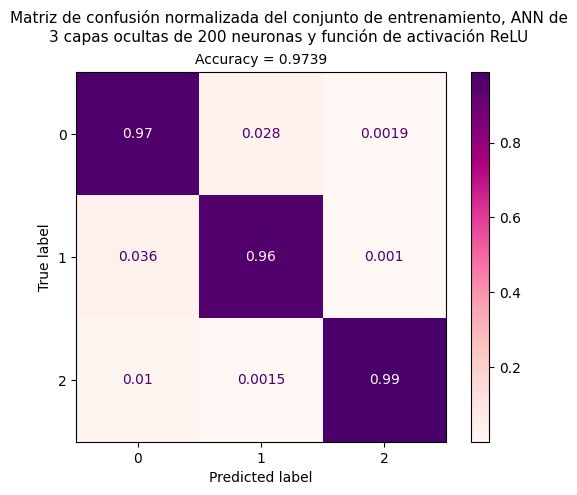

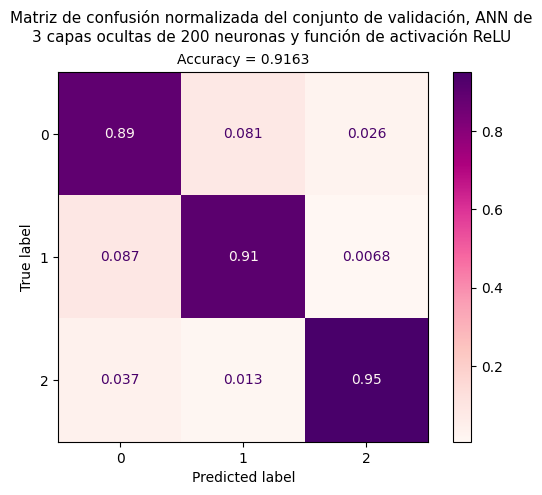


Entrenando: model_200co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 73
Mejor modelo en la época 73 con loss de validación = 0.260487


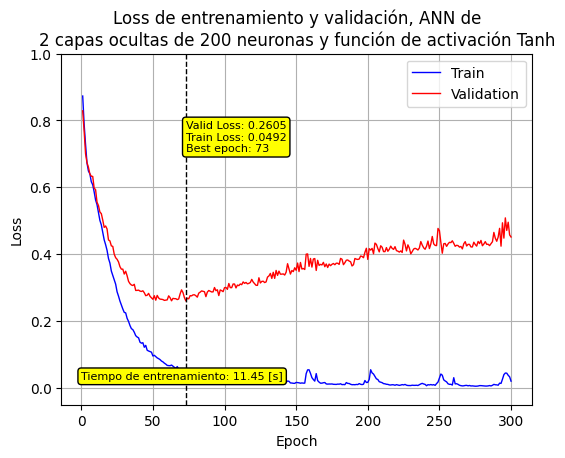

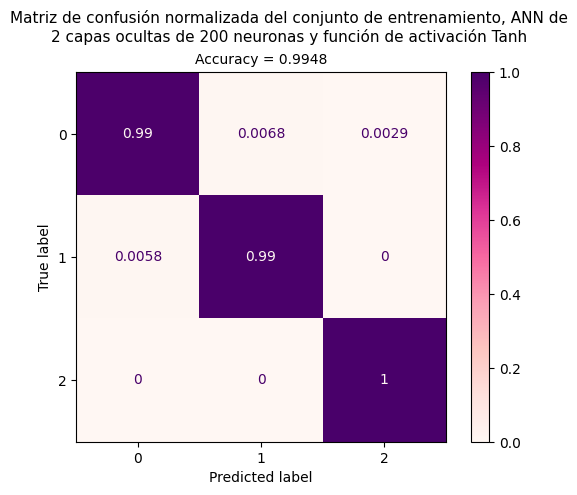

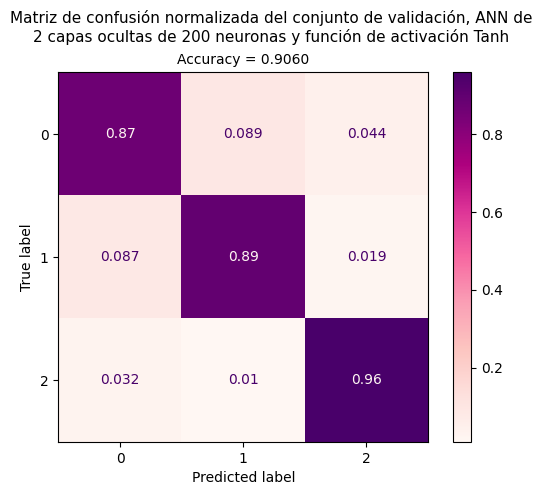


Entrenando: model_200co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 63
Mejor modelo en la época 63 con loss de validación = 0.243094


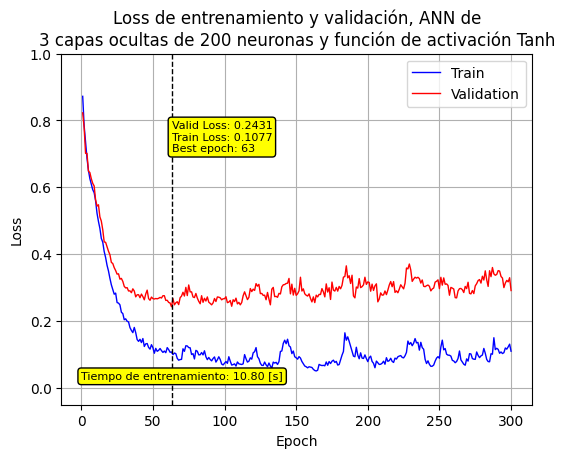

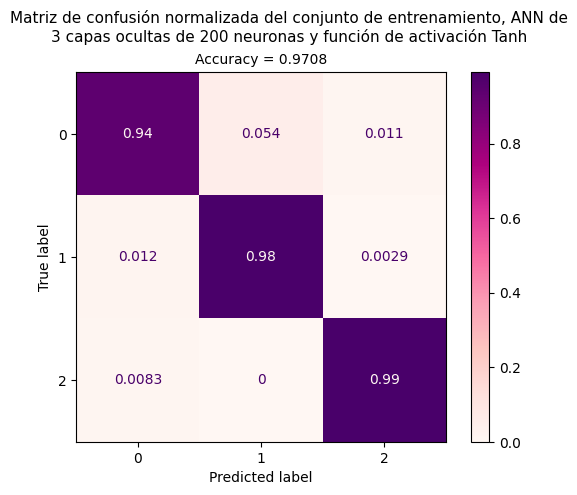

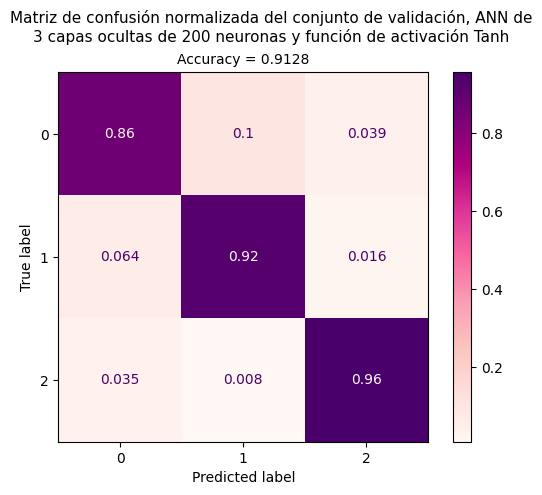


Entrenando: model_300co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 46
Mejor modelo en la época 46 con loss de validación = 0.342546


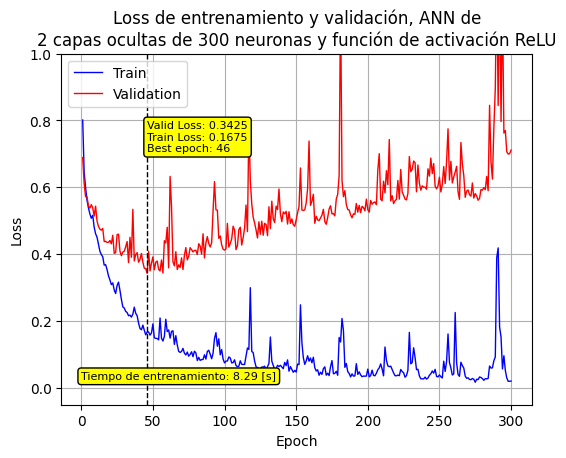

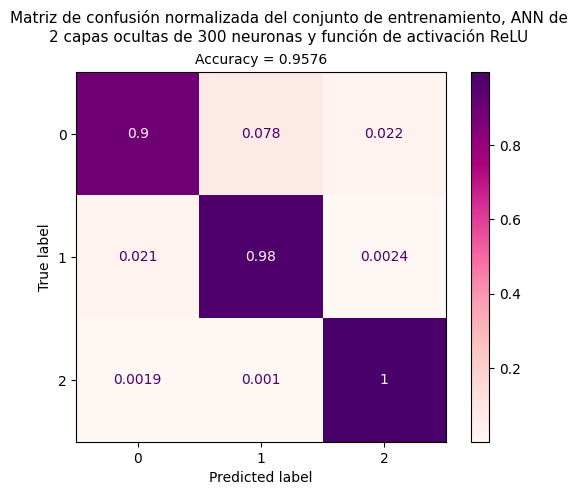

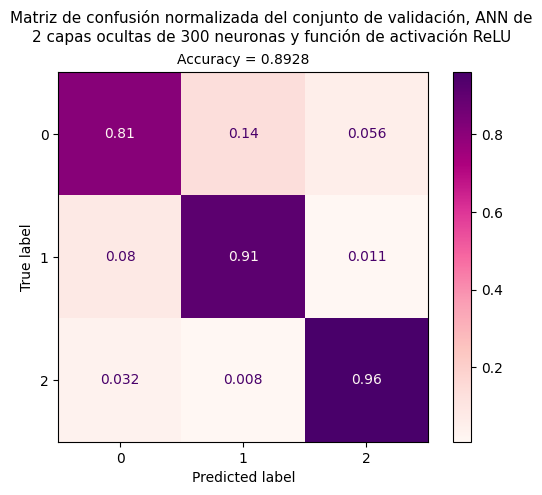


Entrenando: model_300co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 72
Mejor modelo en la época 72 con loss de validación = 0.276695


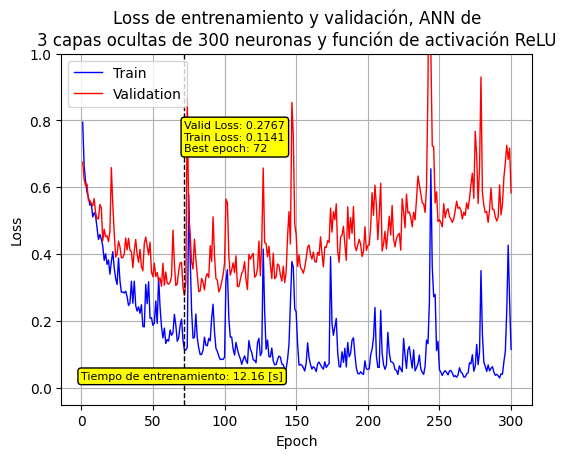

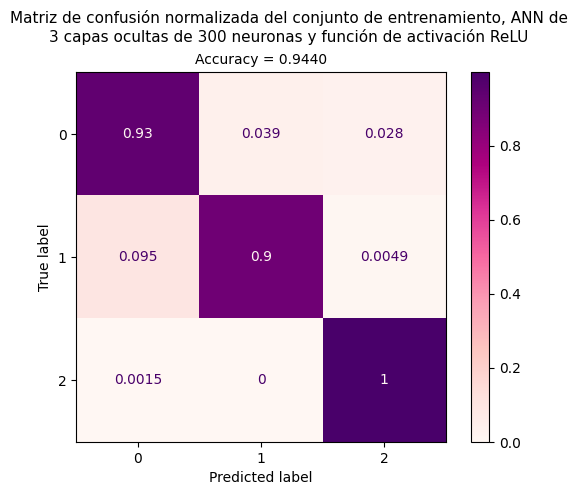

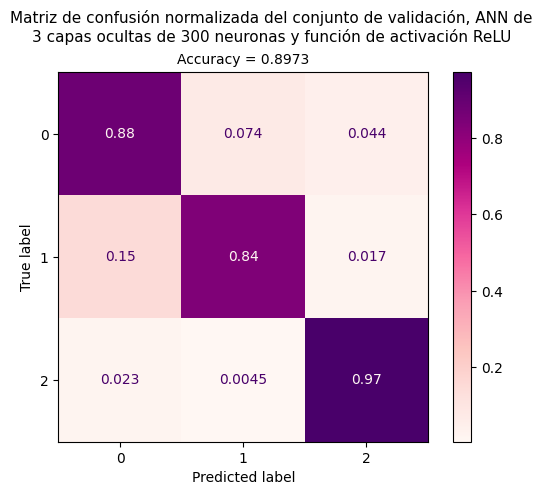


Entrenando: model_300co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 45
Mejor modelo en la época 45 con loss de validación = 0.236149


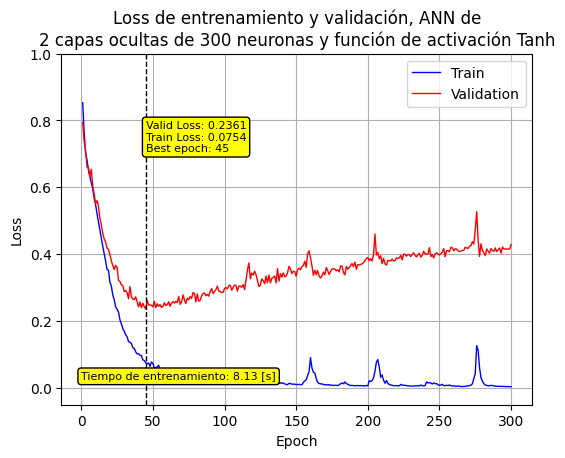

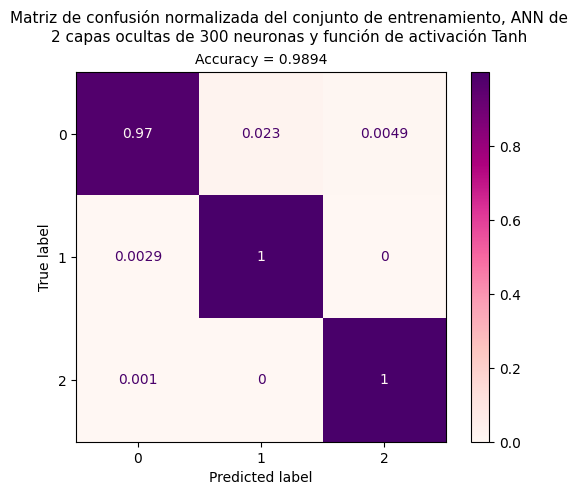

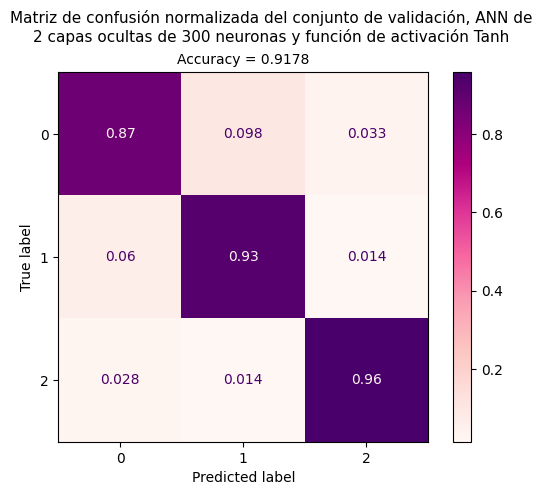


Entrenando: model_300co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 37
Mejor modelo en la época 37 con loss de validación = 0.245066


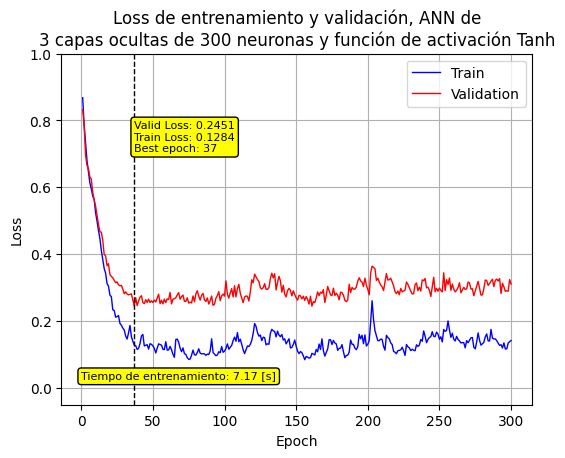

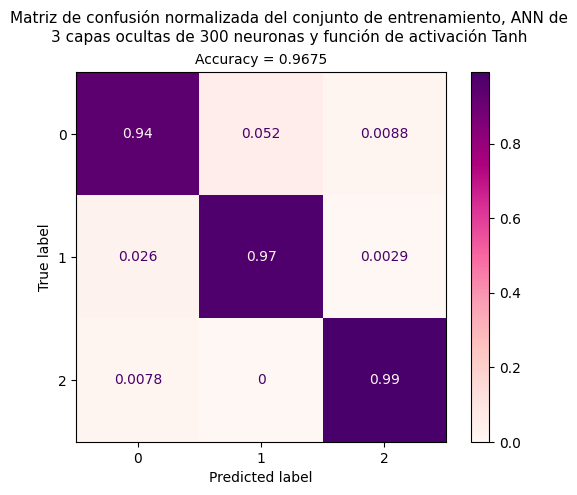

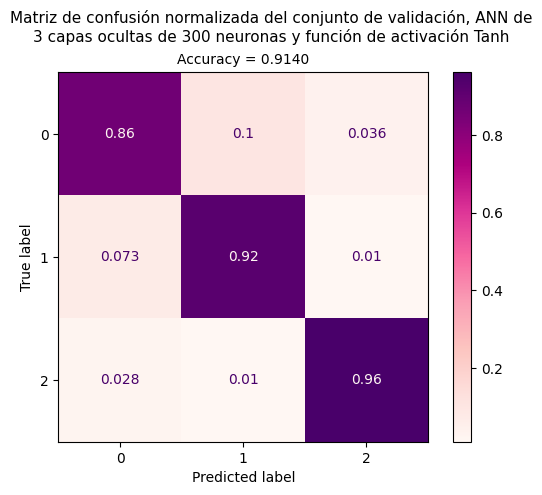


Entrenando: model_400co2_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 51
Mejor modelo en la época 51 con loss de validación = 0.335296


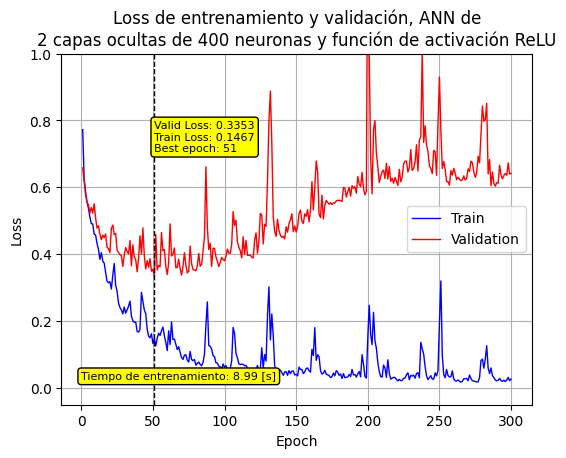

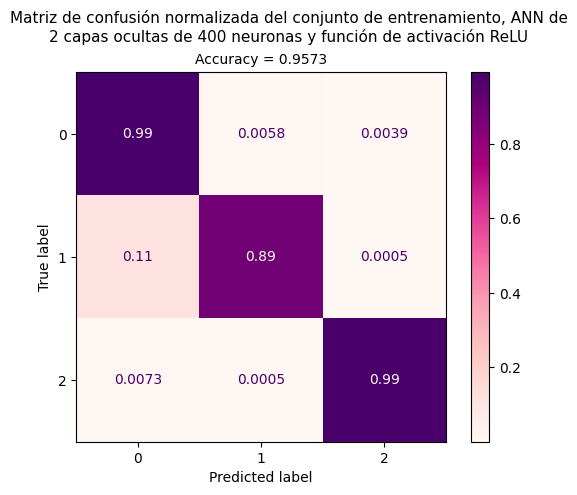

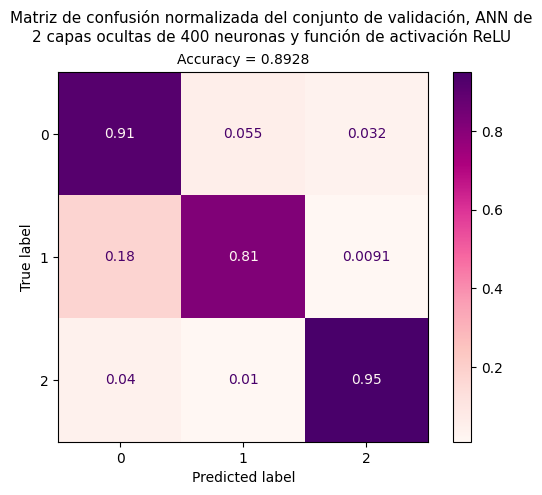


Entrenando: model_400co3_ReLU con LR=0.001
Early stopping at --------------------------------------------------> 38
Mejor modelo en la época 38 con loss de validación = 0.320179


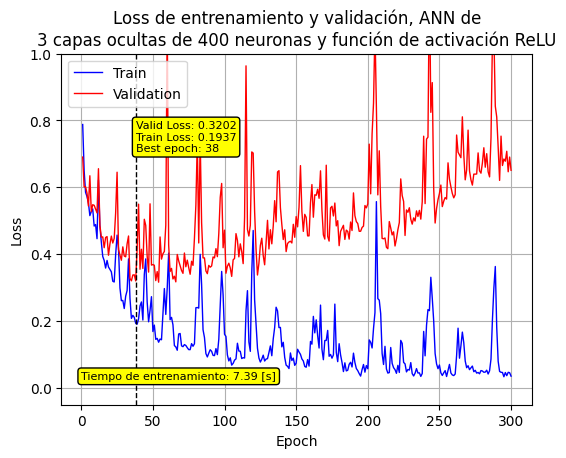

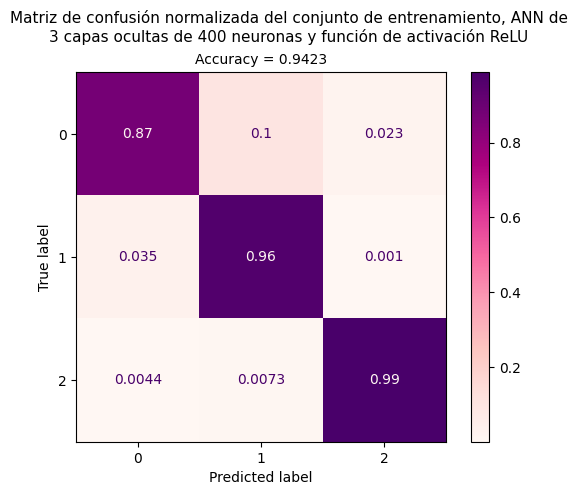

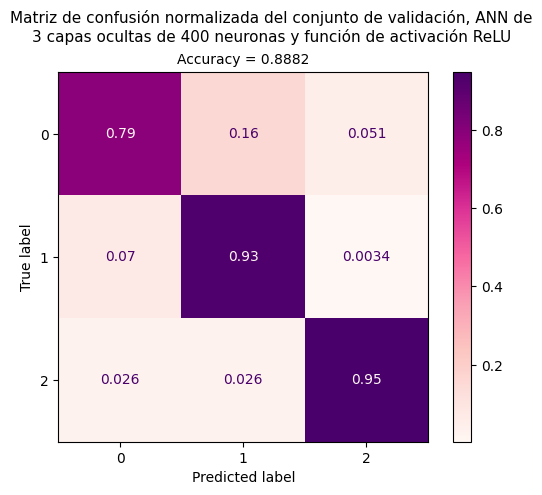


Entrenando: model_400co2_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 41
Mejor modelo en la época 41 con loss de validación = 0.244369


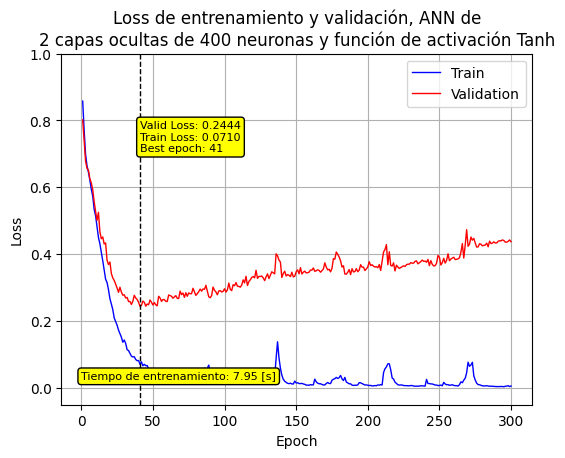

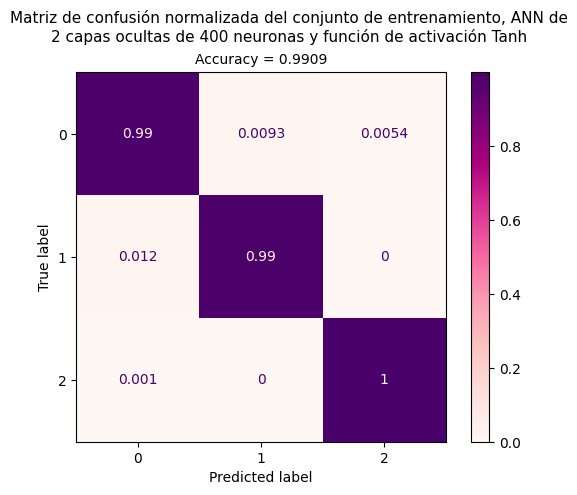

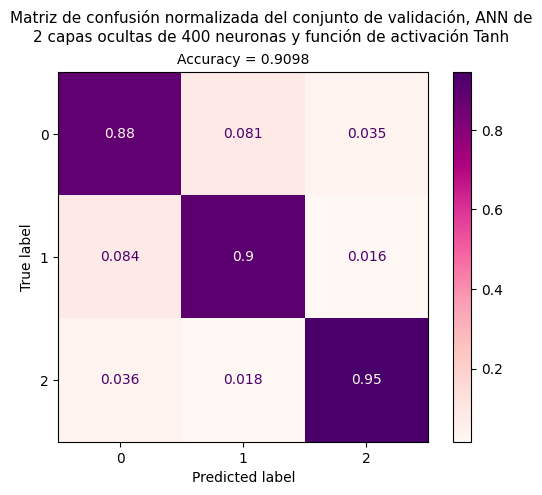


Entrenando: model_400co3_Tanh con LR=0.001
Early stopping at --------------------------------------------------> 45
Mejor modelo en la época 45 con loss de validación = 0.224936


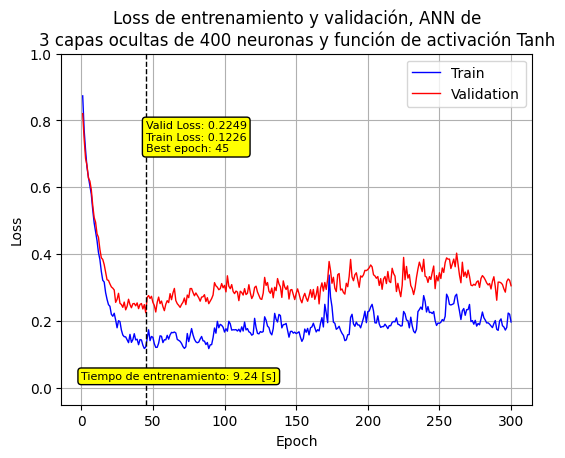

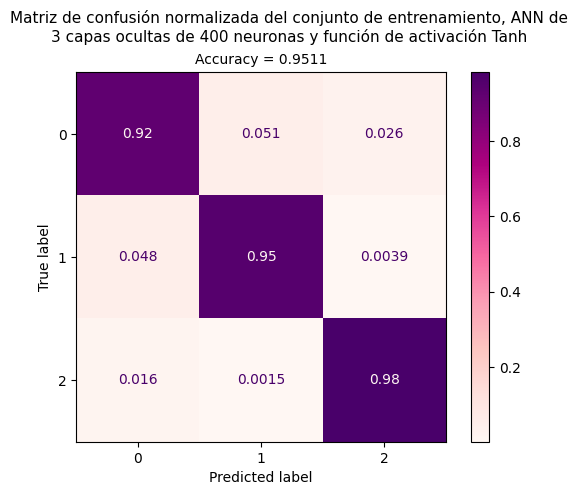

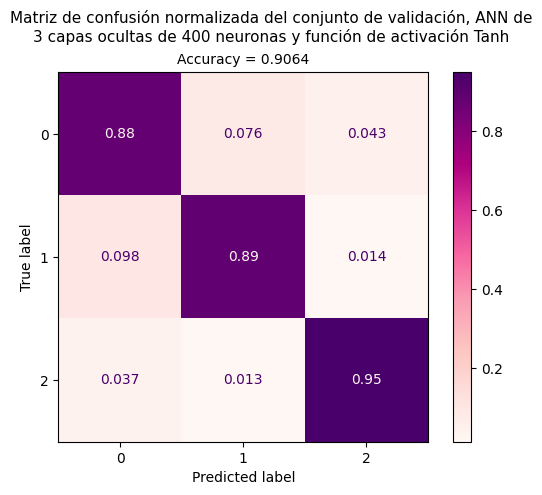

Early stopping at --------------------------------------------------> 63
Mejor modelo en la época 63 con loss de validación = 0.206473


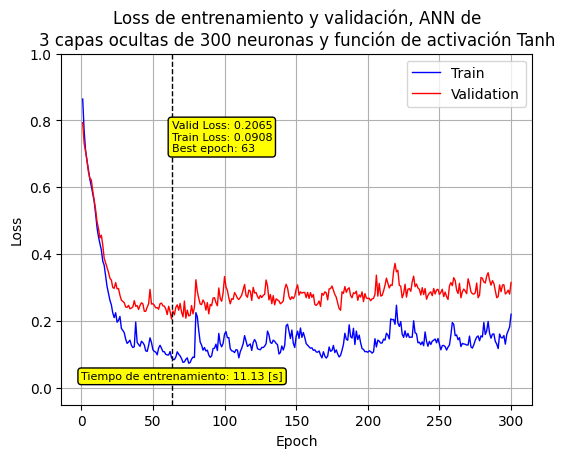

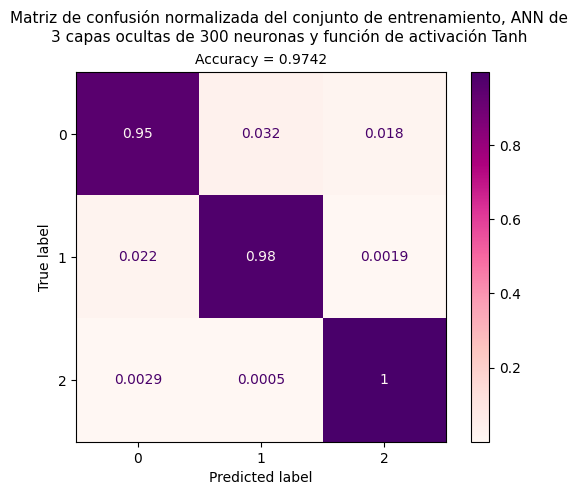

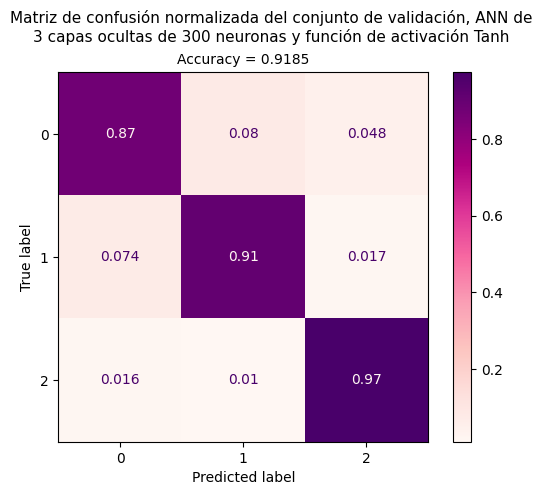

In [42]:
ruta = '/content/ANN/graficos/train/feature_selec/empiric/' # Ruta para guardar los gráficos, variable global en este punto

hidden_sizes = [40, 90, 140, 200, 300, 400]

activations = {'ReLU': nn.ReLU, 'Tanh': nn.Tanh}
# activations = {'Tanh': nn.Tanh}

num_hidden_layers = [2, 3]
# num_hidden_layers = [3]

learning_rates = [1e-3]

n_epochs = 300

patience = 15

gs_ann_w_mean = GS_ANN(hidden_sizes, activations, num_hidden_layers, learning_rates, n_epochs, patience, dataloader_train_w_mean_GS, dataloader_val_w_mean_GS)
model_validated_w_mean, optimizer_w_mean = ANN_by_name(gs_ann_wrapper)

model_validated_w_mean = model_validated_w_mean.to(device)

model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val = train_model_generic(model_validated_w_mean, patience, n_epochs, optimizer_w_mean, dataloader_train_w_mean, dataloader_val_w_mean)
acc_trained_model = results_ANN(model_trained, train_loss, valid_loss, t_time, best_ep, data_load_tr, data_load_val)

In [43]:
gs_ann_w_mean

,name,activation,layers,hidden_size,lr,valid_loss,train_loss,best_epoch,time,acc_val
1,model_300co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,300,0.001,0.236149,0.075381,45,8.130995,0.917772
2,model_200co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,200,0.001,0.312645,0.137200,82,13.237202,0.916256
3,model_300co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,300,0.001,0.245066,0.128368,37,7.170684,0.913983
4,model_200co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,200,0.001,0.243094,0.107729,63,10.795753,0.912846
5,model_400co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,400,0.001,0.244369,0.070988,41,7.952494,0.909814
6,model_200co2_ReLU,<class 'torch.nn.modules.activation.ReLU'>,2,200,0.001,0.359736,0.186870,49,8.310029,0.908678
7,model_140co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,140,0.001,0.273149,0.141119,58,10.182512,0.908299
8,model_140co3_ReLU,<class 'torch.nn.modules.activation.ReLU'>,3,140,0.001,0.347447,0.207386,47,8.052520,0.906783
9,model_400co3_Tanh,<class 'torch.nn.modules.activation.Tanh'>,3,400,0.001,0.224936,0.122609,45,9.235813,0.906404
10,model_200co2_Tanh,<class 'torch.nn.modules.activation.Tanh'>,2,200,0.001,0.260487,0.049247,73,11.448672,0.906025
